# Evaluating your SAE

Code based off Rob Graham's ([themachinefan](https://github.com/themachinefan)) SAE evaluation code.

In [2]:
import os
os.getcwd()

'/workspace/ViT-Prisma/src/vit_prisma/sae/evals'

In [3]:
import einops
import torch
import torchvision

import plotly.express as px

from tqdm import tqdm

import numpy as np
import os
import requests

# Setup

In [4]:
from dataclasses import dataclass
from vit_prisma.sae.config import VisionModelSAERunnerConfig

@dataclass
class EvalConfig(VisionModelSAERunnerConfig):
    sae_path: str = '/workspace/sae_checkpoints/8e32860c-clip-b-sae-gated-all-tokens-x64-layer-9-mlp-out-v1/n_images_260014.pt'
    model_name: str = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
    model_type: str =  "clip"
    patch_size: str = 32

    dataset_path = "/workspace"
    dataset_train_path: str = "/workspace/ILSVRC/Data/CLS-LOC/train"
    dataset_val_path: str = "/workspace/ILSVRC/Data/CLS-LOC/val"

    verbose: bool = True

    device: bool = 'cuda'

    eval_max: int = 50_000 # 50_000
    batch_size: int = 32

    # make the max image output folder a subfolder of the sae path


    @property
    def max_image_output_folder(self) -> str:
        # Get the base directory of sae_checkpoints
        sae_base_dir = os.path.dirname(os.path.dirname(self.sae_path))
        
        # Get the name of the original SAE checkpoint folder
        sae_folder_name = os.path.basename(os.path.dirname(self.sae_path))
        
        # Create a new folder path in sae_checkpoints/images with the original name
        output_folder = os.path.join(sae_base_dir, 'max_images', sae_folder_name)
        output_folder = os.path.join(output_folder, f"layer_{self.hook_point_layer}") # Add layer number

        
        # Ensure the directory exists
        os.makedirs(output_folder, exist_ok=True)
        
        return output_folder

cfg = EvalConfig()

n_tokens_per_buffer (millions): 0.032
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 13000000
Total wandb updates: 15869
Expansion factor: 16
n_tokens_per_feature_sampling_window (millions): 204.8
n_tokens_per_dead_feature_window (millions): 1024.0
Using Ghost Grads.
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder


In [5]:
torch.set_grad_enabled(False)

## Load model

In [4]:
from vit_prisma.models.base_vit import HookedViT

model_name = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
model = HookedViT.from_pretrained(model_name, is_timm=False, is_clip=True).to(cfg.device)
 

model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Official model name open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Converting OpenCLIP weights
model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
visual projection shape torch.Size([768, 512])
Setting center_writing_weights to False for OpenCLIP
Setting fold_ln to False for OpenCLIP
Loaded pretrained model open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K into HookedTransformer


## Load datasets

In [16]:
import importlib
import vit_prisma
# importlib.reload(vit_prisma.dataloaders.imagenet_dataset)

In [17]:
# load dataset
import open_clip
from vit_prisma.utils.data_utils.imagenet_utils import setup_imagenet_paths
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_transforms_clip, ImageNetValidationDataset

from torchvision import transforms
from transformers import CLIPProcessor

og_model_name = "hf-hub:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
og_model, _, preproc = open_clip.create_model_and_transforms(og_model_name)
processor = preproc

size=224

data_transforms = transforms.Compose([
    transforms.Resize((size, size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                     std=[0.26862954, 0.26130258, 0.27577711]),
])
    
imagenet_paths = setup_imagenet_paths(cfg.dataset_path)
imagenet_paths["train"] = "/workspace/ILSVRC/Data/CLS-LOC/train"
imagenet_paths["val"] = "/workspace/ILSVRC/Data/CLS-LOC/val"
imagenet_paths["val_labels"] = "/workspace/LOC_val_solution.csv"
imagenet_paths["label_strings"] = "/workspace/LOC_synset_mapping.txt"
print()
train_data = torchvision.datasets.ImageFolder(cfg.dataset_train_path, transform=data_transforms)
val_data = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'], 
                                data_transforms,
                                return_index=True,
)
val_data_visualize = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'],
                                torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),]), return_index=True)

print(f"Validation data length: {len(val_data)}") if cfg.verbose else None



Validation data length: 50000


In [18]:
from vit_prisma.sae.training.activations_store import VisionActivationsStore
# import dataloader
from torch.utils.data import DataLoader

# activations_loader = VisionActivationsStore(cfg, model, train_data, eval_dataset=val_data)
val_dataloader = DataLoader(val_data, batch_size=cfg.batch_size, shuffle=False, num_workers=4)


## Load pretrained SAE to evaluate

In [19]:
from vit_prisma.sae.sae import SparseAutoencoder
sparse_autoencoder = SparseAutoencoder(cfg).load_from_pretrained("/workspace/sae_checkpoints/8e32860c-clip-b-sae-gated-all-tokens-x64-layer-9-mlp-out-v1/n_images_2600058.pt")
sparse_autoencoder.to(cfg.device)
sparse_autoencoder.eval()  # prevents error if we're expecting a dead neuron mask for who 


get_activation_fn received: activation_fn=relu, kwargs={}
n_tokens_per_buffer (millions): 0.032
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 13000000
Total wandb updates: 1586
Expansion factor: 64
n_tokens_per_feature_sampling_window (millions): 204.8
n_tokens_per_dead_feature_window (millions): 1024.0
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder
get_activation_fn received: activation_fn=relu, kwargs={}


SparseAutoencoder(
  (hook_sae_in): HookPoint()
  (hook_hidden_pre): HookPoint()
  (hook_hidden_post): HookPoint()
  (hook_sae_out): HookPoint()
  (activation_fn): ReLU()
)

# Evaluate sparsity

## Get feature probability

In [9]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

@torch.no_grad()
def get_feature_probability(images, model, sparse_autoencoder):
    _, cache = model.run_with_cache(images, names_filter=[sparse_autoencoder.cfg.hook_point])
    sae_out, feature_acts, loss, mse_loss, l1_loss, mse_loss_ghost_resid, aux_reconstruction_loss = sparse_autoencoder(
        cache[sparse_autoencoder.cfg.hook_point]
    )

    # Flatten first two dimensions (batch, position) to get a 2D tensor of activations
    return (feature_acts.abs() > 0).float().flatten(0, 1)

def process_dataset(val_dataloader, model, sparse_autoencoder, cfg):
    total_acts = None
    total_tokens = 0
    
    for idx, batch in tqdm(enumerate(val_dataloader), total=cfg.eval_max//cfg.batch_size):
        images = batch[0]

        images = images.to(cfg.device)
        sae_activations = get_feature_probability(images, model, sparse_autoencoder)
        
        if total_acts is None:
            total_acts = sae_activations.sum(0)
        else:
            total_acts += sae_activations.sum(0)
        
        total_tokens += sae_activations.shape[0]
        
        # if total_tokens >= cfg.eval_max:
        #     break
    
    return total_acts, total_tokens

def calculate_log_frequencies(total_acts, total_tokens):
    feature_probs = total_acts / total_tokens
    log_feature_probs = torch.log10(feature_probs)
    return log_feature_probs.cpu().numpy()


# Main execution
total_acts, total_tokens = process_dataset(val_dataloader, model, sparse_autoencoder, cfg)

log_frequencies = calculate_log_frequencies(total_acts, total_tokens)

print(f"Total tokens processed: {total_tokens}")
print(f"Average activations per token: {total_acts.sum().item() / total_tokens:.4f}")


1563it [02:11, 11.93it/s]                                                                                                                                                                                                                                                             

Total tokens processed: 2500000
Average activations per token: 108.6593


In [9]:
# cache log_frequencies
import pickle
# pickle.dump(log_frequencies, open("/workspace/log_frequencies_oct_31.pkl", "wb"))
log_frequencies = pickle.load(open("/workspace/log_frequencies_oct_31.pkl", "rb"))

In [10]:
def plot_histogram_px(log_frequencies, num_bins=100):
    fig = px.histogram(
        x=log_frequencies,
        nbins=num_bins,
        labels={'x': 'Log10 Feature Frequency', 'y': 'Count'},
        title='Log Feature Density Histogram',
        opacity=0.7,
    )
    fig.update_layout(
        bargap=0.1,
        xaxis_title='Log10 Feature Frequency',
        yaxis_title='Count',
        plot_bgcolor='rgba(240, 240, 240, 0.8)',  # Light gray background
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='White'),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='White'),
    )
    fig.show()

    
plot_histogram_px(log_frequencies, num_bins=240)

In [11]:
log_freq = torch.Tensor(log_frequencies)

# minimum and maximum log_freq
min_log_freq = log_freq.min().item()
max_log_freq = log_freq.max().item()

print(f"Minimum log frequency: {min_log_freq:.4f}")
print(f"Maximum log frequency: {max_log_freq:.4f}")

Minimum log frequency: -inf
Maximum log frequency: -0.5252


In [12]:
log_freq.shape

torch.Size([49152])

In [13]:
# helper functions
update_layout_set = {"xaxis_range", "yaxis_range", "hovermode", "xaxis_title", "yaxis_title", "colorbar", "colorscale", "coloraxis", "title_x", "bargap", "bargroupgap", "xaxis_tickformat", "yaxis_tickformat", "title_y", "legend_title_text", "xaxis_showgrid", "xaxis_gridwidth", "xaxis_gridcolor", "yaxis_showgrid", "yaxis_gridwidth", "yaxis_gridcolor", "showlegend", "xaxis_tickmode", "yaxis_tickmode", "margin", "xaxis_visible", "yaxis_visible", "bargap", "bargroupgap", "coloraxis_showscale"}
def to_numpy(tensor):
    """
    Helper function to convert a tensor to a numpy array. Also works on lists, tuples, and numpy arrays.
    """
    if isinstance(tensor, np.ndarray):
        return tensor
    elif isinstance(tensor, (list, tuple)):
        array = np.array(tensor)
        return array
    elif isinstance(tensor, (torch.Tensor, torch.nn.parameter.Parameter)):
        return tensor.detach().cpu().numpy()
    elif isinstance(tensor, (int, float, bool, str)):
        return np.array(tensor)
    else:
        raise ValueError(f"Input to to_numpy has invalid type: {type(tensor)}")

def hist(tensor, save_name, show=True, renderer=None, **kwargs):
    '''
    '''
    kwargs_post = {k: v for k, v in kwargs.items() if k in update_layout_set}
    kwargs_pre = {k: v for k, v in kwargs.items() if k not in update_layout_set}
    if "bargap" not in kwargs_post:
        kwargs_post["bargap"] = 0.1
    if "margin" in kwargs_post and isinstance(kwargs_post["margin"], int):
        kwargs_post["margin"] = dict.fromkeys(list("tblr"), kwargs_post["margin"])

    histogram_fig = px.histogram(x=to_numpy(tensor), **kwargs_pre)
    histogram_fig.update_layout(**kwargs_post)

    # Save the figure as a PNG file
    # histogram_fig.write_image(os.path.join(OUTPUT_FOLDER, f"{save_name}.png"))
    if show:
        px.histogram(x=to_numpy(tensor), **kwargs_pre).update_layout(**kwargs_post).show(renderer)



In [14]:
def visualize_sparsities(log_freq, conditions, condition_texts, name):
    # Visualise sparsities for each instance
    hist(
        log_freq,
        f"{name}_frequency_histogram",
        show=True,
        title=f"{name} Log Frequency of Features",
        labels={"x": "log<sub>10</sub>(freq)"},
        histnorm="percent",
        template="ggplot2"
    )

    #TODO these conditions need to be tuned to distribution of your data!

# Define intervals based on the specified ranges
intervals = [
    (-8, -6),
    (-6, -5),
    (-5, -4),
    (-4, -3),
    (-3, -2),
    (-2, -1),
    (-float('inf'), -8),  # This covers the [-8, -4] range and below
    (-1, float('inf'))    # This covers everything above -1
]

conditions = [torch.logical_and(log_freq >= lower, log_freq < upper) for lower, upper in intervals]
condition_texts = [
    f"TOTAL_logfreq_[{lower},{upper}]" for lower, upper in intervals
]

# Replace infinity with appropriate text for readability
condition_texts[-2] = condition_texts[-2].replace('-inf', '-∞')
condition_texts[-1] = condition_texts[-1].replace('inf', '∞')

visualize_sparsities(log_freq, conditions, condition_texts, "TOTAL")

# Maximally activating images

In [17]:

# get random features from different bins

log_freq = log_freq.to('cuda')

interesting_features_indices = []
interesting_features_values = []
interesting_features_category = []
number_features_per = 500
for condition, condition_text in zip(conditions, condition_texts):
    

    potential_indices = torch.nonzero(condition, as_tuple=True)[0]

    # Shuffle these indices and select a subset
    sampled_indices = potential_indices[torch.randperm(len(potential_indices))[:number_features_per]].to('cuda')
    

    values = log_freq[sampled_indices]

    interesting_features_indices = interesting_features_indices + sampled_indices.tolist()
    interesting_features_values = interesting_features_values + values.tolist()

    interesting_features_category = interesting_features_category + [f"{condition_text}"]*len(sampled_indices)


print(set(interesting_features_category))



{'TOTAL_logfreq_[-1,∞]', 'TOTAL_logfreq_[-∞,-8]', 'TOTAL_logfreq_[-8,-6]', 'TOTAL_logfreq_[-6,-5]', 'TOTAL_logfreq_[-4,-3]', 'TOTAL_logfreq_[-2,-1]', 'TOTAL_logfreq_[-5,-4]', 'TOTAL_logfreq_[-3,-2]'}


In [18]:
# import pickle
# pickle.dump(interesting_features_category, open("/workspace/interesting_features_category_oct_31.pkl", "wb"))
# pickle.dump(interesting_features_values, open("/workspace/interesting_features_values_oct_31.pkl", "wb"))

In [12]:
import pickle
interesting_features_category = pickle.load(open("/workspace/interesting_features_category_oct_31.pkl", "rb"))
interesting_features_values = pickle.load(open("/workspace/interesting_features_values_oct_31.pkl", "rb"))

In [13]:
cfg.eval_max

50000

In [19]:
from typing import List, Dict, Tuple
import torch
import einops
from tqdm import tqdm

@torch.no_grad()
def compute_feature_activations(
    images: torch.Tensor,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    encoder_weights: torch.Tensor,
    encoder_biases: torch.Tensor,
    feature_ids: List[int],
    feature_categories: List[str],
    top_k: int = 10
) -> Dict[int, Tuple[torch.Tensor, torch.Tensor]]:
    """
    Compute the highest activating tokens for given features in a batch of images.
    
    Args:
        images: Input images
        model: The main model
        sparse_autoencoder: The sparse autoencoder
        encoder_weights: Encoder weights for selected features
        encoder_biases: Encoder biases for selected features
        feature_ids: List of feature IDs to analyze
        feature_categories: Categories of the features
        top_k: Number of top activations to return per feature

    Returns:
        Dictionary mapping feature IDs to tuples of (top_indices, top_values)
    """
    _, cache = model.run_with_cache(images, names_filter=[sparse_autoencoder.cfg.hook_point])
    
    layer_activations = cache[sparse_autoencoder.cfg.hook_point]
    batch_size, seq_len, _ = layer_activations.shape
    flattened_activations = einops.rearrange(layer_activations, "batch seq d_mlp -> (batch seq) d_mlp")
    
    sae_input = flattened_activations - sparse_autoencoder.b_dec
    feature_activations = einops.einsum(sae_input, encoder_weights, "... d_in, d_in n -> ... n") + encoder_biases
    feature_activations = torch.nn.functional.relu(feature_activations)
    
    reshaped_activations = einops.rearrange(feature_activations, "(batch seq) d_in -> batch seq d_in", batch=batch_size, seq=seq_len)
    cls_token_activations = reshaped_activations[:, 0, :]
    mean_image_activations = reshaped_activations.mean(1)

    top_activations = {}
    for i, (feature_id, feature_category) in enumerate(zip(feature_ids, feature_categories)):
        if "CLS_" in feature_category:
            top_values, top_indices = cls_token_activations[:, i].topk(top_k)
        else:
            top_values, top_indices = mean_image_activations[:, i].topk(top_k)
        top_activations[feature_id] = (top_indices, top_values)
    
    return top_activations

def find_top_activations(
    val_dataloader: torch.utils.data.DataLoader,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    cfg: object,
    interesting_features_indices: List[int],
    interesting_features_category: List[str],
    top_k: int = 16,
) -> Dict[int, Tuple[torch.Tensor, torch.Tensor]]:
    """
    Find the top activations for interesting features across the validation dataset.

    Args:
        val_dataloader: Validation data loader
        model: The main model
        sparse_autoencoder: The sparse autoencoder
        cfg: Configuration object
        interesting_features_indices: Indices of interesting features
        interesting_features_category: Categories of interesting features

    Returns:
        Dictionary mapping feature IDs to tuples of (top_values, top_indices)
    """
    max_samples = cfg.eval_max

    top_activations = {i: (None, None) for i in interesting_features_indices}
    encoder_biases = sparse_autoencoder.b_enc[interesting_features_indices]
    encoder_weights = sparse_autoencoder.W_enc[:, interesting_features_indices]

    processed_samples = 0
    for batch_images, _, batch_indices in tqdm(val_dataloader, total=max_samples // cfg.batch_size):
        batch_images = batch_images.to(cfg.device)
        batch_indices = batch_indices.to(cfg.device)
        batch_size = batch_images.shape[0]

        batch_activations = compute_feature_activations(
            batch_images, model, sparse_autoencoder, encoder_weights, encoder_biases,
            interesting_features_indices, interesting_features_category, top_k
        )

        for feature_id in interesting_features_indices:
            new_indices, new_values = batch_activations[feature_id]
            new_indices = batch_indices[new_indices]
            
            if top_activations[feature_id][0] is None:
                top_activations[feature_id] = (new_values, new_indices)
            else:
                combined_values = torch.cat((top_activations[feature_id][0], new_values))
                combined_indices = torch.cat((top_activations[feature_id][1], new_indices))
                _, top_k_indices = torch.topk(combined_values, top_k)
                top_activations[feature_id] = (combined_values[top_k_indices], combined_indices[top_k_indices])

        processed_samples += batch_size
        if processed_samples >= max_samples:
            break

    return {i: (values.detach().cpu(), indices.detach().cpu()) 
            for i, (values, indices) in top_activations.items()}

# Usage
top_activations_per_feature = find_top_activations(
    val_dataloader, model, sparse_autoencoder, cfg,
    interesting_features_indices, interesting_features_category
)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1562/1562 [10:48<00:00,  2.41it/s]


In [21]:
import pickle
pickle.dump(top_activations_per_feature, open("/workspace/top_activations_per_feature_oct_31.pkl", "wb"))

In [10]:
import pickle
top_activations_per_feature = pickle.load(open("/workspace/top_activations_per_feature_oct_31.pkl", "rb"))

In [11]:
top_activations_per_feature

{27991: (tensor([0.0116, 0.0075, 0.0074, 0.0072, 0.0072, 0.0069, 0.0066, 0.0063, 0.0063,
          0.0058, 0.0055, 0.0055, 0.0055, 0.0053, 0.0052, 0.0052]),
  tensor([28243, 24625, 49089, 46169,  9583,   953,  3772, 46965, 10803,  6906,
          35221, 46146, 32344, 24885, 45880, 22613])),
 22657: (tensor([0.0083, 0.0083, 0.0073, 0.0066, 0.0064, 0.0059, 0.0058, 0.0056, 0.0056,
          0.0050, 0.0049, 0.0047, 0.0045, 0.0043, 0.0042, 0.0042]),
  tensor([38979, 27543, 35056, 16872, 23412, 12304, 15353, 16322, 21833, 21745,
          32486, 42891,  4922, 45818, 37830, 31307])),
 6785: (tensor([0.0137, 0.0112, 0.0067, 0.0064, 0.0063, 0.0062, 0.0061, 0.0057, 0.0056,
          0.0054, 0.0053, 0.0051, 0.0051, 0.0050, 0.0050, 0.0050]),
  tensor([26147, 30766,  8238, 30624, 45573, 16277, 31538, 47492, 33152, 49846,
          46604, 35444,  6294, 43444, 23874, 42381])),
 25437: (tensor([0.0167, 0.0110, 0.0108, 0.0098, 0.0091, 0.0087, 0.0072, 0.0071, 0.0071,
          0.0071, 0.0066, 0.0066, 0.

In [15]:
interesting_features_values

[-6.397940158843994,
 -6.09691047668457,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.09691047668457,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.09691047668457,
 -6.09691047668457,
 -6.397940158843994,
 -6.09691047668457,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.09691047668457,
 -6.397940158843994,
 -6.09691047668457,
 -6.397940158843994,
 -6.09691047668457,
 -6.397940158843994,
 -6.397940158843994,
 -6.09691047668457,
 -6.09691047668457,
 -6.09691047668457,
 -6.09691047668457,
 -6.397940158843994,
 -6.397940158843994,
 -6.09691047668457,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.397940158843994,
 -6.3

In [14]:
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_index_to_name
ind_to_name = get_imagenet_index_to_name()


In [ ]:
import matplotlib.pyplot as plt

torch.no_grad()
def get_heatmap(
          image,
          model,
          sparse_autoencoder,
          feature_id,
): 
    image = image.to(cfg.device)
    _, cache = model.run_with_cache(image.unsqueeze(0))

    post_reshaped = einops.rearrange(cache[sparse_autoencoder.cfg.hook_point], "batch seq d_mlp -> (batch seq) d_mlp")
    # Compute activations (not from a fwd pass, but explicitly, by taking only the feature we want)
    # This code is copied from the first part of the 'forward' method of the AutoEncoder class
    sae_in =  post_reshaped - sparse_autoencoder.b_dec # Remove decoder bias as per Anthropic
    acts = einops.einsum(
            sae_in,
            sparse_autoencoder.W_enc[:, feature_id],
            "x d_in, d_in -> x",
        )
    return acts 
     
def image_patch_heatmap(activation_values,image_size=224, pixel_num=14):
    activation_values = activation_values.detach().cpu().numpy()
    activation_values = activation_values[1:]
    activation_values = activation_values.reshape(pixel_num, pixel_num)

    # Create a heatmap overlay
    heatmap = np.zeros((image_size, image_size))
    patch_size = image_size // pixel_num

    for i in range(pixel_num):
        for j in range(pixel_num):
            heatmap[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size] = activation_values[i, j]

    return heatmap

    # Removing axes


for feature_ids, cat, logfreq in tqdm(zip(top_activations_per_feature.keys(), interesting_features_category, interesting_features_values), total=len(interesting_features_category)):
    # need to output the images in a subfolder, not a figure with them
    max_vals, max_inds = top_activations_per_feature[feature_ids]
    images = []
    model_images = []
    gt_labels = []
    for bid, v in zip(max_inds, max_vals):
        image, label, image_ind = val_data_visualize[bid]

        assert image_ind.item() == bid
        images.append(image)

        # model_img, _, _ = imagenet_data[bid]
        model_image, _, _ = val_data[bid]
        # I think we're looking for model_image??
        model_images.append(model_image)
        gt_labels.append(ind_to_name[str(label)][1])

#         print(len(images))
#         grid_size = int(np.ceil(np.sqrt(len(images))))
#         fig, axs = plt.subplots(int(np.ceil(len(images)/grid_size)), grid_size, figsize=(15, 15))
#         name=  f"Category: {cat},  Feature: {feature_ids}"
#         fig.suptitle(name)#, y=0.95)
#         for ax in axs.flatten():
#             ax.axis('off')
    complete_bid = []

    folder = os.path.join(cfg.max_image_output_folder, f"{cat}")
    os.makedirs(folder, exist_ok=True)
    for i, (image_tensor, label, val, bid,model_img) in enumerate(zip(images, gt_labels, max_vals,max_inds,model_images )):
        if bid in complete_bid:
            continue 
        complete_bid.append(bid)

        print(type(image_tensor))
        newlabel = label.replace("'", "_").replace("-", "_")
        print(f"neglogfreq_{-logfreq}feauture_id:{feature_ids}label:{newlabel}bid:{bid}.png")
        savethis = image_tensor.numpy().transpose(1, 2, 0)
        print(type(savethis))
        plt.imsave(os.path.join(folder, f"neglogfreq_{-logfreq}feauture_id:{feature_ids}label:{newlabel}bid:{bid}.png"), savethis)


#             row = i // grid_size
#             col = i % grid_size
#             heatmap = get_heatmap(model_img,model,sparse_autoencoder, feature_ids )
#             heatmap = image_patch_heatmap(heatmap, pixel_num=224//cfg.patch_size)

#             display = image_tensor.numpy().transpose(1, 2, 0)

#             has_zero = False


#             axs[row, col].imshow(display)
#             axs[row, col].imshow(heatmap, cmap='viridis', alpha=0.3)  # Overlaying the heatmap
#             axs[row, col].set_title(f"{label} {val.item():0.03f} {'class token!' if has_zero else ''}")  
#             axs[row, col].axis('off')  

#         plt.tight_layout()



#         plt.savefig(os.path.join(folder, f"ignore_neglogfreq_{-logfreq}feauture_id:{feature_ids}.png"))
    plt.close()


  0%|                                                                                                            | 0/3187 [00:00<?, ?it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27991label:pillowbid:28243.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27991label:washbasinbid:24625.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27991label:ostrichbid:49089.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27991label:pillowbid:46169.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27991label:yurtbid:9583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27991label:coral_fungusbid:953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27991label:cheetahbid:3772.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27991label:king_penguinbid:46965.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  0%|                                                                                                  | 1/3187 [00:01<1:07:33,  1.27s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:perfumebid:38979.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:typewriter_keyboardbid:27543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:padlockbid:35056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:churchbid:16872.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:red_breasted_merganserbid:23412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:spider_webbid:12304.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:ice_creambid:15353.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:platypusbid:16322.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
n

  0%|                                                                                                    | 2/3187 [00:02<56:39,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:combination_lockbid:21745.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:combination_lockbid:32486.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:screenbid:42891.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:nematodebid:4922.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:little_blue_heronbid:45818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:flamingobid:37830.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22657label:sundialbid:31307.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6785label:power_drillbid:26147.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
n

  0%|                                                                                                    | 3/3187 [00:03<54:14,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:West_Highland_white_terrierbid:20650.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:volleyballbid:12001.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:medicine_chestbid:3677.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:bisonbid:24593.png
<class 'numpy.ndarray'>


  0%|▏                                                                                                   | 4/3187 [00:04<53:25,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:ostrichbid:38155.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:European_fire_salamanderbid:33574.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:Windsor_tiebid:9549.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:bighornbid:17948.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:trimaranbid:45573.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:bustardbid:30391.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:African_elephantbid:30839.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25437label:water_bottlebid:40264.png
<class 'numpy.ndarray'>
<class 'torch

  0%|▏                                                                                                   | 5/3187 [00:05<54:09,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:ladybugbid:39711.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:hartebeestbid:1231.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:earthstarbid:12960.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:skunkbid:36460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:alligator_lizardbid:22174.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:redshankbid:24957.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:sorrelbid:18931.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:harebid:15112.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979

  0%|▏                                                                                                   | 6/3187 [00:06<53:27,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:bitternbid:47735.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:yellow_lady_s_slipperbid:30233.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:prairie_chickenbid:46409.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:harebid:34785.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:black_and_tan_coonhoundbid:9404.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13199label:papillonbid:7486.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34222label:peacockbid:21344.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34222label:skunkbid:12661.png
<class 'numpy.ndarray'>
<class 'torch.Te

  0%|▏                                                                                                   | 7/3187 [00:07<54:32,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:motor_scooterbid:11610.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:brassbid:3047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:brain_coralbid:37358.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:coral_fungusbid:5087.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:soccer_ballbid:41777.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:sea_lionbid:12175.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:minkbid:46149.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:window_shadebid:15580.png
<class 'numpy.ndarray'>


  0%|▎                                                                                                   | 8/3187 [00:08<53:05,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:ladybugbid:45548.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:impalabid:26298.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:container_shipbid:12533.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:assault_riflebid:7514.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:vaultbid:19003.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:totem_polebid:29663.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:gazellebid:4879.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43670label:timber_wolfbid:42433.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

  0%|▎                                                                                                   | 9/3187 [00:09<58:08,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40013label:toilet_tissuebid:40009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19400label:rocking_chairbid:18205.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19400label:ballpointbid:35504.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19400label:tile_roofbid:44408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19400label:tiger_sharkbid:30657.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19400label:flutebid:23609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19400label:Polaroid_camerabid:2950.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19400label:mobile_homebid:13908.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

  0%|▎                                                                                                  | 10/3187 [00:10<56:20,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19400label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:Australian_terrierbid:26426.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:valleybid:1828.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:starfishbid:21741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:black_and_tan_coonhoundbid:2397.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:peacockbid:46379.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:viaductbid:35078.png
<class 'numpy.ndarray'>


  0%|▎                                                                                                  | 11/3187 [00:11<54:25,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:schoonerbid:25660.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:Brabancon_griffonbid:29391.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:sloth_bearbid:37835.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:passenger_carbid:44546.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:EntleBucherbid:41092.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:rapeseedbid:31400.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:barnbid:44750.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41239label:Airedalebid:33587.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
ne

  0%|▎                                                                                                  | 12/3187 [00:12<53:00,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31511label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31511label:sweatshirtbid:2954.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31511label:black_grousebid:21138.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31511label:viaductbid:39576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31511label:Persian_catbid:282.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31511label:grey_foxbid:18713.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43508label:sulphur_butterflybid:46092.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43508label:megalithbid:20407.png
<class 'numpy.ndarray'>
<class 'torch.Tensor

  0%|▍                                                                                                  | 13/3187 [00:13<51:54,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43508label:viaductbid:39576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43508label:megalithbid:34817.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43508label:triceratopsbid:38814.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43508label:monarchbid:40813.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43508label:monarchbid:33694.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43508label:peacockbid:42997.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43508label:sulphur_butterflybid:47682.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11507label:domebid:18306.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0

  0%|▍                                                                                                  | 14/3187 [00:14<51:55,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47056label:worm_fencebid:26142.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47056label:worm_fencebid:17347.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47056label:birdhousebid:7811.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47056label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47056label:worm_fencebid:35405.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47056label:teapotbid:5161.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47056label:container_shipbid:33532.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47056label:worm_fencebid:33622.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

  0%|▍                                                                                                  | 15/3187 [00:15<51:41,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:volcanobid:39998.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:switchbid:24695.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:tobacco_shopbid:15267.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:daisybid:4919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:tobacco_shopbid:18547.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:sandbarbid:47283.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:traybid:22285.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843

  1%|▍                                                                                                  | 16/3187 [00:16<52:52,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:volcanobid:40298.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:binderbid:41697.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:cratebid:5740.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:alpbid:43502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:volcanobid:10640.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:pay_phonebid:46468.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16996label:punching_bagbid:48983.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42509label:wolf_spiderbid:17985.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104766

  1%|▌                                                                                                  | 17/3187 [00:17<54:14,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42509label:gas_pumpbid:17465.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42509label:mosquebid:9130.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42509label:lemonbid:1670.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42509label:mosquebid:48323.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42509label:megalithbid:13274.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42509label:figbid:18523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42509label:bell_pepperbid:33637.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5585label:desktop_computerbid:26144.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994

  1%|▌                                                                                                  | 18/3187 [00:18<58:26,  1.11s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5585label:barber_chairbid:803.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:Bouvier_des_Flandresbid:3833.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:obeliskbid:22525.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:cardoonbid:46502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:bulbulbid:1719.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:Border_colliebid:11456.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:cardoonbid:8880.png
<class 'numpy.ndarray'>


  1%|▌                                                                                                  | 19/3187 [00:19<55:59,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:American_black_bearbid:39818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:Cardiganbid:22401.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:beebid:42964.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:marmotbid:13989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:cannonbid:34325.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:horse_cartbid:44734.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:golf_ballbid:41671.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4174label:baboonbid:32272.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  1%|▌                                                                                                  | 20/3187 [00:20<54:03,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25687label:prisonbid:7462.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:panpipebid:48259.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:brown_bearbid:11966.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:yellow_lady_s_slipperbid:30233.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:muzzlebid:49855.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:wallabybid:19976.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:toyshopbid:2609.png
<class 'numpy.ndarray'>


  1%|▋                                                                                                  | 21/3187 [00:21<51:17,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:Arabian_camelbid:15860.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:stretcherbid:17792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:minivanbid:13465.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:henbid:1905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:planetariumbid:45684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:cockbid:38825.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:pickupbid:23095.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30360label:mantisbid:21365.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

  1%|▋                                                                                                  | 22/3187 [00:22<50:42,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30205label:Irish_water_spanielbid:36654.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30205label:Irish_wolfhoundbid:11399.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30205label:Kerry_blue_terrierbid:33996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30205label:Salukibid:5216.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30205label:bloodhoundbid:29325.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30205label:titibid:827.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20588label:mashed_potatobid:14919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20588label:boxerbid:29254.png
<class 'numpy.ndarray'>
<class 'torch.Ten

  1%|▋                                                                                                  | 23/3187 [00:23<51:40,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20588label:boxerbid:26881.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20588label:restaurantbid:18335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20588label:motor_scooterbid:46854.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20588label:flatwormbid:32763.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20588label:lionfishbid:20621.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20588label:menubid:26996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20588label:flatwormbid:20125.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9500label:earbid:42320.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

  1%|▋                                                                                                  | 24/3187 [00:24<49:07,  1.07it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9500label:boletebid:31249.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9500label:haybid:39943.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9500label:medicine_chestbid:3677.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9500label:ice_creambid:6913.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9500label:mosquebid:30335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9500label:plate_rackbid:19083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9500label:window_screenbid:9768.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38858label:sulphur_butterflybid:10430.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0

  1%|▊                                                                                                  | 25/3187 [00:25<49:56,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38858label:sulphur_butterflybid:46851.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38858label:Appenzellerbid:40908.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38858label:worm_fencebid:18907.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38858label:lacewingbid:31523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38858label:minkbid:46149.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38858label:viaductbid:1553.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38858label:running_shoebid:17119.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39764label:daisybid:35412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

  1%|▊                                                                                                  | 26/3187 [00:26<49:10,  1.07it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39764label:ballplayerbid:47412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39764label:tigerbid:29334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39764label:daisybid:46741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39764label:thatchbid:42792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39764label:mazebid:30353.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39764label:vaultbid:48579.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39764label:Shih_Tzubid:35292.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3590label:analog_clockbid:3133.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fe

  1%|▊                                                                                                  | 27/3187 [00:27<55:34,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3590label:hard_discbid:28772.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3590label:fountainbid:46820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3590label:monasterybid:26308.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3590label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3590label:reflex_camerabid:10714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3590label:American_egretbid:1870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3590label:alpbid:11305.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3590label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

  1%|▊                                                                                                  | 28/3187 [00:28<53:37,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24892label:shower_curtainbid:32212.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24892label:solar_dishbid:3738.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24892label:cohobid:31740.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24892label:bannisterbid:7556.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24892label:alpbid:43502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24892label:mushroombid:39697.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14700label:sulphur_butterflybid:10430.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14700label:espressobid:7996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

  1%|▉                                                                                                  | 29/3187 [00:29<54:20,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:miniature_pinscherbid:45144.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:hair_spraybid:3173.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:analog_clockbid:5489.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:radiatorbid:769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:wombatbid:47618.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:volcanobid:22424.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:restaurantbid:49098.png
<class 'numpy.ndarray'>


  1%|▉                                                                                                  | 30/3187 [00:30<55:05,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:doormatbid:34104.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:guenonbid:6409.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:cauliflowerbid:6311.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:bell_cotebid:33060.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:packetbid:2068.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:mantisbid:21365.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:mosquebid:29389.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43970label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884

  1%|▉                                                                                                  | 31/3187 [00:31<54:21,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5929label:Great_Danebid:34747.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5929label:linerbid:2120.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5929label:linerbid:7757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5929label:Lhasabid:44356.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5929label:neck_bracebid:2712.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5929label:bassetbid:23938.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5929label:cabbage_butterflybid:21072.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:28966label:viaductbid:39576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457

  1%|▉                                                                                                  | 32/3187 [00:32<54:49,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:bullet_trainbid:17842.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:four_posterbid:23838.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:dowitcherbid:17633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:shojibid:11929.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:platypusbid:22371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:bullet_trainbid:10670.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:bullet_trainbid:22609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:digital_watchbid:37046.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09

  1%|█                                                                                                  | 33/3187 [00:33<52:36,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:bluetickbid:39009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:vasebid:2091.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:bullet_trainbid:5621.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:cinemabid:30651.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:6743label:stingraybid:33336.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21282label:tuskerbid:8126.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21282label:cheeseburgerbid:38897.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457f

  1%|█                                                                                                  | 34/3187 [00:34<51:13,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21282label:parachutebid:20002.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21282label:yellow_lady_s_slipperbid:17024.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21282label:cheeseburgerbid:48840.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21282label:indigo_buntingbid:5930.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21282label:haybid:6752.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21282label:monarchbid:1716.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21282label:three_toed_slothbid:48083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5107label:palacebid:47199.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

  1%|█                                                                                                  | 35/3187 [00:35<51:01,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:volcanobid:40298.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:coffee_mugbid:26761.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:consommebid:41588.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:figbid:34697.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:white_wolfbid:22451.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:cheeseburgerbid:27478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:sea_anemonebid:37667.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588439

  1%|█                                                                                                  | 36/3187 [00:36<57:13,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:flagpolebid:47785.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:374label:pizzabid:42167.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:tarantulabid:29047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:albatrossbid:18870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:solar_dishbid:18109.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:Polaroid_camerabid:49013.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:matchstickbid:23452.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

  1%|█▏                                                                                                 | 37/3187 [00:37<55:28,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:abayabid:41089.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:beaverbid:12618.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:washbasinbid:45790.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37851label:eelbid:30259.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:tile_roofbid:32740.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:Model_Tbid:39197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:table_lampbid:40161.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:plungerbid:46399.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fe

  1%|█▏                                                                                                 | 38/3187 [00:38<56:25,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:polebid:6102.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:briardbid:32846.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:palacebid:8238.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:catamaranbid:33152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:banjobid:9565.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:tricyclebid:25770.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35188label:table_lampbid:22899.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36441label:boxerbid:18603.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_i

  1%|█▏                                                                                                 | 39/3187 [00:39<56:58,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:Model_Tbid:39197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:zebrabid:9158.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:piggy_bankbid:1022.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:tigerbid:15896.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:peacockbid:8185.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:sandbarbid:33186.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:piggy_bankbid:10731.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:spider_webbid:18632.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

  1%|█▏                                                                                                 | 40/3187 [00:40<56:10,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:barrelbid:6753.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:mortarboardbid:31631.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:stopwatchbid:37804.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:dumbbellbid:11742.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:boletebid:31249.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42050label:barnbid:44750.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23822label:robinbid:2824.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23822label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843

  1%|█▎                                                                                                 | 41/3187 [00:42<56:17,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:Windsor_tiebid:9549.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:tile_roofbid:44408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:street_signbid:34624.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:Model_Tbid:39197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:power_drillbid:26147.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:brassbid:3047.png
<class 'numpy.ndarray'>


  1%|█▎                                                                                                 | 42/3187 [00:42<53:19,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:miniskirtbid:17135.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:face_powderbid:44749.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:odometerbid:14721.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:bookshopbid:12559.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:hoopskirtbid:12438.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:soccer_ballbid:32633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45415label:soccer_ballbid:29786.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

  1%|█▎                                                                                                 | 43/3187 [00:43<53:43,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24569label:safety_pinbid:47994.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24569label:dumbbellbid:17123.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24569label:picket_fencebid:15815.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24569label:lemonbid:2362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24569label:kimonobid:5092.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24569label:traffic_lightbid:39107.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:636label:rapeseedbid:12319.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:636label:patiobid:13352.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401

  1%|█▎                                                                                                 | 44/3187 [00:45<59:46,  1.14s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:636label:Scottish_deerhoundbid:10397.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:636label:Gordon_setterbid:7704.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:636label:trailer_truckbid:8390.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:636label:badgerbid:28237.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:636label:Rhodesian_ridgebackbid:43076.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:636label:Appenzellerbid:25495.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:636label:Australian_terrierbid:39700.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30114label:syringebid:34015.png
<class 'numpy.ndarray'>
<class 'torch.T

  1%|█▍                                                                                                 | 45/3187 [00:46<55:55,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30114label:cranebid:388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:piggy_bankbid:31628.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:washbasinbid:24625.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:garden_spiderbid:3181.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:tarantulabid:29047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:croquet_ballbid:24197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:jerseybid:5595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

  1%|█▍                                                                                                 | 46/3187 [00:47<52:49,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:cardoonbid:22538.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:matchstickbid:23452.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:Lhasabid:9189.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:African_crocodilebid:8468.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:pugbid:23542.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:solar_dishbid:26799.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19223label:barbellbid:30460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17363label:soccer_ballbid:24904.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

  1%|█▍                                                                                                 | 47/3187 [00:48<50:26,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17363label:soccer_ballbid:37178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17363label:sulphur_butterflybid:10430.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17363label:moving_vanbid:32493.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17363label:maracabid:49798.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17363label:head_cabbagebid:37933.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17363label:soccer_ballbid:38482.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17363label:buckeyebid:49861.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17363label:sulphur_butterflybid:14127.png
<class 'numpy.ndarray'>
<class 'torch

  2%|█▍                                                                                                 | 48/3187 [00:49<50:38,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11822label:web_sitebid:30197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11822label:woolbid:14148.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11822label:street_signbid:32411.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11822label:apiarybid:6892.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11822label:bighornbid:19343.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11822label:ashcanbid:32824.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11822label:bottlecapbid:633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26136label:typewriter_keyboardbid:27543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

  2%|█▌                                                                                                 | 49/3187 [00:49<49:03,  1.07it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26136label:bow_tiebid:125.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26136label:toilet_seatbid:40959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26136label:nipplebid:34621.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26136label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26136label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26136label:miniskirtbid:11366.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26136label:electric_raybid:45501.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7454label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979

  2%|█▌                                                                                                 | 50/3187 [00:51<52:20,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7454label:projectilebid:47881.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7454label:schipperkebid:43872.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:home_theaterbid:48576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:mosquebid:17548.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:lampshadebid:28638.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:cloakbid:38701.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:miniskirtbid:19297.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:beebid:35837.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

  2%|█▌                                                                                                 | 51/3187 [00:52<54:05,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:walking_stickbid:2013.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:orangutanbid:12781.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:dining_tablebid:13686.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:cradlebid:1863.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:grand_pianobid:18953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:mosquebid:5360.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35529label:red_winebid:10342.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16898label:ostrichbid:23606.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

  2%|█▌                                                                                               | 52/3187 [00:53<1:00:17,  1.15s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41996label:oxcartbid:24130.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41996label:patasbid:25697.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41996label:squirrel_monkeybid:4037.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41996label:bubblebid:29025.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41996label:guenonbid:25603.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41996label:Italian_greyhoundbid:14652.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41996label:volcanobid:36277.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41996label:water_ouzelbid:39647.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  2%|█▋                                                                                                 | 53/3187 [00:54<58:06,  1.11s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:fire_screenbid:33000.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:quiltbid:11050.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:Border_terrierbid:9739.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:drumbid:20265.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:barracoutabid:45870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:castlebid:41371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:anemone_fishbid:21447.png
<class 'numpy.ndarray'>


  2%|█▋                                                                                                 | 54/3187 [00:55<55:50,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:plate_rackbid:19083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:sliding_doorbid:41147.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:bucketbid:45321.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:swingbid:5870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:trombonebid:18526.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:can_openerbid:3234.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41713label:tape_playerbid:39835.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397

  2%|█▋                                                                                                 | 55/3187 [00:56<55:28,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4958label:megalithbid:42292.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4958label:geyserbid:19665.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4958label:Cardiganbid:20269.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4958label:web_sitebid:16098.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4958label:cliffbid:4335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4958label:web_sitebid:18428.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4958label:cliffbid:9160.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18656label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feautu

  2%|█▋                                                                                                 | 56/3187 [00:57<54:31,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18656label:water_towerbid:43652.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18656label:domebid:49491.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18656label:cairnbid:32766.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18656label:quillbid:25002.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18656label:stagebid:7722.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18656label:space_shuttlebid:28834.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34662label:mortarboardbid:21159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34662label:worm_fencebid:26142.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884

  2%|█▊                                                                                                 | 57/3187 [00:58<53:18,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34662label:loudspeakerbid:41209.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34662label:wild_boarbid:48281.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34662label:chimpanzeebid:22193.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34662label:miniskirtbid:11366.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34662label:Border_colliebid:5394.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32230label:cauliflowerbid:8162.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32230label:beer_bottlebid:4887.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32230label:broccolibid:8415.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

  2%|█▊                                                                                                 | 58/3187 [00:59<53:24,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32230label:guillotinebid:42451.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32230label:timber_wolfbid:37117.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32230label:African_greybid:44883.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32230label:cowboy_hatbid:24378.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32230label:earbid:39372.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32230label:miniskirtbid:20531.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5395label:Airedalebid:20256.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5395label:fire_enginebid:1490.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

  2%|█▊                                                                                                 | 59/3187 [01:00<53:03,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5395label:beaconbid:5130.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5395label:yurtbid:9583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5395label:pierbid:43831.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5395label:cliffbid:17727.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5395label:cliffbid:30219.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5395label:green_lizardbid:31002.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:garden_spiderbid:3181.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:balance_beambid:12478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feautur

  2%|█▊                                                                                                 | 60/3187 [01:01<57:59,  1.11s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:lakesidebid:47617.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:spider_webbid:7258.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:park_benchbid:21661.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:submarinebid:42323.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:bibbid:24918.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:rain_barrelbid:46326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31016label:guinea_pigbid:13166.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

  2%|█▉                                                                                                 | 61/3187 [01:02<56:06,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36073label:Lhasabid:44356.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36073label:racerbid:49699.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36073label:cribbid:37460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36073label:go_kartbid:16056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36073label:lampshadebid:43759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36073label:table_lampbid:19315.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36073label:sunglassbid:412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13806label:tripodbid:37373.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994f

  2%|█▉                                                                                                 | 62/3187 [01:03<54:52,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13806label:colobusbid:27833.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13806label:komondorbid:7533.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13806label:pedestalbid:34874.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13806label:kelpiebid:35454.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13806label:iPodbid:26159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13806label:ladybugbid:39711.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13806label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13806label:bisonbid:28744.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feaut

  2%|█▉                                                                                                 | 63/3187 [01:04<54:08,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16633label:rambid:23018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16633label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16633label:bisonbid:9220.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16633label:tubbid:48972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16633label:planetariumbid:752.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16633label:rambid:27881.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16633label:marmotbid:11890.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47961label:quillbid:1344.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47961label

  2%|█▉                                                                                                 | 64/3187 [01:05<53:00,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47961label:window_screenbid:28747.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47961label:toilet_tissuebid:40009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47961label:airlinerbid:40546.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47961label:pedestalbid:48843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47961label:cocktail_shakerbid:41566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47961label:groombid:29881.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47961label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5557label:Rottweilerbid:47976.png
<class 'numpy.ndarray'>
<class 'torch.Tensor

  2%|██                                                                                                 | 65/3187 [01:06<52:33,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5557label:castlebid:19376.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26653label:packetbid:2068.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26653label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26653label:cannonbid:11154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26653label:Scottish_deerhoundbid:10397.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26653label:Arabian_camelbid:21902.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26653label:wallabybid:46361.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26653label:book_jacketbid:10337.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

  2%|██                                                                                                 | 66/3187 [01:07<51:57,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26653label:barrelbid:46793.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:peacockbid:37523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:peacockbid:2382.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:peacockbid:46379.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:trolleybusbid:14512.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:peacockbid:17067.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:parallel_barsbid:24083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:binderbid:15167.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

  2%|██                                                                                                 | 67/3187 [01:08<50:07,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:bottlecapbid:9237.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:school_busbid:29534.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:trolleybusbid:4489.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26723label:mosquito_netbid:35221.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2393label:notebookbid:2174.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2393label:planetariumbid:41393.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2393label:planetariumbid:31329.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2393label:planetariumbid:4336.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

  2%|██                                                                                                 | 68/3187 [01:09<50:50,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:radiobid:47017.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:menubid:18866.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:studio_couchbid:15042.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:entertainment_centerbid:20124.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:jeanbid:45054.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:jeanbid:37638.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:goosebid:8833.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:packetbid:42396.png
<class 'numpy.ndarray'>


  2%|██▏                                                                                                | 69/3187 [01:10<53:10,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:chain_mailbid:10277.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:crash_helmetbid:1688.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:theater_curtainbid:19375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:crossword_puzzlebid:41679.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:linerbid:1105.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:barrelbid:25230.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:tobacco_shopbid:1732.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2716label:stagebid:42608.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

  2%|██▏                                                                                                | 70/3187 [01:11<53:13,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28981label:mushroombid:11178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28981label:microwavebid:36103.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8445label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8445label:walletbid:6491.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8445label:scuba_diverbid:48688.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8445label:electric_raybid:28421.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8445label:sea_slugbid:29110.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8445label:volcanobid:22424.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  2%|██▏                                                                                                | 71/3187 [01:12<52:24,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8445label:coral_reefbid:22220.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:Great_Pyreneesbid:4449.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:bassinetbid:17316.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:Sussex_spanielbid:13125.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:pay_phonebid:334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:magpiebid:4558.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:Granny_Smithbid:35342.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
negl

  2%|██▏                                                                                                | 72/3187 [01:13<50:20,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:printerbid:34312.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:prayer_rugbid:48645.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:chestbid:21168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:teddybid:5570.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:cradlebid:4.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:22430label:teddybid:7400.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16920label:bannisterbid:20433.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16920label:Irish_water_spanielbid:8499.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fea

  2%|██▎                                                                                                | 73/3187 [01:14<52:44,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16920label:cribbid:37460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:chocolate_saucebid:24525.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:lemonbid:18824.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:packetbid:42396.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:packetbid:2068.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:redbonebid:41590.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:street_signbid:11159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:crash_helmetbid:17022.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668

  2%|██▎                                                                                                | 74/3187 [01:15<49:10,  1.05it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:tobacco_shopbid:1732.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:packetbid:49475.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:soccer_ballbid:2348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:web_sitebid:9367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:brassbid:17463.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11749label:envelopebid:26225.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19393label:trimaranbid:40718.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104766845

  2%|██▎                                                                                                | 75/3187 [01:16<48:47,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19393label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19393label:mobile_homebid:13908.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19393label:slugbid:34594.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19393label:viaductbid:42665.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19393label:coral_fungusbid:6795.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19393label:beaconbid:9307.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19393label:cliffbid:17727.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18052label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture

  2%|██▎                                                                                                | 76/3187 [01:17<49:55,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18052label:racerbid:43809.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18052label:sports_carbid:6284.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18052label:daisybid:8961.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18052label:muzzlebid:27825.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18052label:Rottweilerbid:45547.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18052label:speedboatbid:40211.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18052label:Dobermanbid:16450.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19366label:pay_phonebid:334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feau

  2%|██▍                                                                                                | 77/3187 [01:18<50:06,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19366label:parallel_barsbid:11646.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19366label:bucklebid:17542.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18595label:bighornbid:49703.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18595label:rambid:16554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18595label:rambid:48001.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18595label:turnstilebid:12295.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18595label:rambid:23018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18595label:holsterbid:3617.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feaut

  2%|██▍                                                                                                | 78/3187 [01:19<55:02,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18595label:carpenter_s_kitbid:36119.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:mortarboardbid:21159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:face_powderbid:7330.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:hamsterbid:616.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:minibusbid:24200.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:horned_viperbid:42748.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:flutebid:31789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:guacamolebid:23898.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

  2%|██▍                                                                                                | 79/3187 [01:20<53:56,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:mazebid:36552.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:mountain_bikebid:3872.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:bluetickbid:22178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:slide_rulebid:1598.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:street_signbid:1375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38999label:pitcherbid:31800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10307label:safebid:11268.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10307label:envelopebid:33470.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

  3%|██▍                                                                                                | 80/3187 [01:21<53:17,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10307label:safebid:21812.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10307label:swabbid:1526.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10307label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10307label:safebid:24751.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10307label:barbellbid:12098.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10307label:abacusbid:33155.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10307label:shopping_basketbid:49803.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36859label:ice_creambid:6913.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994f

  3%|██▌                                                                                                | 81/3187 [01:23<54:44,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36859label:soccer_ballbid:41777.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:cuirassbid:4249.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:horizontal_barbid:13705.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:vaultbid:1816.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:oboebid:34018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:oboebid:4638.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:mazebid:1226.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:Eskimo_dogbid:12656.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feautu

  3%|██▌                                                                                                | 82/3187 [01:23<51:57,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:Christmas_stockingbid:34652.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:theater_curtainbid:36048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:vaultbid:49793.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:castlebid:21424.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37524label:web_sitebid:22254.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:convertiblebid:46195.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:French_hornbid:23055.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:monitorbid:11945.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

  3%|██▌                                                                                                | 83/3187 [01:24<52:35,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:stethoscopebid:9152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:picket_fencebid:19212.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:odometerbid:1876.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:torchbid:23643.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:stethoscopebid:48093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:stagebid:31453.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:vaultbid:32983.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1387label:wreckbid:47230.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994f

  3%|██▌                                                                                                | 84/3187 [01:26<54:16,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35959label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35959label:domebid:28029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35959label:mountain_tentbid:45158.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35959label:mosquebid:30335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35959label:clumberbid:49804.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35959label:bucketbid:48204.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35959label:pierbid:40498.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35959label:flagpolebid:46991.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

  3%|██▋                                                                                                | 85/3187 [01:27<54:11,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:brain_coralbid:17793.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:brain_coralbid:21842.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:brain_coralbid:26982.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:lampshadebid:43759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:gas_pumpbid:17465.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:brain_coralbid:47013.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:lotionbid:13470.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:beer_bottlebid:44427.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

  3%|██▋                                                                                                | 86/3187 [01:28<58:30,  1.13s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:home_theaterbid:32211.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36309label:French_hornbid:13914.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:soccer_ballbid:29786.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:soccer_ballbid:17781.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:soccer_ballbid:22344.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:soccer_ballbid:14153.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:soccer_ballbid:10032.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:soccer_ballbid:37178.png
<class 'numpy.ndarray'>
<class 'torch.Ten

  3%|██▋                                                                                                | 87/3187 [01:29<52:01,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:soccer_ballbid:47297.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:soccer_ballbid:26357.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:dining_tablebid:41970.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:churchbid:46231.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35422label:maracabid:49798.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27477label:worm_fencebid:7916.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27477label:lionfishbid:17238.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27477label:Norwegian_elkhoundbid:32724.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


  3%|██▋                                                                                                | 88/3187 [01:30<54:11,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27477label:Indian_cobrabid:14456.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27477label:trench_coatbid:10482.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27477label:Bedlington_terrierbid:35939.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27477label:yellow_lady_s_slipperbid:30233.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27477label:Sussex_spanielbid:1757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27477label:dambid:4891.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5776label:altarbid:6294.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5776label:riflebid:41795.png
<class 'numpy.ndarray'>
<class 'torch.Tensor

  3%|██▊                                                                                                | 89/3187 [01:31<53:42,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5776label:chestbid:38147.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5776label:rock_beautybid:33907.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38603label:pedestalbid:33812.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38603label:ground_beetlebid:35796.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38603label:solar_dishbid:46720.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38603label:beaconbid:9307.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38603label:linerbid:9745.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38603label:birdhousebid:7811.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

  3%|██▊                                                                                                | 90/3187 [01:32<53:09,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38603label:trombonebid:5308.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:monarchbid:25874.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:golf_ballbid:30937.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:cardiganbid:29878.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:fountainbid:14515.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:ladybugbid:17405.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:coffee_mugbid:23639.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:barnbid:9957.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fe

  3%|██▊                                                                                                | 91/3187 [01:33<52:57,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:pitcherbid:25048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:golf_ballbid:23214.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:ringletbid:33553.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:lotionbid:13470.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:home_theaterbid:2292.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:medicine_chestbid:4110.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:bustardbid:4000.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23045label:mushroombid:7002.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

  3%|██▊                                                                                                | 92/3187 [01:34<54:48,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:bell_pepperbid:47800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:sliding_doorbid:15675.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:potbid:31624.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:revolverbid:7169.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:soft_coated_wheaten_terrierbid:16566.png
<class 'numpy.ndarray'>


  3%|██▉                                                                                                | 93/3187 [01:35<54:27,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:gas_pumpbid:17465.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:badgerbid:38888.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:hippopotamusbid:24114.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:mazebid:45735.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:Great_Pyreneesbid:46043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:beer_bottlebid:2967.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37860label:gownbid:8550.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096

  3%|██▉                                                                                                | 94/3187 [01:36<54:30,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30046label:rocking_chairbid:26467.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30046label:cliffbid:12592.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30046label:lampshadebid:9047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30046label:Sealyham_terrierbid:18557.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30046label:beaconbid:7627.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:26010label:whistlebid:46146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:26010label:padlockbid:27370.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:26010label:wardrobebid:481.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969

  3%|██▉                                                                                                | 95/3187 [01:37<53:21,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3853label:broccolibid:38203.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3853label:grasshopperbid:42699.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3853label:football_helmetbid:37497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3853label:ringletbid:36925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3853label:coffee_mugbid:23639.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3853label:bighornbid:44437.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3853label:recreational_vehiclebid:26801.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3853label:ballplayerbid:18506.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
n

  3%|██▉                                                                                                | 96/3187 [01:38<54:45,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3853label:motor_scooterbid:22928.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:whistlebid:46146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:ballplayerbid:47412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:volcanobid:42445.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:hamperbid:1888.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:fire_enginebid:22601.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:pickelhaubebid:44108.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:daisybid:8444.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047

  3%|███                                                                                                | 97/3187 [01:39<53:39,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:electric_guitarbid:4993.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:barnbid:44064.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:lumbermillbid:34389.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11704label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42949label:guacamolebid:24632.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42949label:ice_creambid:34188.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  3%|███                                                                                                | 98/3187 [01:40<55:17,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42949label:notebookbid:676.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42949label:whistlebid:46146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42949label:swingbid:48652.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42949label:confectionerybid:32618.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42949label:groombid:13818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42949label:confectionerybid:36005.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42949label:typewriter_keyboardbid:41419.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2460label:shojibid:37500.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397

  3%|███                                                                                                | 99/3187 [01:41<53:40,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2460label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2460label:padlockbid:35056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2460label:monarchbid:37417.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2460label:radiobid:47017.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2460label:valleybid:1828.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2460label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2460label:librarybid:12221.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9475label:magnetic_compassbid:15255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994

  3%|███                                                                                               | 100/3187 [01:42<52:20,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46002label:linerbid:7757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46002label:gasmaskbid:26930.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46002label:snorkelbid:19262.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46002label:garbid:18788.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46002label:sunglassesbid:48480.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46002label:solar_dishbid:27595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46002label:fire_enginebid:1490.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46002label:military_uniformbid:43197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

  3%|███                                                                                               | 101/3187 [01:43<52:44,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46002label:bookcasebid:23671.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9669label:tabbybid:22852.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9669label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9669label:whistlebid:11558.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9669label:lampshadebid:43759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9669label:potpiebid:16497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9669label:shopping_cartbid:26721.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9669label:notebookbid:25239.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  3%|███▏                                                                                              | 102/3187 [01:44<53:25,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9669label:tubbid:27915.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:Arabian_camelbid:15228.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:volcanobid:22424.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:passenger_carbid:44546.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:mosquebid:29389.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:alpbid:23172.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:Brabancon_griffonbid:27304.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:admiralbid:48695.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104

  3%|███▏                                                                                              | 103/3187 [01:46<57:56,  1.13s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:miniskirtbid:17135.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:saltshakerbid:14535.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:forkliftbid:15077.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:punching_bagbid:30818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:librarybid:29649.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:window_screenbid:39046.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45797label:rapeseedbid:44059.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37599label:padlockbid:48558.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

  3%|███▏                                                                                              | 104/3187 [01:47<57:03,  1.11s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:borzoibid:6494.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:confectionerybid:48885.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:German_short_haired_pointerbid:6064.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:volcanobid:22424.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:soccer_ballbid:32633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:malinoisbid:37350.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:panpipebid:26944.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:pugbid:30876.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
n

  3%|███▏                                                                                              | 105/3187 [01:48<55:36,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:Salukibid:5216.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:switchbid:18121.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:dishwasherbid:36184.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:patiobid:19437.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:henbid:5534.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:Norwegian_elkhoundbid:32724.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15092label:wreckbid:45099.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37882label:starfishbid:17128.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  3%|███▎                                                                                              | 106/3187 [01:49<53:56,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:crossword_puzzlebid:48995.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:king_penguinbid:4779.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:daisybid:35412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:Australian_terrierbid:26426.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:safebid:11268.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:jigsaw_puzzlebid:15327.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:long_horned_beetlebid:40131.png
<class 'numpy.ndarray'>
<class 

  3%|███▎                                                                                              | 107/3187 [01:50<54:05,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:gazellebid:39365.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:reflex_camerabid:6159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:jellyfishbid:39313.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:hornbillbid:2099.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:French_hornbid:48137.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:magpiebid:30072.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15205label:daisybid:8444.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2783label:candlebid:10334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401

  3%|███▎                                                                                              | 108/3187 [01:51<55:11,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:necklacebid:33045.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:Windsor_tiebid:9549.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:pickupbid:17537.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:European_gallinulebid:19905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:home_theaterbid:2292.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:tobacco_shopbid:15267.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:tobacco_shopbid:18547.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:churchbid:28309.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

  3%|███▎                                                                                              | 109/3187 [01:52<54:24,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:oxcartbid:1580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:hair_spraybid:45905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:kimonobid:10399.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:web_sitebid:3370.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:coilbid:14336.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14803label:hookbid:44335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24023label:cauliflowerbid:21276.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843

  3%|███▍                                                                                              | 110/3187 [01:53<56:08,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24023label:mortarboardbid:21159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24023label:tractorbid:24073.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24023label:burritobid:25752.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:palacebid:7598.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:web_sitebid:34606.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:colobusbid:36153.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:typewriter_keyboardbid:8529.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:ringletbid:36925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096

  3%|███▍                                                                                              | 111/3187 [01:54<55:24,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:barbershopbid:16377.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:broccolibid:38203.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:echidnabid:38091.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:bell_pepperbid:47597.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:ostrichbid:8897.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35384label:gazellebid:3957.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40928label:Irish_terrierbid:14417.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

  4%|███▍                                                                                              | 112/3187 [01:55<53:35,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40928label:teddybid:47219.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40928label:airlinerbid:48110.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40928label:fox_squirrelbid:16496.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40928label:valleybid:7657.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40928label:Blenheim_spanielbid:32773.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40928label:broccolibid:38203.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3271label:trimaranbid:40718.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3271label:Airedalebid:20256.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

  4%|███▍                                                                                              | 113/3187 [01:56<52:04,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3271label:harpbid:2208.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3271label:polebid:22176.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3271label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3271label:spider_webbid:20732.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3271label:toasterbid:46862.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3271label:parallel_barsbid:9177.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3271label:Crock_Potbid:31361.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:42613label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fea

  4%|███▌                                                                                              | 114/3187 [01:57<53:53,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:monarchbid:47732.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:pelicanbid:30043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:streetcarbid:36804.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:revolverbid:4106.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:hookbid:44335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:monarchbid:7582.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:CD_playerbid:25181.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794

  4%|███▌                                                                                              | 115/3187 [01:58<52:10,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:albatrossbid:16570.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:chainlink_fencebid:23997.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:cardoonbid:46502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:barrelbid:6753.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:picket_fencebid:40561.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:loupebid:4028.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32114label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41579label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397

  4%|███▌                                                                                              | 116/3187 [01:59<50:01,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41579label:pugbid:23542.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41579label:binderbid:27026.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41579label:china_cabinetbid:19404.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41579label:bolo_tiebid:33618.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41579label:grey_whalebid:1489.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41579label:cowboy_bootbid:765.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41579label:solar_dishbid:18109.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33721label:lampshadebid:35239.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

  4%|███▌                                                                                              | 117/3187 [02:00<50:59,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33721label:passenger_carbid:14493.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33721label:schoonerbid:3814.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4213label:sea_anemonebid:46324.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4213label:spider_webbid:35057.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4213label:toucanbid:14067.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4213label:jellyfishbid:10868.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4213label:radio_telescopebid:3447.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4213label:European_gallinulebid:23023.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

  4%|███▋                                                                                              | 118/3187 [02:01<52:46,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4213label:loudspeakerbid:16701.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4213label:scuba_diverbid:42873.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36504label:Irish_water_spanielbid:36654.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36504label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36504label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36504label:affenpinscherbid:17358.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36504label:cleaverbid:10576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36504label:croquet_ballbid:35505.png
<class 'numpy.ndarray'>
<class 'torch.Tenso

  4%|███▋                                                                                              | 119/3187 [02:03<56:23,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36504label:Old_English_sheepdogbid:29477.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:carpenter_s_kitbid:46478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:miniskirtbid:12736.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:cliffbid:8964.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:balance_beambid:12478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:ping_pong_ballbid:10031.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:pool_tablebid:29098.png
<class 'numpy.ndarray'>
<class 'torch.Tenso

  4%|███▋                                                                                              | 120/3187 [02:04<55:06,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:sea_anemonebid:48291.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:brassierebid:40901.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:triumphal_archbid:49667.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:horizontal_barbid:42258.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:redbonebid:28005.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8074label:snorkelbid:507.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21719label:American_chameleonbid:9131.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

  4%|███▋                                                                                              | 121/3187 [02:05<55:15,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21719label:greenhousebid:36326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21719label:snailbid:12417.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21719label:snailbid:46882.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21719label:magpiebid:33149.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21719label:switchbid:18121.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21719label:loudspeakerbid:41209.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21719label:cradlebid:48317.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3388label:ballplayerbid:18506.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

  4%|███▊                                                                                              | 122/3187 [02:06<53:50,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3388label:toy_poodlebid:13861.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3388label:toyshopbid:26919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3388label:mittenbid:39574.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3388label:sturgeonbid:36833.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3388label:scuba_diverbid:48688.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3388label:rocking_chairbid:41915.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3388label:barrelbid:25230.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2090label:teddybid:47219.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668

  4%|███▊                                                                                              | 123/3187 [02:06<51:09,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22303label:wallabybid:18980.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22303label:gazellebid:12134.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22303label:beaglebid:37352.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22303label:Mexican_hairlessbid:1916.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22303label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22303label:croquet_ballbid:24197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22303label:sorrelbid:18931.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22303label:guenonbid:6790.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

  4%|███▊                                                                                              | 124/3187 [02:07<51:16,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22303label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:pizzabid:48684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:doormatbid:32621.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:padlockbid:35056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:tankbid:49453.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:guillotinebid:26033.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:hair_spraybid:22993.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:book_jacketbid:38848.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feaut

  4%|███▊                                                                                              | 125/3187 [02:08<49:24,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:brown_bearbid:20361.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:shower_curtainbid:40506.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:toilet_seatbid:29070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:half_trackbid:28657.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:menubid:6368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:104label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5263label:balance_beambid:12478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5263label:palacebid:24008.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

  4%|███▊                                                                                              | 126/3187 [02:09<51:35,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:chowbid:6415.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:corkscrewbid:28554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:ruffed_grousebid:21953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:komondorbid:8938.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:hipbid:45033.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:lemonbid:3842.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:badgerbid:12859.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:Irish_terrierbid:17849.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feau

  4%|███▉                                                                                              | 127/3187 [02:11<55:58,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:lesser_pandabid:14344.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:American_black_bearbid:41521.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:pickelhaubebid:13574.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:marmotbid:25458.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:worm_fencebid:21153.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36271label:tarantulabid:29047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15203label:Maltese_dogbid:14746.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15203label:stingraybid:33336.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

  4%|███▉                                                                                              | 128/3187 [02:12<56:10,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15203label:sea_anemonebid:47487.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15203label:tuskerbid:43507.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:ice_lollybid:3361.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:web_sitebid:9367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

  4%|███▉                                                                                              | 129/3187 [02:13<54:44,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:balance_beambid:28172.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:polebid:6975.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:web_sitebid:26543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:cowboy_hatbid:47207.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28800label:shojibid:38108.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6564label:jigsaw_puzzlebid:1429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6564label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

  4%|███▉                                                                                              | 130/3187 [02:14<51:38,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6564label:leatherback_turtlebid:36194.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6564label:chitonbid:42829.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6564label:mantisbid:23229.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6564label:quailbid:26480.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6564label:jigsaw_puzzlebid:31575.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6564label:football_helmetbid:38916.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23880label:water_buffalobid:33017.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23880label:oxbid:38348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  4%|████                                                                                              | 131/3187 [02:15<50:03,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23880label:typewriter_keyboardbid:12211.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23880label:sunglassbid:412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23880label:langurbid:44269.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23880label:linerbid:2120.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23880label:birdhousebid:7811.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23880label:linerbid:7757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17542label:pugbid:24248.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17542label:bucketbid:20851.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457

  4%|████                                                                                              | 132/3187 [02:16<49:01,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17542label:mazebid:35217.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17542label:Boston_bullbid:4940.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17542label:mortarboardbid:23921.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17542label:bull_mastiffbid:7189.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17542label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17542label:Staffordshire_bullterrierbid:7443.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17542label:Staffordshire_bullterrierbid:44716.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38911label:sea_urchinbid:45695.png
<class 'numpy.ndarray'>
<cl

  4%|████                                                                                              | 133/3187 [02:17<49:26,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38911label:wolf_spiderbid:39556.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38911label:toilet_tissuebid:41823.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38911label:black_swanbid:3774.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38911label:pedestalbid:48843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38911label:menubid:1280.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38911label:European_gallinulebid:33464.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38911label:colobusbid:45990.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36338label:rapeseedbid:12319.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

  4%|████                                                                                              | 134/3187 [02:18<49:34,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36338label:Rottweilerbid:45547.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36338label:brassbid:1144.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36338label:black_and_tan_coonhoundbid:25164.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36338label:Weimaranerbid:17965.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36338label:corkscrewbid:23248.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36338label:Staffordshire_bullterrierbid:37317.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36338label:vizslabid:2322.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8218label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

  4%|████▏                                                                                             | 135/3187 [02:19<52:28,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8218label:theater_curtainbid:34375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8218label:spotlightbid:44323.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8218label:window_shadebid:15580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8218label:window_shadebid:23490.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8218label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8218label:toyshopbid:26919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8218label:window_shadebid:2759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8218label:nematodebid:26451.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

  4%|████▏                                                                                             | 136/3187 [02:20<54:38,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44356label:matchstickbid:23452.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44356label:dambid:19890.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44356label:bottlecapbid:18152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:barometerbid:6959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:chain_sawbid:6668.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:daisybid:34009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:monitorbid:36106.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:clogbid:24813.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884399

  4%|████▏                                                                                             | 137/3187 [02:21<52:14,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:pop_bottlebid:11278.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:matchstickbid:23452.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:yellow_lady_s_slipperbid:30233.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:washbasinbid:45790.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:orangebid:24691.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26852label:nematodebid:48407.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37526label:volcanobid:39998.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37526label:volcanobid:30020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

  4%|████▏                                                                                             | 138/3187 [02:22<52:47,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37526label:volcanobid:48039.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37526label:volcanobid:36418.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37526label:barnbid:21441.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37526label:volcanobid:5475.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37526label:promontorybid:35569.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37526label:pizzabid:48684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37526label:Gordon_setterbid:3768.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13902label:American_black_bearbid:39818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

  4%|████▎                                                                                             | 139/3187 [02:23<51:20,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13902label:cranebid:30210.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13902label:indribid:8431.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13902label:American_cootbid:7152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13902label:mud_turtlebid:44340.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13902label:badgerbid:4408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13902label:hyenabid:28856.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13902label:groombid:2234.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13902label:whiptailbid:34654.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_

  4%|████▎                                                                                             | 140/3187 [02:24<53:23,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:171label:pay_phonebid:334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:171label:mazebid:25867.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:171label:cribbid:8352.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:171label:toilet_tissuebid:24773.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:171label:hookbid:17686.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:171label:greenhousebid:29111.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:171label:flutebid:40368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:171label:umbrellabid:32100.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:171label:pic

  4%|████▎                                                                                             | 141/3187 [02:25<53:53,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:rocking_chairbid:43677.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:lampshadebid:36891.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:cowboy_hatbid:47207.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:lampshadebid:35239.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:stingraybid:27414.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:linerbid:2120.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:gyromitrabid:12111.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:sundialbid:37672.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

  4%|████▎                                                                                             | 142/3187 [02:26<51:27,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:espresso_makerbid:42897.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:bannisterbid:39704.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:book_jacketbid:5463.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:churchbid:39052.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13662label:vaultbid:10558.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19686label:airlinerbid:30318.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19686label:Bedlington_terrierbid:23178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

  4%|████▍                                                                                             | 143/3187 [02:27<51:23,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19686label:airlinerbid:34341.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:acornbid:28870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:custard_applebid:11504.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:head_cabbagebid:15436.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:churchbid:16872.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:figbid:34697.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:anemone_fishbid:27499.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:strawberrybid:35444.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

  5%|████▍                                                                                             | 144/3187 [02:28<54:31,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:custard_applebid:4952.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:marimbabid:19691.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:custard_applebid:25007.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:chain_mailbid:49629.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:cuirassbid:26459.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:acornbid:37526.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29456label:bathtubbid:3399.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38354label:butternut_squashbid:30323.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

  5%|████▍                                                                                             | 145/3187 [02:29<52:40,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38354label:ibexbid:48646.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38354label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38354label:barnbid:44750.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38354label:robinbid:45293.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38354label:bolo_tiebid:4713.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38354label:espressobid:15547.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38354label:domebid:18959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:38354label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feaut

  5%|████▍                                                                                             | 146/3187 [02:30<52:34,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32104label:pickelhaubebid:49367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32104label:handkerchiefbid:19812.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32104label:solar_dishbid:15994.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32104label:Yorkshire_terrierbid:695.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32104label:rambid:16554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32104label:Irish_terrierbid:47113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32104label:toy_poodlebid:29114.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44119label:African_crocodilebid:17999.png
<class 'numpy.ndarray'>
<class 'torch.

  5%|████▌                                                                                             | 147/3187 [02:31<49:31,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44119label:toilet_tissuebid:40009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44119label:cocker_spanielbid:26151.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44119label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44119label:shopping_cartbid:10405.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44119label:chainlink_fencebid:23997.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44119label:solar_dishbid:18109.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44119label:four_posterbid:45200.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44119label:revolverbid:2839.png
<class 'numpy.ndarray'>
<class 'torch

  5%|████▌                                                                                             | 148/3187 [02:32<51:11,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32234label:harpbid:42352.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32234label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32234label:mazebid:39782.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32234label:mazebid:23761.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32234label:yurtbid:14558.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32234label:harpbid:39791.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32234label:airshipbid:37583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12402label:lampshadebid:18139.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:

  5%|████▌                                                                                             | 149/3187 [02:33<50:52,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12402label:pufferbid:36015.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12402label:coral_reefbid:44828.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12402label:electric_raybid:4697.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12402label:dingobid:42613.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12402label:studio_couchbid:7893.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12402label:white_storkbid:27900.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12402label:mortarboardbid:21159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12402label:sea_snakebid:36290.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

  5%|████▌                                                                                             | 150/3187 [02:34<52:12,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5790label:space_heaterbid:31078.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5790label:spaghetti_squashbid:30464.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5790label:West_Highland_white_terrierbid:34575.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5790label:Polaroid_camerabid:2950.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5790label:water_buffalobid:37213.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5790label:fiddler_crabbid:10411.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47105label:acornbid:47246.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47105label:American_black_bearbid:39818.png
<class 'numpy.ndar

  5%|████▋                                                                                             | 151/3187 [02:35<51:09,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47105label:parking_meterbid:47318.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47105label:letter_openerbid:36763.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47105label:microwavebid:30644.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47105label:ostrichbid:38155.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47105label:barnbid:36735.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47105label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:708label:broccolibid:4818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:708label:broccolibid:16724.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884

  5%|████▋                                                                                             | 152/3187 [02:36<50:44,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:custard_applebid:9376.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:Airedalebid:20256.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:yurtbid:36299.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:barber_chairbid:803.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:menubid:37377.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:trimaranbid:40718.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:harpbid:42352.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:lab_coatbid:4725.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884

  5%|████▋                                                                                             | 153/3187 [02:38<57:24,  1.14s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:hair_spraybid:25364.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:comic_bookbid:14975.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:barrelbid:25230.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:crossword_puzzlebid:8682.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:book_jacketbid:27902.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16908label:uprightbid:41691.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28678label:ballplayerbid:47412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

  5%|████▋                                                                                             | 154/3187 [02:38<53:38,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28678label:screenbid:28961.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28678label:oscilloscopebid:45934.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28678label:screenbid:24780.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28678label:starfishbid:21741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28678label:croquet_ballbid:1559.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28678label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:volcanobid:39998.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:volcanobid:30020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096910

  5%|████▊                                                                                             | 155/3187 [02:40<52:58,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:pizzabid:48684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:volcanobid:40298.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:barbershopbid:36192.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:Rottweilerbid:47976.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:dockbid:40984.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:water_towerbid:27927.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:volcanobid:39610.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2342label:quiltbid:1196.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id

  5%|████▊                                                                                             | 156/3187 [02:41<53:28,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19047label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19047label:lakesidebid:33655.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19047label:American_egretbid:32829.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19047label:sandbarbid:1523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19047label:American_egretbid:1870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19047label:domebid:18959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19047label:earthstarbid:5287.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16946label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

  5%|████▊                                                                                             | 157/3187 [02:42<51:12,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16946label:bagelbid:35200.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16946label:clogbid:24813.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16946label:wallabybid:33815.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16946label:red_wolfbid:42833.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16946label:mosquito_netbid:44229.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16946label:vulturebid:37070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16946label:ladybugbid:39711.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38829label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

  5%|████▊                                                                                             | 158/3187 [02:43<51:32,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38829label:half_trackbid:28147.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38829label:chocolate_saucebid:17526.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38829label:ballplayerbid:18506.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38829label:ballplayerbid:34948.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38829label:stovebid:10114.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38829label:standard_poodlebid:43598.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38829label:picket_fencebid:46380.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38829label:impalabid:26298.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'

  5%|████▉                                                                                             | 159/3187 [02:43<50:29,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1567label:otterbid:39795.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1567label:mortarboardbid:35778.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1567label:volcanobid:36418.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1567label:artichokebid:23052.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1567label:mosquebid:6507.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1567label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46297label:soccer_ballbid:33314.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46297label:soccer_ballbid:24904.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09

  5%|████▉                                                                                             | 160/3187 [02:45<50:38,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:speedboatbid:22634.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:bloodhoundbid:8459.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:microphonebid:10803.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:Polaroid_camerabid:2950.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:barometerbid:22040.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:Rhodesian_ridgebackbid:101.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:televisionbid:19107.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.

  5%|████▉                                                                                             | 161/3187 [02:46<53:51,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:toyshopbid:26919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:projectorbid:43589.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:honeycombbid:36529.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:bibbid:24918.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:Rhodesian_ridgebackbid:38226.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:black_and_tan_coonhoundbid:29835.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35582label:home_theaterbid:25116.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30355label:cabbage_butterflybid:7367.png
<class 'numpy.ndarray'>
<class

  5%|████▉                                                                                             | 162/3187 [02:47<54:34,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30355label:window_shadebid:33801.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30355label:home_theaterbid:32211.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30355label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37208label:espressobid:7996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37208label:figbid:19653.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37208label:planebid:38969.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37208label:librarybid:31587.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37208label:potpiebid:22875.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843

  5%|█████                                                                                             | 163/3187 [02:48<53:51,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:Arabian_camelbid:15860.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:walking_stickbid:17422.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:Rhodesian_ridgebackbid:47172.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:butternut_squashbid:30323.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:neck_bracebid:2649.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:hard_discbid:48441.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:boathousebid:24371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:juncobid:32024.png
<class 'numpy.ndarray'>


  5%|█████                                                                                             | 164/3187 [02:49<53:39,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:passenger_carbid:38338.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:American_black_bearbid:39818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:screwdriverbid:12173.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:magpiebid:4558.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:French_hornbid:1491.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:piggy_bankbid:47033.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37304label:hard_discbid:366.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

  5%|█████                                                                                             | 165/3187 [02:50<53:30,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:528label:theater_curtainbid:36048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:528label:deskbid:42884.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:528label:sulphur_butterflybid:14127.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:528label:computer_keyboardbid:35445.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:528label:pitcherbid:31800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:528label:forkliftbid:43792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28722label:potbid:12646.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28722label:sundialbid:37672.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

  5%|█████                                                                                             | 166/3187 [02:51<52:48,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28722label:jinrikishabid:2461.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28722label:bell_pepperbid:33110.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28722label:cowboy_hatbid:47207.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28722label:parking_meterbid:200.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28722label:mountain_bikebid:3872.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28722label:scoreboardbid:35676.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28722label:football_helmetbid:11351.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35102label:candlebid:10334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor

  5%|█████▏                                                                                            | 167/3187 [02:52<52:16,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35102label:black_grousebid:21138.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35102label:perfumebid:18706.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35102label:agamabid:5780.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35102label:volcanobid:42445.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35102label:mountain_tentbid:45314.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35102label:goldfishbid:261.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35102label:Irish_wolfhoundbid:22021.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36651label:Bedlington_terrierbid:23178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


  5%|█████▏                                                                                            | 168/3187 [02:53<51:23,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36651label:military_uniformbid:48380.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36651label:EntleBucherbid:48382.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36651label:carpenter_s_kitbid:46478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36651label:cairnbid:4396.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36651label:redbonebid:30695.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36651label:kimonobid:10399.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36651label:ski_maskbid:8479.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19967label:baseballbid:11669.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

  5%|█████▏                                                                                            | 169/3187 [02:54<53:38,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19967label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19967label:switchbid:38841.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19967label:hair_slidebid:12669.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19967label:plungerbid:11528.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19967label:radiatorbid:30120.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19967label:picket_fencebid:19212.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19967label:grillebid:25723.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11825label:kit_foxbid:42459.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

  5%|█████▏                                                                                            | 170/3187 [02:55<52:37,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11825label:borzoibid:6264.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11825label:hen_of_the_woodsbid:38326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11825label:Indian_elephantbid:30247.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11825label:albatrossbid:206.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11825label:Welsh_springer_spanielbid:35320.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11825label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12624label:space_shuttlebid:37620.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12624label:colliebid:46530.png
<class 'numpy.ndarray'>
<class 'tor

  5%|█████▎                                                                                            | 171/3187 [02:56<53:43,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12624label:ski_maskbid:549.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12624label:malinoisbid:10692.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12624label:groenendaelbid:11572.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12624label:mailbagbid:23791.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12624label:butcher_shopbid:3462.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12624label:Pembrokebid:35160.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:dumbbellbid:48021.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:redbonebid:28005.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

  5%|█████▎                                                                                            | 172/3187 [02:57<53:27,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:hair_slidebid:29767.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:ringletbid:15607.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:red_breasted_merganserbid:7972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:parachutebid:15786.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:Polaroid_camerabid:49013.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:bassetbid:991.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:solar_dishbid:18109.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44536label:spindlebid:21577.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'

  5%|█████▎                                                                                            | 173/3187 [02:58<53:31,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2943label:jack_o__lanternbid:504.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2943label:scoreboardbid:8284.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2943label:beer_bottlebid:44786.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2943label:typewriter_keyboardbid:41419.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2943label:theater_curtainbid:20668.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2943label:harpbid:36785.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2943label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29636label:pedestalbid:48843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

  5%|█████▎                                                                                            | 174/3187 [02:59<53:45,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29636label:miniature_pinscherbid:15510.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29636label:flagpolebid:16277.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29636label:whippetbid:36699.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29636label:Staffordshire_bullterrierbid:28331.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29636label:jigsaw_puzzlebid:1429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29636label:proboscis_monkeybid:26903.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29636label:jigsaw_puzzlebid:21561.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37746label:daisybid:23820.png
<class 'numpy.ndarray'>


  5%|█████▍                                                                                            | 175/3187 [03:00<51:12,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37746label:toilet_tissuebid:3834.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37746label:theater_curtainbid:36020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37746label:home_theaterbid:33604.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37746label:wall_clockbid:41036.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37746label:street_signbid:33130.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37746label:stopwatchbid:10516.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37746label:daisybid:4513.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24999label:horizontal_barbid:13705.png
<class 'numpy.ndarray'>
<class 'torch.Ten

  6%|█████▍                                                                                            | 176/3187 [03:01<50:49,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24999label:piggy_bankbid:31628.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:guacamolebid:7474.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:guacamolebid:24911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:wolf_spiderbid:17789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:volcanobid:36418.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:Model_Tbid:39197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:wolf_spiderbid:8819.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:patiobid:4278.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

  6%|█████▍                                                                                            | 177/3187 [03:03<54:54,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:plate_rackbid:19083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:wolf_spiderbid:15834.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:mazebid:36552.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:milk_canbid:47797.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:printerbid:9688.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:stagebid:19296.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24003label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20299label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

  6%|█████▍                                                                                            | 178/3187 [03:04<53:29,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20299label:boxerbid:29254.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20299label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20299label:solar_dishbid:3738.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20299label:knee_padbid:45210.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20299label:televisionbid:34007.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20299label:barnbid:19729.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20299label:toucanbid:32157.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26068label:African_elephantbid:33831.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  6%|█████▌                                                                                            | 179/3187 [03:05<53:34,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26068label:racketbid:13011.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26068label:space_barbid:6597.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26068label:scuba_diverbid:42873.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26068label:greenhousebid:36326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26068label:sea_urchinbid:43764.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:bottlecapbid:633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:bottlecapbid:24229.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:bottlecapbid:29956.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

  6%|█████▌                                                                                            | 180/3187 [03:06<51:39,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:switchbid:31696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:lampshadebid:43759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:boxerbid:26881.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:ski_maskbid:8479.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14842label:grillebid:25723.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13286label:cowboy_hatbid:47207.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

  6%|█████▌                                                                                            | 181/3187 [03:07<50:40,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13286label:switchbid:38841.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13286label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13286label:paintbrushbid:49519.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13286label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13286label:steel_drumbid:48483.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13286label:meerkatbid:16367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17389label:tigerbid:34320.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17389label:tiger_catbid:14814.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

  6%|█████▌                                                                                            | 182/3187 [03:08<51:00,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17389label:tigerbid:29266.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17389label:lampshadebid:35239.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17389label:piggy_bankbid:47033.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17389label:deskbid:31606.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17389label:ski_maskbid:36934.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17389label:tobacco_shopbid:27629.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:can_openerbid:3234.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:saxbid:29865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104766

  6%|█████▋                                                                                            | 183/3187 [03:09<48:29,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:loudspeakerbid:41209.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:beer_bottlebid:4887.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:book_jacketbid:38848.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:ironbid:8488.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:walletbid:16255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41125label:nematodebid:26451.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691

  6%|█████▋                                                                                            | 184/3187 [03:09<47:37,  1.05it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1833label:Tibetan_mastiffbid:37387.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1833label:analog_clockbid:31525.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1833label:screenbid:28961.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1833label:brassierebid:21115.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1833label:toilet_tissuebid:40009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1833label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15807label:yurtbid:32255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15807label:buckeyebid:18029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096910

  6%|█████▋                                                                                            | 185/3187 [03:11<49:06,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15807label:sandbarbid:36543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15807label:window_screenbid:29583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15807label:steel_arch_bridgebid:16877.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15807label:suitbid:2540.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15807label:grey_whalebid:34424.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15807label:breakwaterbid:16395.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15807label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:26784label:typewriter_keyboardbid:27543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


  6%|█████▋                                                                                            | 186/3187 [03:12<52:08,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:26784label:nipplebid:31995.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:26784label:tarantulabid:29047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:26784label:bucketbid:36627.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5572label:ladybugbid:39711.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5572label:peacockbid:37523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5572label:whiptailbid:27094.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5572label:worm_fencebid:17347.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5572label:menubid:42391.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_i

  6%|█████▊                                                                                            | 187/3187 [03:13<50:56,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:pineapplebid:9014.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:sandbarbid:47283.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:strawberrybid:98.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:burritobid:12830.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:strawberrybid:35444.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:yurtbid:9583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:trimaranbid:40718.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457

  6%|█████▊                                                                                            | 188/3187 [03:14<50:31,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:web_sitebid:20835.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:book_jacketbid:34390.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:viaductbid:42665.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16197label:guacamolebid:741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:linerbid:2120.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:mashed_potatobid:17924.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:sliding_doorbid:45706.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

  6%|█████▊                                                                                            | 189/3187 [03:15<48:37,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:coilbid:15791.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:four_posterbid:38143.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:Arabian_camelbid:21902.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:gongbid:24237.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:bull_mastiffbid:26153.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:picket_fencebid:46380.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:toilet_seatbid:29070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25247label:chimpanzeebid:1545.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

  6%|█████▊                                                                                            | 190/3187 [03:16<49:51,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20292label:worm_fencebid:23247.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20292label:bulletproof_vestbid:47631.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20292label:walletbid:10980.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20292label:gazellebid:34437.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20292label:Norwegian_elkhoundbid:4883.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20292label:castlebid:41371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20623label:lemonbid:3842.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20623label:oxbid:38348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09

  6%|█████▊                                                                                            | 191/3187 [03:16<46:48,  1.07it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20623label:meerkatbid:16367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20623label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20623label:toyshopbid:26919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20623label:chimpanzeebid:1545.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20623label:punching_bagbid:42865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20623label:grand_pianobid:18953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20623label:Indian_elephantbid:9279.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13915label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

  6%|█████▉                                                                                            | 192/3187 [03:17<46:47,  1.07it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13915label:doormatbid:40378.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13915label:greenhousebid:29111.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13915label:cash_machinebid:34149.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13915label:sliding_doorbid:45706.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13915label:greenhousebid:5483.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13915label:altarbid:5288.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13915label:trombonebid:33204.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8852label:hammerbid:6197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  6%|█████▉                                                                                            | 193/3187 [03:18<47:58,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8852label:mousetrapbid:49303.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8852label:baboonbid:8876.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8852label:cabbage_butterflybid:7367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8852label:plastic_bagbid:7767.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8852label:notebookbid:25239.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8852label:barrowbid:18521.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8852label:theater_curtainbid:34375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8852label:gongbid:1399.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969

  6%|█████▉                                                                                            | 194/3187 [03:19<50:31,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18442label:jeanbid:24321.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:cliffbid:8964.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:barrelbid:25230.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:grand_pianobid:18953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:basketballbid:18536.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:parking_meterbid:2758.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:librarybid:47572.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feau

  6%|█████▉                                                                                            | 195/3187 [03:20<49:02,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:barnbid:19729.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:balance_beambid:26128.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:rulebid:3899.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:vaultbid:19003.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:basketballbid:49468.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:volleyballbid:13554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39509label:tennis_ballbid:17451.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38396label:doormatbid:34104.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588439

  6%|██████                                                                                            | 196/3187 [03:21<47:41,  1.05it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38396label:toucanbid:32157.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38396label:oscilloscopebid:29073.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38396label:lab_coatbid:4725.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38396label:Sussex_spanielbid:1757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38396label:otterhoundbid:17125.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38396label:ironbid:8488.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38396label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17914label:hair_spraybid:45905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

  6%|██████                                                                                            | 197/3187 [03:22<47:18,  1.05it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17914label:ping_pong_ballbid:9928.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17914label:spider_monkeybid:35860.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17914label:sandbarbid:33186.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40000label:football_helmetbid:37497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40000label:cloakbid:29543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40000label:sulphur_butterflybid:10430.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40000label:torchbid:15177.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40000label:minkbid:28457.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
ne

  6%|██████                                                                                            | 198/3187 [03:23<47:39,  1.05it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40000label:tennis_ballbid:33601.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40000label:gongbid:24237.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:jack_o__lanternbid:11739.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:jack_o__lanternbid:29566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:jack_o__lanternbid:42466.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:entertainment_centerbid:46228.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:jack_o__lanternbid:504.png
<class 'numpy.ndarray'>
<c

  6%|██████                                                                                            | 199/3187 [03:24<46:39,  1.07it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:Tibetan_mastiffbid:23749.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:jack_o__lanternbid:8066.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:Arabian_camelbid:30463.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:pillowbid:43254.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:jack_o__lanternbid:28059.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33775label:deskbid:43334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:hot_potbid:25880.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:daisybid:35412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
ne

  6%|██████▏                                                                                           | 200/3187 [03:25<48:19,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:mixing_bowlbid:20905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:doughbid:41783.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:bottlecapbid:633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:artichokebid:6902.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:hot_potbid:18485.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:wokbid:23191.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23399label:envelopebid:39816.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884399

  6%|██████▏                                                                                           | 201/3187 [03:26<48:25,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9204label:coilbid:49056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9204label:dumbbellbid:37108.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9204label:worm_fencebid:24848.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9204label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9204label:Arabian_camelbid:21902.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9204label:bowbid:19788.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9204label:chainlink_fencebid:23997.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:20710label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457f

  6%|██████▏                                                                                           | 202/3187 [03:27<48:19,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:groenendaelbid:16091.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:piggy_bankbid:10731.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:airlinerbid:1505.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:shojibid:30691.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:nematodebid:4922.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:linerbid:7757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:odometerbid:29987.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:otterhoundbid:17125.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

  6%|██████▏                                                                                           | 203/3187 [03:28<48:16,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:wall_clockbid:13319.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:hard_discbid:2940.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:ashcanbid:47135.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:four_posterbid:21892.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:confectionerybid:7850.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44501label:wingbid:31108.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29067label:theater_curtainbid:22940.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29067label:velvetbid:43141.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  6%|██████▎                                                                                           | 204/3187 [03:29<53:07,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29067label:dining_tablebid:14509.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29067label:sea_slugbid:28917.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29067label:titibid:46147.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29067label:marimbabid:20458.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29067label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29067label:safety_pinbid:40481.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29067label:sliding_doorbid:34111.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:34619label:pedestalbid:48843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09

  6%|██████▎                                                                                           | 205/3187 [03:30<53:11,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:34619label:scalebid:32634.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:34619label:table_lampbid:25855.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:34619label:pinwheelbid:13443.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:34619label:safety_pinbid:46607.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:34619label:artichokebid:5334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:34619label:acornbid:28870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:34619label:dumbbellbid:48021.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41668label:king_crabbid:25709.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843

  6%|██████▎                                                                                           | 206/3187 [03:31<52:47,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41668label:nematodebid:18635.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41668label:nematodebid:25746.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41668label:beer_bottlebid:11822.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41668label:wolf_spiderbid:15834.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41668label:centipedebid:27075.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41668label:wolf_spiderbid:39092.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41668label:wolf_spiderbid:4020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8807label:night_snakebid:47070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

  6%|██████▎                                                                                           | 207/3187 [03:32<52:20,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8807label:bustardbid:21847.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8807label:sea_anemonebid:16774.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8807label:oxbid:38348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8807label:gyromitrabid:47997.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8807label:soup_bowlbid:25810.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8807label:warthogbid:43923.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8807label:cabbage_butterflybid:11588.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5944label:vestmentbid:6476.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401

  7%|██████▍                                                                                           | 208/3187 [03:33<50:56,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5944label:greenhousebid:36326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5944label:cellular_telephonebid:256.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5944label:pineapplebid:9014.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5944label:cardoonbid:11026.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5944label:daisybid:18863.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5944label:dung_beetlebid:19837.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5944label:sea_anemonebid:38740.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29919label:promontorybid:42160.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

  7%|██████▍                                                                                           | 209/3187 [03:34<50:10,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29919label:speedboatbid:41178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29919label:home_theaterbid:25116.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29919label:ambulancebid:17170.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29919label:lakesidebid:30047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29919label:Bernese_mountain_dogbid:11321.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29919label:notebookbid:38349.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29919label:dambid:26927.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28196label:volcanobid:30020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

  7%|██████▍                                                                                           | 210/3187 [03:35<50:43,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28196label:jigsaw_puzzlebid:31575.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28196label:jigsaw_puzzlebid:20393.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28196label:Australian_terrierbid:39700.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28196label:daisybid:13935.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28196label:volcanobid:35074.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28196label:geyserbid:39343.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15407label:bakerybid:46131.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15407label:cheeseburgerbid:16998.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

  7%|██████▍                                                                                           | 211/3187 [03:37<50:43,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15407label:hoopskirtbid:33003.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15407label:sliding_doorbid:41147.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15407label:gazellebid:12134.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15407label:neck_bracebid:49348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15407label:daisybid:35412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15407label:spotlightbid:3508.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15407label:potpiebid:16497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34840label:langurbid:48816.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843

  7%|██████▌                                                                                           | 212/3187 [03:38<54:36,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34840label:beaconbid:5130.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34840label:breakwaterbid:44922.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34840label:indribid:20961.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34840label:colobusbid:38695.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34840label:weevilbid:4764.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34840label:green_mambabid:15685.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38333label:cloakbid:29543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38333label:breastplatebid:16868.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  7%|██████▌                                                                                           | 213/3187 [03:39<52:49,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38333label:plungerbid:40214.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38333label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38333label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38333label:theater_curtainbid:36020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38333label:web_sitebid:26543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38333label:home_theaterbid:48576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16011label:lakesidebid:33655.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16011label:Saint_Bernardbid:41048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
ne

  7%|██████▌                                                                                           | 214/3187 [03:40<52:15,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16011label:beaglebid:2078.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16011label:hen_of_the_woodsbid:40757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16011label:water_buffalobid:33017.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16011label:coyotebid:26868.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16011label:guillotinebid:42451.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16011label:Norfolk_terrierbid:20782.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16011label:oxbid:38348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36555label:starfishbid:17128.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

  7%|██████▌                                                                                           | 215/3187 [03:41<51:33,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36555label:Polaroid_camerabid:20917.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:espressobid:15692.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:cowboy_bootbid:765.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:paper_towelbid:43047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:vestmentbid:8469.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:iPodbid:44783.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

  7%|██████▋                                                                                           | 216/3187 [03:42<50:45,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:caldronbid:25162.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:starfishbid:21741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:paper_towelbid:13452.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47627label:worm_fencebid:3176.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6987label:home_theaterbid:32211.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6987label:dining_tablebid:18912.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

  7%|██████▋                                                                                           | 217/3187 [03:43<50:02,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6987label:football_helmetbid:38916.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6987label:table_lampbid:22899.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6987label:web_sitebid:8515.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6987label:prisonbid:6545.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6987label:trombonebid:44626.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6987label:gas_pumpbid:31185.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44232label:catamaranbid:33152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44232label:bearskinbid:18600.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979

  7%|██████▋                                                                                           | 218/3187 [03:44<46:57,  1.05it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44232label:parking_meterbid:18759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44232label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44232label:revolverbid:7169.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44232label:trimaranbid:45573.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44232label:typewriter_keyboardbid:103.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44232label:modembid:25778.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:revolverbid:4106.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:studio_couchbid:30424.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'

  7%|██████▋                                                                                           | 219/3187 [03:45<48:07,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:scoreboardbid:8284.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:vending_machinebid:33817.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:toyshopbid:26919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:pickupbid:23095.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:barometerbid:7802.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:Scotch_terrierbid:15163.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:street_signbid:32476.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30251label:whistlebid:6028.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

  7%|██████▊                                                                                           | 220/3187 [03:45<46:47,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6751label:miniature_poodlebid:7179.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6751label:pickbid:36512.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6751label:toy_poodlebid:39375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6751label:book_jacketbid:34912.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6751label:Windsor_tiebid:9549.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6751label:cliffbid:17727.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:6751label:syringebid:4095.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26783label:gibbonbid:4752.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  7%|██████▊                                                                                           | 221/3187 [03:47<53:20,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26783label:yellow_lady_s_slipperbid:48981.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26783label:hogbid:39054.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26783label:rambid:4977.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26783label:lesser_pandabid:38133.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26783label:window_shadebid:7484.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26783label:bisonbid:18031.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:suspension_bridgebid:8903.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:cabbage_butterflybid:20690.png
<class 'numpy.ndarray'>
<class 'torch.Ten

  7%|██████▊                                                                                           | 222/3187 [03:48<51:12,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:barracoutabid:20802.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:sundialbid:37672.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:castlebid:2486.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:black_swanbid:4626.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:American_egretbid:32829.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:jaybid:4316.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:castlebid:5337.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29643label:monitorbid:41041.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  7%|██████▊                                                                                           | 223/3187 [03:49<51:20,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23557label:lynxbid:30859.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23557label:balance_beambid:12478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23557label:mongoosebid:23661.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23557label:alpbid:269.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23557label:space_barbid:14121.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23557label:ptarmiganbid:20586.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39873label:lotionbid:40595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39873label:medicine_chestbid:3357.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047

  7%|██████▉                                                                                           | 224/3187 [03:50<51:18,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39873label:polebid:2818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39873label:walletbid:22594.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39873label:entertainment_centerbid:10925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39873label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39873label:refrigeratorbid:4629.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39873label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39873label:menubid:37377.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23907label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457

  7%|██████▉                                                                                           | 225/3187 [03:51<53:26,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23907label:sea_slugbid:3874.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23907label:sea_slugbid:28917.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23907label:pizzabid:11457.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23907label:platebid:39991.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23907label:valleybid:15824.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23907label:chitonbid:15931.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23907label:cheeseburgerbid:12561.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23907label:common_newtbid:46429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994f

  7%|██████▉                                                                                           | 226/3187 [03:52<52:39,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2635label:typewriter_keyboardbid:27543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2635label:computer_keyboardbid:9501.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2635label:face_powderbid:7330.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2635label:computer_keyboardbid:320.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2635label:hookbid:49553.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2635label:space_barbid:6597.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2635label:computer_keyboardbid:4208.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2635label:computer_keyboardbid:27180.png
<class 'numpy.ndarray'>
<class 

  7%|██████▉                                                                                           | 227/3187 [03:53<52:37,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27778label:loggerheadbid:14315.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27778label:hen_of_the_woodsbid:16543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27778label:water_snakebid:38045.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27778label:gyromitrabid:14063.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27778label:flatwormbid:4903.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27778label:lionfishbid:20621.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34097label:ostrichbid:44623.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34097label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  7%|███████                                                                                           | 228/3187 [03:54<52:52,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34097label:mosquebid:29643.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34097label:bassinetbid:41286.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34097label:figbid:47227.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34097label:bucketbid:48204.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34097label:spider_webbid:38199.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:oboebid:7096.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:drilling_platformbid:40674.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:vasebid:49752.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457

  7%|███████                                                                                           | 229/3187 [03:55<51:31,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:stone_wallbid:20070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:suspension_bridgebid:6179.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:figbid:47227.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:valleybid:31160.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:measuring_cupbid:29500.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:siamangbid:18332.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:marmotbid:11890.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:39259label:conchbid:45191.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104766

  7%|███████                                                                                           | 230/3187 [03:56<49:30,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42276label:gazellebid:39365.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42276label:grillebid:25723.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42276label:American_black_bearbid:39818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42276label:French_bulldogbid:2779.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42276label:chimpanzeebid:1545.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42276label:dholebid:40809.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43726label:garter_snakebid:5.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43726label:dishragbid:14696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

  7%|███████                                                                                           | 231/3187 [03:57<48:25,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43726label:handkerchiefbid:42406.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43726label:churchbid:46231.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43726label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43726label:electric_raybid:28421.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43726label:castlebid:41371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43726label:tobacco_shopbid:18547.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43726label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35995label:notebookbid:15714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

  7%|███████▏                                                                                          | 232/3187 [03:58<48:49,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35995label:sleeping_bagbid:12253.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35995label:street_signbid:1375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:guacamolebid:23898.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:pizzabid:48684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:tarantulabid:47853.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:steel_arch_bridgebid:41186.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:long_horned_beetlebid:6822.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:house_finchbid:42369.png
<class 'numpy.ndarray'>
<class 'torch.Tensor

  7%|███████▏                                                                                          | 233/3187 [03:59<50:04,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:rock_crabbid:33013.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:valleybid:7657.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:saltshakerbid:38350.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:perfumebid:38979.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:sea_anemonebid:48291.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:lionfishbid:41220.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48181label:coral_reefbid:2972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45848label:pay_phonebid:334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  7%|███████▏                                                                                          | 234/3187 [04:00<50:21,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45848label:groenendaelbid:16091.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45848label:trimaranbid:40718.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45848label:titibid:40268.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45848label:tobacco_shopbid:1732.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45848label:hair_slidebid:44414.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45848label:viaductbid:39576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45848label:switchbid:25072.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36047label:vending_machinebid:33817.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  7%|███████▏                                                                                          | 235/3187 [04:01<52:34,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36047label:Tibetan_terrierbid:36864.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36047label:warthogbid:44181.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36047label:window_screenbid:46506.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36047label:red_breasted_merganserbid:7972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36047label:croquet_ballbid:9326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36047label:Siamese_catbid:43545.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4970label:swingbid:49796.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4970label:shopping_cartbid:10405.png
<class 'numpy.ndarray'>
<class 'to

  7%|███████▎                                                                                          | 236/3187 [04:02<50:08,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4970label:menubid:48975.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4970label:book_jacketbid:13147.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4970label:suitbid:37944.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4970label:Indian_elephantbid:9279.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4970label:loudspeakerbid:41209.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4970label:web_sitebid:34606.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15757label:book_jacketbid:34390.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15757label:leatherback_turtlebid:6304.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

  7%|███████▎                                                                                          | 237/3187 [04:04<55:52,  1.14s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15757label:seat_beltbid:4652.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15757label:viaductbid:35078.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15757label:toilet_tissuebid:40009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15757label:pizzabid:48049.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15757label:castlebid:23874.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15757label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:15757label:picket_fencebid:19212.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48204label:trimaranbid:40718.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09

  7%|███████▎                                                                                          | 238/3187 [04:05<53:53,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48204label:cardoonbid:46871.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48204label:water_bottlebid:17569.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48204label:iPodbid:14591.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48204label:indigo_buntingbid:36430.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48204label:dragonflybid:35581.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48204label:spatulabid:47765.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48204label:cardoonbid:4215.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31798label:radiatorbid:30120.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

  7%|███████▎                                                                                          | 239/3187 [04:06<49:52,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31798label:hookbid:44335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31798label:medicine_chestbid:40110.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31798label:hair_slidebid:29767.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31798label:switchbid:31982.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31798label:marmosetbid:12043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:strainerbid:32340.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:saltshakerbid:33389.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:saltshakerbid:12056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0

  8%|███████▍                                                                                          | 240/3187 [04:07<49:30,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:entertainment_centerbid:18173.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:triumphal_archbid:47820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:moving_vanbid:8821.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:tabbybid:13683.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:window_shadebid:4766.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:clogbid:8870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29367label:Persian_catbid:14215.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32451label:ladybugbid:39711.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  8%|███████▍                                                                                          | 241/3187 [04:08<49:00,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32451label:daisybid:35412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32451label:soccer_ballbid:10032.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32451label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32451label:pay_phonebid:334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32451label:armadillobid:11252.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32451label:Airedalebid:42176.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:32451label:siamangbid:12016.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:48362label:bottlecapbid:633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588439

  8%|███████▍                                                                                          | 242/3187 [04:09<49:11,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:48362label:bottlecapbid:18152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:48362label:bathtubbid:24199.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:passenger_carbid:5091.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:barnbid:3726.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:sliding_doorbid:25257.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:snowplowbid:27763.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:ping_pong_ballbid:41503.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

  8%|███████▍                                                                                          | 243/3187 [04:10<49:58,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:grand_pianobid:18953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:web_sitebid:26543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:miniskirtbid:11366.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:maillotbid:2512.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:schoonerbid:21860.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26468label:oxygen_maskbid:35345.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25509label:worm_fencebid:17347.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25509label:wall_clockbid:41036.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

  8%|███████▌                                                                                          | 244/3187 [04:11<51:12,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25509label:packetbid:8355.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25509label:titibid:8448.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25509label:cardoonbid:42607.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25509label:barnbid:15007.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25509label:limpkinbid:26825.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25509label:tabbybid:38671.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4695label:space_barbid:12460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4695label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_i

  8%|███████▌                                                                                          | 245/3187 [04:12<55:06,  1.12s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4695label:typewriter_keyboardbid:13265.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4695label:space_barbid:32560.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4695label:goldfishbid:48839.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4695label:barracoutabid:30178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4695label:Staffordshire_bullterrierbid:44002.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4695label:squirrel_monkeybid:47852.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:viaductbid:3543.png
<class 'numpy.ndarray'>
<class '

  8%|███████▌                                                                                          | 246/3187 [04:13<52:24,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:mountain_bikebid:5329.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:motor_scooterbid:16452.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:umbrellabid:29271.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:theater_curtainbid:36048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:brassierebid:21115.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:beaconbid:49720.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30260label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tens

  8%|███████▌                                                                                          | 247/3187 [04:14<52:06,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4704label:miniature_pinscherbid:22239.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46620label:lynxbid:35576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46620label:violinbid:25118.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46620label:Madagascar_catbid:33085.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46620label:night_snakebid:25726.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46620label:theater_curtainbid:36020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46620label:rock_pythonbid:32755.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46620label:warthogbid:41049.png
<class 'numpy.ndarray'>
<class 'torch.Tenso

  8%|███████▋                                                                                          | 248/3187 [04:15<51:03,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:night_snakebid:25726.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:plungerbid:27553.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:slugbid:41633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:cliffbid:40282.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:quailbid:36873.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:printerbid:37027.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:redshankbid:24957.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:book_jacketbid:45382.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

  8%|███████▋                                                                                          | 249/3187 [04:16<48:56,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:worm_fencebid:27235.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:African_elephantbid:27907.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:European_fire_salamanderbid:22934.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:stone_wallbid:38384.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:gownbid:40198.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37919label:odometerbid:39910.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34885label:garden_spiderbid:3181.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34885label:garden_spiderbid:11378.png
<class 'numpy.ndarray'>
<class 

  8%|███████▋                                                                                          | 250/3187 [04:17<49:29,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34885label:mosquito_netbid:35221.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34885label:black_widowbid:48067.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40221label:paper_towelbid:49440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40221label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40221label:barometerbid:6959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40221label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40221label:carpenter_s_kitbid:46478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:40221label:can_openerbid:3234.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
n

  8%|███████▋                                                                                          | 251/3187 [04:18<50:25,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:thatchbid:42792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:linerbid:2120.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:brain_coralbid:17793.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:domebid:28029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:theater_curtainbid:49074.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:green_lizardbid:924.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:vestmentbid:6476.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:yellow_lady_s_slipperbid:49905.png
<class 'numpy.ndarray'>


  8%|███████▋                                                                                          | 252/3187 [04:19<50:24,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:window_shadebid:15580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:viaductbid:35078.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:killer_whalebid:39523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:domebid:18959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:howler_monkeybid:28183.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:castlebid:18998.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:35164label:worm_fencebid:21153.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397

  8%|███████▊                                                                                          | 253/3187 [04:20<50:50,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13580label:domebid:18306.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13580label:Rhodesian_ridgebackbid:10056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13580label:domebid:28029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13580label:domebid:7940.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13580label:domebid:49491.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13580label:vaultbid:9994.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13580label:domebid:3407.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13580label:banjobid:5650.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture

  8%|███████▊                                                                                          | 254/3187 [04:21<52:06,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13580label:mountain_tentbid:45314.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23489label:cabbage_butterflybid:7367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23489label:ice_creambid:22416.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23489label:pomegranatebid:19311.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23489label:otterhoundbid:17125.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23489label:triflebid:19022.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23489label:Scotch_terrierbid:27161.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23489label:pomegranatebid:21309.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'

  8%|███████▊                                                                                          | 255/3187 [04:22<52:45,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23489label:axolotlbid:35653.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23489label:restaurantbid:36856.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:broccolibid:43346.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:broccolibid:38517.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:broccolibid:9258.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:suspension_bridgebid:13568.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:wall_clockbid:4661.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:broccolibid:4818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

  8%|███████▊                                                                                          | 256/3187 [04:23<52:39,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:theater_curtainbid:36048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:abayabid:13911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:vending_machinebid:46925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:spotlightbid:842.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:wall_clockbid:37661.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19696label:shower_curtainbid:40506.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:gas_pumpbid:17465.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:Weimaranerbid:30647.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
n

  8%|███████▉                                                                                          | 257/3187 [04:24<52:17,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:rapeseedbid:12455.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:haybid:43222.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:ice_creambid:49701.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:Brabancon_griffonbid:27304.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:studio_couchbid:10518.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:redshankbid:47783.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3073label:French_bulldogbid:2779.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794

  8%|███████▉                                                                                          | 258/3187 [04:26<52:29,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37964label:pizzabid:4097.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37964label:quailbid:18647.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37964label:pizzabid:35535.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37964label:tuskerbid:33627.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37964label:water_buffalobid:33017.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37964label:patiobid:43617.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37964label:domebid:28029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7077label:guillotinebid:49890.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994fe

  8%|███████▉                                                                                          | 259/3187 [04:27<52:40,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7077label:wolf_spiderbid:17789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7077label:ladybugbid:39711.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7077label:daisybid:18863.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7077label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7077label:medicine_chestbid:22983.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7077label:bearskinbid:29627.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7077label:sea_urchinbid:48421.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7449label:solar_dishbid:27595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794

  8%|███████▉                                                                                          | 260/3187 [04:28<52:44,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7449label:hornbillbid:20975.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7449label:bath_towelbid:17660.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7449label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7449label:odometerbid:31971.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7449label:sunscreenbid:23721.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7449label:toilet_tissuebid:40009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7449label:starfishbid:21741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34627label:ice_creambid:41320.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  8%|████████                                                                                          | 261/3187 [04:29<51:48,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34627label:restaurantbid:34127.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34627label:sloth_bearbid:32282.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:spider_webbid:33226.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:dining_tablebid:18912.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:dining_tablebid:20898.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:coral_fungusbid:5087.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:abacusbid:34717.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:dining_tablebid:27948.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'

  8%|████████                                                                                          | 262/3187 [04:30<54:46,  1.12s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:llamabid:33983.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:squirrel_monkeybid:14205.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:soup_bowlbid:37204.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:pineapplebid:9014.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:toyshopbid:26919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:lampshadebid:36891.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24144label:binocularsbid:916.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2187label:quillbid:1344.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979

  8%|████████                                                                                          | 263/3187 [04:31<53:03,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2187label:jack_o__lanternbid:11739.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2187label:toyshopbid:20759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2187label:otterhoundbid:17125.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2187label:king_penguinbid:4779.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2187label:web_sitebid:16098.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2187label:siamangbid:12016.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2187label:desktop_computerbid:34410.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46952label:crossword_puzzlebid:8682.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


  8%|████████                                                                                          | 264/3187 [04:32<51:47,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46952label:typewriter_keyboardbid:46983.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46952label:wolf_spiderbid:15834.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46952label:crossword_puzzlebid:34100.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46952label:tarantulabid:7600.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46952label:shower_curtainbid:29930.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46952label:crossword_puzzlebid:11535.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:46952label:book_jacketbid:47158.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35966label:triflebid:7495.png
<class 'numpy.ndarray'>
<class 'tor

  8%|████████▏                                                                                         | 265/3187 [04:33<49:28,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35966label:ballplayerbid:7595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35966label:head_cabbagebid:4442.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35966label:ballplayerbid:13593.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35966label:promontorybid:35569.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35966label:espresso_makerbid:29818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35966label:baboonbid:485.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35966label:promontorybid:13303.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45580label:dockbid:39974.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

  8%|████████▏                                                                                         | 266/3187 [04:34<48:55,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45580label:envelopebid:25947.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47465label:albatrossbid:22937.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47465label:ballpointbid:44308.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47465label:peacockbid:17067.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47465label:peacockbid:24437.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47465label:feather_boabid:7721.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47465label:macawbid:7155.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47465label:reelbid:21833.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fea

  8%|████████▏                                                                                         | 267/3187 [04:35<48:28,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11314label:container_shipbid:33532.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11314label:bannisterbid:20433.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11314label:acoustic_guitarbid:8976.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11314label:Italian_greyhoundbid:19544.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11314label:rocking_chairbid:17052.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11314label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11314label:snow_leopardbid:13140.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11314label:stagebid:19296.png
<class 'numpy.ndarray'>
<class 'torch.

  8%|████████▏                                                                                         | 268/3187 [04:36<48:14,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:pedestalbid:48843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:padlockbid:35056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:padlockbid:27370.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:albatrossbid:22937.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:barometerbid:22040.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:monarchbid:36258.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457f

  8%|████████▎                                                                                         | 269/3187 [04:37<45:54,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:magnetic_compassbid:32352.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:vaultbid:47176.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:anemone_fishbid:21447.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:sandbarbid:16146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:measuring_cupbid:32925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19114label:gasmaskbid:26930.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9798label:picket_fencebid:46381.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9798label:screwbid:28319.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0

  8%|████████▎                                                                                         | 270/3187 [04:38<47:51,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16405label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16405label:daisybid:35412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16405label:cinemabid:40392.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16405label:medicine_chestbid:40391.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16405label:book_jacketbid:13138.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16405label:beebid:35837.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16405label:cabbage_butterflybid:20690.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16405label:whistlebid:46146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047

  9%|████████▎                                                                                         | 271/3187 [04:39<49:31,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:maillotbid:9882.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:motor_scooterbid:46854.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:water_bottlebid:17569.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:screwbid:37345.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:printerbid:32273.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:unicyclebid:11411.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:feather_boabid:7721.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:wallabybid:27299.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

  9%|████████▎                                                                                         | 272/3187 [04:40<48:21,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:jinrikishabid:3202.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:motor_scooterbid:4788.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:motor_scooterbid:10226.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:Eskimo_dogbid:29312.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:barbershopbid:23275.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:motor_scooterbid:37319.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18465label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28469label:parallel_barsbid:25681.png
<class 'numpy.ndarray'>
<class 'torch.Te

  9%|████████▍                                                                                         | 273/3187 [04:41<47:04,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28469label:balance_beambid:44466.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28469label:American_lobsterbid:40886.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28469label:ladybugbid:39711.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28469label:volleyballbid:12001.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28469label:mountain_tentbid:13240.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28469label:ballplayerbid:47412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28469label:bolo_tiebid:19593.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3190label:volcanobid:33312.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

  9%|████████▍                                                                                         | 274/3187 [04:41<44:29,  1.09it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3190label:balance_beambid:44466.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3190label:barnbid:12774.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3190label:microphonebid:36984.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3190label:catamaranbid:33152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3190label:ballplayerbid:43689.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3190label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3190label:ballplayerbid:34948.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33055label:fire_enginebid:1490.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

  9%|████████▍                                                                                         | 275/3187 [04:42<44:53,  1.08it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33055label:linerbid:2120.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33055label:sliding_doorbid:44498.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33055label:viaductbid:40308.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33055label:consommebid:41588.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33055label:piggy_bankbid:21462.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33055label:pop_bottlebid:1969.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33055label:spider_webbid:7258.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33055label:vending_machinebid:46925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09

  9%|████████▍                                                                                         | 276/3187 [04:43<45:45,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18677label:sunglassbid:27693.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:18677label:head_cabbagebid:5213.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:pizzabid:12242.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:strawberrybid:8737.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:triflebid:7495.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:flatwormbid:14881.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:cheeseburgerbid:18554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:oxbid:38348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fe

  9%|████████▌                                                                                         | 277/3187 [04:44<47:20,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:cheeseburgerbid:12561.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:pineapplebid:9014.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:trailer_truckbid:16409.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:rock_crabbid:22595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:sunglassesbid:16043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:ringneck_snakebid:32357.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19719label:cheeseburgerbid:35743.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26975label:maillotbid:9882.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
negl

  9%|████████▌                                                                                         | 278/3187 [04:45<46:35,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26975label:confectionerybid:24402.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26975label:mountain_tentbid:45314.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26975label:totem_polebid:39536.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26975label:vending_machinebid:46925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26975label:golf_ballbid:36754.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26975label:American_black_bearbid:43431.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26975label:suspension_bridgebid:6768.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3502label:volcanobid:30020.png
<class 'numpy.ndarray'>
<cla

  9%|████████▌                                                                                         | 279/3187 [04:46<47:40,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3502label:agaricbid:7683.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3502label:boathousebid:1354.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3502label:volcanobid:7381.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3502label:boletebid:19195.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3502label:cardoonbid:46502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3502label:partridgebid:26167.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3502label:park_benchbid:6110.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21402label:colobusbid:15256.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_i

  9%|████████▌                                                                                         | 280/3187 [04:48<51:39,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21402label:window_shadebid:15580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:dogsledbid:24791.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:revolverbid:11272.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:revolverbid:7966.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:skibid:45953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:tigerbid:1987.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:revolverbid:2839.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:revolverbid:43724.png
<class 'numpy.ndarray'>


  9%|████████▋                                                                                         | 281/3187 [04:49<49:51,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:rapeseedbid:40362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:minkbid:49779.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:web_sitebid:16098.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:baseballbid:12188.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:mortarboardbid:21159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:yawlbid:21208.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:harvestmanbid:42629.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7192label:forkliftbid:2611.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_i

  9%|████████▋                                                                                         | 282/3187 [04:50<50:00,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9226label:barnbid:35178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:Dobermanbid:16450.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:stupabid:13344.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:mountain_tentbid:33839.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:albatrossbid:22937.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:tile_roofbid:44408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:llamabid:15481.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:packetbid:8677.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884

  9%|████████▋                                                                                         | 283/3187 [04:51<48:11,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:Band_Aidbid:23987.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:Persian_catbid:37732.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:medicine_chestbid:3677.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:skibid:27691.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:menubid:26996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:gas_pumpbid:17465.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39226label:monitorbid:41041.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:10286label:fountain_penbid:40939.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096

  9%|████████▋                                                                                         | 284/3187 [04:52<48:18,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:10286label:harmonicabid:1029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32440label:yellow_lady_s_slipperbid:49905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32440label:daisybid:46741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32440label:thatchbid:42792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32440label:Crock_Potbid:41084.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32440label:basketballbid:38898.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32440label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32440label:swabbid:8620.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397

  9%|████████▊                                                                                         | 285/3187 [04:53<48:58,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32440label:tricyclebid:29792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32440label:menubid:1923.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:tubbid:27915.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:boathousebid:37679.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:fountainbid:23375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:Siberian_huskybid:16668.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:Italian_greyhoundbid:6053.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:thresherbid:31545.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

  9%|████████▊                                                                                         | 286/3187 [04:54<51:33,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:ibexbid:33321.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:bannisterbid:41466.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:viaductbid:474.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:Irish_terrierbid:44531.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:Italian_greyhoundbid:14652.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:reelbid:10457.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:suspension_bridgebid:8903.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36316label:wild_boarbid:7630.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

  9%|████████▊                                                                                         | 287/3187 [04:55<56:48,  1.18s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:fiddler_crabbid:37412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:flat_coated_retrieverbid:27401.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:megalithbid:13274.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:bramblingbid:46750.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:dung_beetlebid:4812.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:spatulabid:25021.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:ruddy_turnstonebid:30570.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

  9%|████████▊                                                                                         | 288/3187 [04:56<53:04,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:snowplowbid:24228.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:palacebid:30766.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:churchbid:39052.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:rocking_chairbid:9520.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:abayabid:40699.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:49060label:Scotch_terrierbid:3231.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25252label:street_signbid:6784.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25252label:starfishbid:17128.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

  9%|████████▉                                                                                         | 289/3187 [04:57<51:45,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:tricyclebid:29792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:quiltbid:24386.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:Scottish_deerhoundbid:10397.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:Brabancon_griffonbid:27861.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:Old_English_sheepdogbid:6392.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:pineapplebid:31426.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:dishwasherbid:49047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:tabbybid:10710.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

  9%|████████▉                                                                                         | 290/3187 [04:58<49:22,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:parallel_barsbid:19888.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:lab_coatbid:2626.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:Irish_wolfhoundbid:23326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:pedestalbid:48843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:streetcarbid:36804.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:Lakeland_terrierbid:24084.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:53label:Windsor_tiebid:9628.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47040label:mortarboardbid:21159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

  9%|████████▉                                                                                         | 291/3187 [04:59<48:53,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47040label:European_gallinulebid:19905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47040label:abayabid:13911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47040label:Maltese_dogbid:36349.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47040label:Lhasabid:16688.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47040label:abayabid:31514.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47040label:Shih_Tzubid:27702.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44478label:typewriter_keyboardbid:27543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44478label:barn_spiderbid:11637.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

  9%|████████▉                                                                                         | 292/3187 [05:00<49:55,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44478label:gibbonbid:48938.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14263label:whistlebid:46146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14263label:Polaroid_camerabid:2950.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14263label:convertiblebid:46195.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14263label:ballplayerbid:47412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14263label:miniskirtbid:9134.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14263label:microwavebid:39479.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14263label:sea_slugbid:28917.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09

  9%|█████████                                                                                         | 293/3187 [05:01<50:18,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14263label:microwavebid:30644.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14263label:barnbid:19729.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:mortarboardbid:21159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:mortarboardbid:40934.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:theater_curtainbid:34375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:mashed_potatobid:29622.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:window_shadebid:4766.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:mortarboardbid:38781.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
negl

  9%|█████████                                                                                         | 294/3187 [05:02<50:21,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:piggy_bankbid:31628.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:entertainment_centerbid:20124.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:greenhousebid:30144.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:jigsaw_puzzlebid:31066.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:tractorbid:30959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:37187label:rapeseedbid:20618.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24154label:robinbid:45293.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24154label:agamabid:5780.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

  9%|█████████                                                                                         | 295/3187 [05:04<54:27,  1.13s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24154label:chickadeebid:45567.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24154label:juncobid:17969.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24154label:Lhasabid:45093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24154label:cardoonbid:46502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24154label:jaybid:22105.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24154label:robinbid:45149.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24154label:Maltese_dogbid:18263.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:280label:typewriter_keyboardbid:27543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

  9%|█████████                                                                                         | 296/3187 [05:05<52:36,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:280label:dung_beetlebid:45512.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:280label:echidnabid:8842.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:280label:motor_scooterbid:4464.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:280label:fire_enginebid:1490.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:280label:warthogbid:41562.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:280label:submarinebid:36123.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:280label:koalabid:28423.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47011label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994fe

  9%|█████████▏                                                                                        | 297/3187 [05:06<51:48,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47011label:cardiganbid:13628.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47011label:Scottish_deerhoundbid:10397.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47011label:switchbid:38841.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47011label:electric_raybid:30320.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47011label:abayabid:29438.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17965label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17965label:linerbid:7757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17965label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

  9%|█████████▏                                                                                        | 298/3187 [05:07<50:54,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17965label:Polaroid_camerabid:49013.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17965label:space_shuttlebid:27852.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17965label:window_screenbid:27695.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17965label:barrelbid:25230.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17965label:kuvaszbid:32042.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:Crock_Potbid:30765.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:window_shadebid:4766.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:abacusbid:34717.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

  9%|█████████▏                                                                                        | 299/3187 [05:08<49:13,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:mailboxbid:8670.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:domebid:5064.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:Band_Aidbid:12022.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:entertainment_centerbid:18173.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:Crock_Potbid:533.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:beaglebid:34040.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3020label:linerbid:2120.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26284label:window_shadebid:11449.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

  9%|█████████▏                                                                                        | 300/3187 [05:09<48:31,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26284label:cheetahbid:13655.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26284label:oxbid:38348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26284label:bitternbid:45950.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26284label:nailbid:46790.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26284label:cheetahbid:41644.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26284label:bitternbid:47735.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26284label:envelopebid:39816.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11063label:scalebid:32634.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture

  9%|█████████▎                                                                                        | 301/3187 [05:10<47:43,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11063label:plate_rackbid:19083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11063label:power_drillbid:40656.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11063label:wokbid:8898.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11063label:butcher_shopbid:11684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11063label:breakwaterbid:48935.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11063label:theater_curtainbid:36048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11063label:dugongbid:37090.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11063label:eelbid:40278.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401

  9%|█████████▎                                                                                        | 302/3187 [05:11<47:24,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7052label:accordionbid:30311.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7052label:piratebid:34172.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7052label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7052label:parachutebid:15786.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7052label:cratebid:13347.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7052label:Arabian_camelbid:21902.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7052label:cowboy_hatbid:47207.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21889label:electric_raybid:30320.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047

 10%|█████████▎                                                                                        | 303/3187 [05:12<50:05,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21889label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21889label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21889label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:padlockbid:35056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:computer_keyboardbid:35445.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:nematodebid:20369.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:acornbid:15941.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:traffic_lightbid:26210.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

 10%|█████████▎                                                                                        | 304/3187 [05:13<50:43,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:moving_vanbid:32493.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:pizzabid:48684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:accordionbid:40417.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:menubid:26996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:book_jacketbid:34912.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:electric_guitarbid:22202.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9918label:grillebid:25723.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19575label:baboonbid:31402.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104766

 10%|█████████▍                                                                                        | 305/3187 [05:14<50:01,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19575label:loudspeakerbid:16701.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19575label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19575label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19575label:Ibizan_houndbid:17733.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19575label:chowbid:28854.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19575label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5004label:pizzabid:48684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5004label:abacusbid:34717.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

 10%|█████████▍                                                                                        | 306/3187 [05:15<47:47,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5004label:web_sitebid:26543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5004label:moving_vanbid:15392.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5004label:park_benchbid:21661.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5004label:dung_beetlebid:40266.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5004label:impalabid:26298.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5004label:crossword_puzzlebid:35272.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5004label:nematodebid:4922.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:28551label:goldfishbid:32257.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 10%|█████████▍                                                                                        | 307/3187 [05:16<46:43,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:28551label:dogsledbid:3314.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:28551label:hummingbirdbid:25927.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:28551label:picket_fencebid:15815.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:28551label:viaductbid:39576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:28551label:safety_pinbid:23035.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:28551label:ruddy_turnstonebid:28362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:28551label:web_sitebid:19036.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41162label:brassbid:3047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096

 10%|█████████▍                                                                                        | 308/3187 [05:17<45:58,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41162label:menubid:49621.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41162label:menubid:26996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41162label:Granny_Smithbid:34819.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41162label:Newfoundlandbid:14150.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41162label:meerkatbid:33141.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41162label:Siberian_huskybid:24431.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41162label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35923label:candlebid:10334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979

 10%|█████████▌                                                                                        | 309/3187 [05:18<47:01,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35923label:librarybid:31587.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35923label:bookcasebid:35825.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35923label:Pomeranianbid:26050.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35923label:librarybid:20913.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35923label:chain_mailbid:8643.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35923label:bow_tiebid:4942.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:35923label:librarybid:37788.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:27375label:acornbid:28870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104766

 10%|█████████▌                                                                                        | 310/3187 [05:19<48:02,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:27375label:komondorbid:8938.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:27375label:snow_leopardbid:24909.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:27375label:meerkatbid:33141.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:27375label:lumbermillbid:40881.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:27375label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:27375label:robinbid:45293.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:27375label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30099label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979

 10%|█████████▌                                                                                        | 311/3187 [05:19<46:25,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30099label:beebid:35837.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30099label:Sealyham_terrierbid:32324.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30099label:apronbid:5806.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30099label:diaperbid:16501.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30099label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30099label:diaperbid:17609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18079label:castlebid:39596.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18079label:volcanobid:30020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884399

 10%|█████████▌                                                                                        | 312/3187 [05:21<48:04,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18079label:croquet_ballbid:24197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18079label:beaconbid:49826.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18079label:broccolibid:48011.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:televisionbid:42826.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:night_snakebid:25726.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:cupbid:28857.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:anemone_fishbid:21447.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:goldfishbid:32257.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397

 10%|█████████▌                                                                                        | 313/3187 [05:22<47:30,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:shovelbid:4895.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:cheetahbid:39515.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:punching_bagbid:27895.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:table_lampbid:41356.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:fire_enginebid:25837.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:mushroombid:48750.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:barnbid:35178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1820label:rapeseedbid:12319.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668

 10%|█████████▋                                                                                        | 314/3187 [05:23<47:46,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:779label:patasbid:35759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:779label:ground_beetlebid:30458.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:779label:minivanbid:16430.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:779label:lemonbid:39833.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:779label:guacamolebid:26940.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:779label:knee_padbid:11335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:779label:solar_dishbid:12749.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:779label:coucalbid:12306.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:779

 10%|█████████▋                                                                                        | 315/3187 [05:24<47:57,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:rain_barrelbid:1393.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:studio_couchbid:45758.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:waffle_ironbid:15572.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:solar_dishbid:18109.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:toilet_seatbid:29070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:holsterbid:29026.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:wall_clockbid:31860.png
<class 'numpy.ndarray'>
<class 'torch.Ten

 10%|█████████▋                                                                                        | 316/3187 [05:24<45:49,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:Samoyedbid:24950.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:custard_applebid:7583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24911label:bighornbid:19343.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3935label:theater_curtainbid:20668.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3935label:admiralbid:4999.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3935label:swingbid:48652.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3935label:American_Staffordshire_terrierbid:8759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3935label:tile_roofbid:44408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
n

 10%|█████████▋                                                                                        | 317/3187 [05:26<48:22,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3935label:televisionbid:22994.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3935label:minibusbid:11714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3935label:Salukibid:22919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3935label:spotted_salamanderbid:38458.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:cellular_telephonebid:49502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:football_helmetbid:38916.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:kit_foxbid:11623.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:espresso_makerbid:7395.png
<class 'numpy.ndarray'>
<class 'torch.Tens

 10%|█████████▊                                                                                        | 318/3187 [05:26<47:15,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:vizslabid:26241.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:table_lampbid:22899.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:cellular_telephonebid:256.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:common_newtbid:8248.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:Norfolk_terrierbid:31980.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38679label:barnbid:12774.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41324label:piggy_bankbid:21462.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41324label:brain_coralbid:37358.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

 10%|█████████▊                                                                                        | 319/3187 [05:28<49:27,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41324label:piggy_bankbid:3324.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41324label:walletbid:22594.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11631label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11631label:Rottweilerbid:47976.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11631label:pedestalbid:48843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11631label:balance_beambid:12478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11631label:lipstickbid:1261.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11631label:palacebid:4523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096910476

 10%|█████████▊                                                                                        | 320/3187 [05:29<51:13,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11631label:sleeping_bagbid:7954.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:espressobid:7996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:trimaranbid:40718.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:passenger_carbid:14493.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:ambulancebid:17170.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:traffic_lightbid:26210.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:yurtbid:9583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:street_signbid:34780.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

 10%|█████████▊                                                                                        | 321/3187 [05:30<54:43,  1.15s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:padlockbid:35056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:beaconbid:9307.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:window_shadebid:36759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:police_vanbid:21716.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:street_signbid:11159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:ambulancebid:42502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3572label:monarchbid:36258.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33733label:football_helmetbid:16281.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

 10%|█████████▉                                                                                        | 322/3187 [05:31<49:42,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33733label:tricyclebid:25770.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33733label:football_helmetbid:38916.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33733label:gongbid:24237.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33733label:snow_leopardbid:24909.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33733label:fur_coatbid:41272.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33733label:airlinerbid:40546.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33733label:hourglassbid:29895.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46313label:domebid:28029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 10%|█████████▉                                                                                        | 323/3187 [05:32<50:40,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46313label:sandbarbid:33186.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46313label:organbid:36176.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46313label:typewriter_keyboardbid:13265.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46313label:platebid:13029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46313label:barn_spiderbid:48989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46313label:convertiblebid:26397.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46313label:vaultbid:19003.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5296label:birdhousebid:513.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 10%|█████████▉                                                                                        | 324/3187 [05:33<49:42,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5296label:minibusbid:32381.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5296label:zebrabid:29123.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5296label:stingraybid:43228.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5296label:churchbid:15154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5296label:sea_urchinbid:47775.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5296label:abayabid:40699.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:5296label:starfishbid:21741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21693label:Norwegian_elkhoundbid:28020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994

 10%|█████████▉                                                                                        | 325/3187 [05:34<50:10,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21693label:hammerbid:32001.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:wolf_spiderbid:40213.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:streetcarbid:14432.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:lampshadebid:36891.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:beaglebid:13380.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:tarantulabid:26491.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:restaurantbid:12637.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:bighornbid:49703.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

 10%|██████████                                                                                        | 326/3187 [05:35<49:55,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:football_helmetbid:37497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:bottlecapbid:9237.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:fountainbid:14515.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:table_lampbid:40161.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:sliding_doorbid:44498.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:cribbid:11414.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:8524label:window_screenbid:27695.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42599label:theater_curtainbid:36020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

 10%|██████████                                                                                        | 327/3187 [05:36<50:29,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42599label:grand_pianobid:22717.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42599label:flutebid:31789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42599label:window_shadebid:11449.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42599label:giant_schnauzerbid:4250.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42599label:basketballbid:1516.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42599label:pugbid:1396.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42599label:apiarybid:35965.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47701label:jigsaw_puzzlebid:1429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 10%|██████████                                                                                        | 328/3187 [05:37<49:29,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47701label:jigsaw_puzzlebid:31575.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47701label:wolf_spiderbid:17789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47701label:ringletbid:15607.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47701label:jigsaw_puzzlebid:18294.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47701label:jigsaw_puzzlebid:15327.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47701label:German_short_haired_pointerbid:45354.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47701label:Shetland_sheepdogbid:17960.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7652label:English_foxhoundbid:38675.png
<class 'numpy.ndarr

 10%|██████████                                                                                        | 329/3187 [05:38<52:48,  1.11s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:envelopebid:17652.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:sundialbid:31307.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:valleybid:32588.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:bisonbid:9955.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:viaductbid:30287.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:chowbid:6415.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:cairnbid:23782.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:German_shepherdbid:32994.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588439

 10%|██████████▏                                                                                       | 330/3187 [05:39<50:02,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:ballplayerbid:33.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:promontorybid:35569.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:bucketbid:5034.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:briardbid:32846.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:planetariumbid:26336.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:flagpolebid:46991.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:49064label:oxcartbid:22835.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17311label:swingbid:22032.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

 10%|██████████▏                                                                                       | 331/3187 [05:40<49:18,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17311label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17311label:red_wolfbid:36996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17311label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17311label:Airedalebid:33587.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17311label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17311label:window_shadebid:15580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17311label:toilet_tissuebid:40009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37949label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


 10%|██████████▏                                                                                       | 332/3187 [05:41<49:05,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37949label:washbasinbid:13533.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37949label:saltshakerbid:14535.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37949label:sunglassbid:7624.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37949label:Sussex_spanielbid:1757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37949label:abayabid:1773.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37949label:four_posterbid:9720.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37949label:valleybid:28881.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37949label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979

 10%|██████████▏                                                                                       | 333/3187 [05:42<48:43,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42824label:wall_clockbid:33731.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42824label:valleybid:38528.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42824label:window_shadebid:15580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42824label:toilet_seatbid:29070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42824label:bottlecapbid:16825.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42824label:book_jacketbid:38848.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42824label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42824label:domebid:7126.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 10%|██████████▎                                                                                       | 334/3187 [05:44<49:43,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36456label:geyserbid:32612.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:letter_openerbid:22869.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:can_openerbid:44326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:safety_pinbid:40481.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:projectorbid:49073.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:saltshakerbid:7512.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:Granny_Smithbid:12278.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:goldfishbid:261.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0

 11%|██████████▎                                                                                       | 335/3187 [05:44<47:12,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:peacockbid:17067.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:parallel_barsbid:11646.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:garbid:34139.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:patiobid:2623.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:oscilloscopebid:29073.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:coral_reefbid:17231.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:44037label:saltshakerbid:791.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9032label:rambid:16554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fea

 11%|██████████▎                                                                                       | 336/3187 [05:45<45:47,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9032label:African_chameleonbid:30034.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9032label:bull_mastiffbid:7189.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9032label:wolf_spiderbid:40213.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9032label:custard_applebid:6281.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9032label:hipbid:22166.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9032label:safebid:13800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9032label:reelbid:43399.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43240label:Airedalebid:20256.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104766845

 11%|██████████▎                                                                                       | 337/3187 [05:46<47:35,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43240label:drilling_platformbid:29582.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:tigerbid:29334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:baseballbid:28898.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:cougarbid:20683.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:waffle_ironbid:10092.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:doughbid:38842.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:baseballbid:46470.png
<class 'numpy.ndarray'>


 11%|██████████▍                                                                                       | 338/3187 [05:48<52:55,  1.11s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:polebid:2818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:pineapplebid:9014.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:cliffbid:35484.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:armadillobid:31416.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:ballplayerbid:18506.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:African_hunting_dogbid:7074.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:9559label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457f

 11%|██████████▍                                                                                       | 339/3187 [05:49<50:33,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3234label:kit_foxbid:8725.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3234label:packetbid:9785.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3234label:tennis_ballbid:17451.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3234label:grillebid:25723.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3234label:oxbid:38348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3234label:jeanbid:32572.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3234label:jack_o__lanternbid:504.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13160label:volcanobid:39262.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:131

 11%|██████████▍                                                                                       | 340/3187 [05:50<48:16,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13160label:binocularsbid:25789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13160label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13160label:iPodbid:10684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13160label:solar_dishbid:4497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13160label:switchbid:46938.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13160label:walletbid:6491.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13160label:walletbid:16255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18400label:titibid:14305.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture

 11%|██████████▍                                                                                       | 341/3187 [05:51<48:03,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18400label:rotisseriebid:45812.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:18400label:pineapplebid:9014.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:coral_reefbid:2972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:pursebid:11829.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:eelbid:1746.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:scuba_diverbid:42873.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:jeanbid:37638.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:jeanbid:18732.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994

 11%|██████████▌                                                                                       | 342/3187 [05:51<45:28,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:washbasinbid:24625.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:lemonbid:18824.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:pickbid:29991.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:syringebid:49819.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:walletbid:37383.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:14999label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15479label:rambid:16554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15479label:rambid:48001.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fea

 11%|██████████▌                                                                                       | 343/3187 [05:52<45:30,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15479label:rambid:6939.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15479label:plastic_bagbid:27381.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15479label:flagpolebid:20788.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15479label:water_buffalobid:25010.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15479label:bighornbid:2923.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15479label:ptarmiganbid:26137.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15479label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8825label:stethoscopebid:48093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096910476684

 11%|██████████▌                                                                                       | 344/3187 [05:53<46:09,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8825label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8825label:domebid:7126.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8825label:microphonebid:37980.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8825label:Border_colliebid:33154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8825label:planetariumbid:45684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8825label:harmonicabid:1029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8825label:window_shadebid:15580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8825label:whiptailbid:27094.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457

 11%|██████████▌                                                                                       | 345/3187 [05:54<46:10,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:25248label:cartonbid:41630.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:25248label:toilet_tissuebid:40009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:25248label:stretcherbid:31782.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:25248label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:25248label:web_sitebid:33222.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:25248label:shovelbid:4895.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:lumbermillbid:17026.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:pugbid:45203.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047

 11%|██████████▋                                                                                       | 346/3187 [05:56<51:33,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:grasshopperbid:13923.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:dingobid:31076.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:green_lizardbid:924.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:capuchinbid:21489.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:chimpanzeebid:38768.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:gorillabid:9389.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:domebid:2673.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29226label:indribid:10931.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feau

 11%|██████████▋                                                                                       | 347/3187 [05:57<51:35,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3490label:bighornbid:245.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3490label:rambid:4977.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3490label:rambid:26749.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:head_cabbagebid:4442.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:castlebid:41371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:bell_pepperbid:47800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:head_cabbagebid:7751.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:megalithbid:47840.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feautur

 11%|██████████▋                                                                                       | 348/3187 [05:58<49:42,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:ringletbid:36925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:barnbid:35178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:web_sitebid:9367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:sewing_machinebid:49152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9105label:head_cabbagebid:27631.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17184label:castlebid:19376.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969

 11%|██████████▋                                                                                       | 349/3187 [05:59<47:43,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17184label:fountainbid:46820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17184label:monasterybid:34044.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17184label:castlebid:41371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17184label:academic_gownbid:4100.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17184label:castlebid:6521.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17184label:librarybid:29649.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:17184label:bearskinbid:35800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8380label:night_snakebid:25496.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668

 11%|██████████▊                                                                                       | 350/3187 [06:00<46:11,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8380label:jinrikishabid:10272.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8380label:daisybid:35412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8380label:langurbid:44269.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8380label:book_jacketbid:5454.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8380label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8380label:patasbid:25697.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8380label:hair_spraybid:38368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41085label:bagelbid:28287.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:4

 11%|██████████▊                                                                                       | 351/3187 [06:00<44:45,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:revolverbid:4106.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:walletbid:8402.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:dishragbid:14696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:abacusbid:34717.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:Pembrokebid:5197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:barometerbid:6959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:home_theaterbid:32211.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:rocking_chairbid:41915.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397

 11%|██████████▊                                                                                       | 352/3187 [06:01<44:26,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:theater_curtainbid:34375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:knee_padbid:40083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:bitternbid:12654.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:vasebid:10406.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:yurtbid:12990.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:microphonebid:49304.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:25201label:passenger_carbid:48082.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:509label:Scotch_terrierbid:3231.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

 11%|██████████▊                                                                                       | 353/3187 [06:02<45:18,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:509label:brassbid:22072.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:509label:beaconbid:9307.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:509label:televisionbid:19107.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:509label:triumphal_archbid:49667.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:509label:flagpolebid:16277.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:509label:linerbid:2976.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:509label:scalebid:32634.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11321label:typewriter_keyboardbid:46983.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843

 11%|██████████▉                                                                                       | 354/3187 [06:04<51:25,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11321label:common_newtbid:46429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11321label:chainlink_fencebid:23997.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11321label:wood_rabbitbid:5258.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11321label:ski_maskbid:11304.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11321label:space_barbid:12460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11321label:loudspeakerbid:16701.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11321label:wood_rabbitbid:21927.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11321label:harebid:18968.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
ne

 11%|██████████▉                                                                                       | 355/3187 [06:05<51:07,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2966label:bisonbid:4507.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2966label:cocktail_shakerbid:41566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2966label:pay_phonebid:334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2966label:bisonbid:18348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2966label:modembid:13096.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2966label:menubid:26996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2966label:menubid:1923.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:966label:knee_padbid:48448.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:966lab

 11%|██████████▉                                                                                       | 356/3187 [06:06<49:55,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:966label:suspension_bridgebid:43723.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:wallabybid:11695.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:maypolebid:16451.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:tile_roofbid:44408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:wingbid:24936.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:snailbid:23957.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:patasbid:35759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:mobile_homebid:13908.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794

 11%|██████████▉                                                                                       | 357/3187 [06:07<48:24,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:football_helmetbid:16281.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:koalabid:23030.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:lesser_pandabid:23774.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:space_shuttlebid:9276.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:abayabid:13911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:Scottish_deerhoundbid:23781.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34311label:football_helmetbid:37497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32685label:Egyptian_catbid:44373.png
<class 'numpy.ndarray'>
<class 'to

 11%|███████████                                                                                       | 358/3187 [06:08<48:59,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32685label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32685label:skibid:6214.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32685label:cliffbid:15028.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32685label:Persian_catbid:282.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32685label:balloonbid:3639.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32685label:cash_machinebid:42334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32685label:toilet_seatbid:29070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38482label:snowplowbid:27763.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 11%|███████████                                                                                       | 359/3187 [06:09<46:56,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38482label:wall_clockbid:41460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38482label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38482label:analog_clockbid:13243.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38482label:snorkelbid:25073.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38482label:wall_clockbid:35524.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38482label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7469label:passenger_carbid:14493.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7469label:Crock_Potbid:41084.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 11%|███████████                                                                                       | 360/3187 [06:10<47:07,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7469label:grocery_storebid:20953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7469label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7469label:hot_potbid:22264.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7469label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7469label:viaductbid:35078.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:7469label:toyshopbid:26919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17882label:garter_snakebid:5.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17882label:military_uniformbid:13571.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

 11%|███████████                                                                                       | 361/3187 [06:11<47:17,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17882label:keeshondbid:28869.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17882label:military_uniformbid:5023.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17882label:magnetic_compassbid:15255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17882label:barnbid:3726.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17882label:rugby_ballbid:2554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17882label:haybid:39943.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17882label:daisybid:45832.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12141label:jack_o__lanternbid:28059.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

 11%|███████████▏                                                                                      | 362/3187 [06:12<47:32,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12141label:worm_fencebid:23247.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12141label:water_towerbid:27927.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12141label:jack_o__lanternbid:26423.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12141label:sweatshirtbid:2954.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12141label:street_signbid:16996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12141label:jinrikishabid:41390.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12141label:domebid:6358.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30348label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 11%|███████████▏                                                                                      | 363/3187 [06:13<49:42,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30348label:totem_polebid:29663.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30348label:hookbid:4819.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30348label:tennis_ballbid:8889.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30348label:colliebid:23787.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30348label:hamsterbid:47768.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30348label:switchbid:30215.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:coral_reefbid:15002.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:bakerybid:20989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096910476684

 11%|███████████▏                                                                                      | 364/3187 [06:14<47:46,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:oxygen_maskbid:35345.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:web_sitebid:34606.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:web_sitebid:26543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:Pekinesebid:39900.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:web_sitebid:37597.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:41779label:American_black_bearbid:16620.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

 11%|███████████▏                                                                                      | 365/3187 [06:15<47:49,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3829label:coyotebid:26868.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3829label:white_storkbid:27900.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3829label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3829label:oxbid:38348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3829label:English_setterbid:26665.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3829label:yellow_lady_s_slipperbid:17024.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3829label:bow_tiebid:36567.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3829label:water_buffalobid:40530.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969

 11%|███████████▎                                                                                      | 366/3187 [06:16<47:52,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3label:dial_telephonebid:25971.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3label:pickelhaubebid:13574.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3label:mobile_homebid:20471.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3label:yellow_lady_s_slipperbid:18362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3label:pelicanbid:36744.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:anemone_fishbid:7806.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:brain_coralbid:37358.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:coral_reefbid:15002.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096

 12%|███████████▎                                                                                      | 367/3187 [06:17<48:09,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:vaultbid:12911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:tankbid:27043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:hotdogbid:13207.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:wingbid:26025.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:domebid:28029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:toy_terrierbid:13132.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8188label:coral_reefbid:14651.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27223label:Pekinesebid:9864.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2722

 12%|███████████▎                                                                                      | 368/3187 [06:18<47:27,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27223label:rain_barrelbid:4439.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27223label:agaricbid:14934.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27223label:European_fire_salamanderbid:46940.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27223label:lab_coatbid:2656.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27223label:European_fire_salamanderbid:10115.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:27223label:redbonebid:33048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45008label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45008label:gorillabid:2529.png
<class 'numpy.ndarray'>
<class

 12%|███████████▎                                                                                      | 369/3187 [06:19<46:23,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45008label:comic_bookbid:14975.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45008label:bearskinbid:40948.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45008label:squirrel_monkeybid:46564.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45008label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45008label:marmosetbid:12043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45008label:bowbid:19788.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45008label:loudspeakerbid:41209.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39663label:coral_fungusbid:953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

 12%|███████████▍                                                                                      | 370/3187 [06:20<47:40,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39663label:menubid:1923.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39663label:snailbid:6859.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39663label:dishwasherbid:28489.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39663label:scalebid:21664.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39663label:water_towerbid:27927.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39663label:American_black_bearbid:39818.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33420label:American_egretbid:48052.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33420label:doormatbid:15639.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

 12%|███████████▍                                                                                      | 371/3187 [06:21<51:16,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:brain_coralbid:32350.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:doormatbid:15639.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:brain_coralbid:7328.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:platebid:27379.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:sea_anemonebid:47487.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:dishragbid:44278.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:volcanobid:35074.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:brain_coralbid:26982.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

 12%|███████████▍                                                                                      | 372/3187 [06:22<50:18,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:agaricbid:730.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:Samoyedbid:41479.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:brain_coralbid:13078.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:agaricbid:16329.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:Salukibid:7001.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:brain_coralbid:17793.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28082label:henbid:21429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39381label:ballplayerbid:47412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884

 12%|███████████▍                                                                                      | 373/3187 [06:23<50:27,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:geyserbid:34192.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:alpbid:17655.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:lakesidebid:22290.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:police_vanbid:20381.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:ski_maskbid:14357.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:pinwheelbid:38473.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:stone_wallbid:20070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:solar_dishbid:26550.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794

 12%|███████████▌                                                                                      | 374/3187 [06:24<48:41,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:bowbid:1541.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:revolverbid:33023.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:linerbid:16240.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:totem_polebid:8758.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:alpbid:28906.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:komondorbid:8123.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30656label:cliffbid:40282.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47790label:juncobid:32024.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id

 12%|███████████▌                                                                                      | 375/3187 [06:25<47:42,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47790label:ptarmiganbid:26137.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47790label:groenendaelbid:7234.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47790label:barometerbid:12918.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47790label:pitcherbid:31800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47790label:whiskey_jugbid:41657.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47790label:gas_pumpbid:37554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:47790label:fox_squirrelbid:42980.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45875label:rapeseedbid:12319.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09

 12%|███████████▌                                                                                      | 376/3187 [06:26<46:15,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45875label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45875label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45875label:magpiebid:33149.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45875label:harmonicabid:35636.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45875label:Kerry_blue_terrierbid:32467.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45875label:rocking_chairbid:41915.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45875label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45875label:beaconbid:5130.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

 12%|███████████▌                                                                                      | 377/3187 [06:27<46:02,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36868label:churchbid:48381.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36868label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36868label:barrelbid:25230.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36868label:kitebid:37877.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36868label:American_egretbid:1870.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:36868label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:48789label:starfishbid:17128.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:48789label:baseballbid:36972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994

 12%|███████████▌                                                                                      | 378/3187 [06:28<46:06,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:sulphur_butterflybid:14127.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:pedestalbid:48843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:orangutanbid:24885.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:patasbid:20810.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:beebid:35837.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:yellow_lady_s_slipperbid:48981.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104

 12%|███████████▋                                                                                      | 379/3187 [06:29<46:26,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:daisybid:35690.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:jigsaw_puzzlebid:31575.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:plowbid:9441.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:saltshakerbid:32629.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:fountain_penbid:23395.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:monarchbid:47455.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:2580label:fox_squirrelbid:25733.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47262label:theater_curtainbid:36020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794

 12%|███████████▋                                                                                      | 380/3187 [06:31<51:08,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47262label:balance_beambid:31479.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47262label:dining_tablebid:41970.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47262label:wall_clockbid:8739.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47262label:washbasinbid:15990.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47262label:theater_curtainbid:47527.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47262label:bookcasebid:32228.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47262label:window_shadebid:33801.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37554label:pizzabid:48684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

 12%|███████████▋                                                                                      | 381/3187 [06:32<49:53,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37554label:Pembrokebid:45592.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37554label:linerbid:7757.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37554label:pizzabid:34846.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37554label:notebookbid:2174.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37554label:pizzabid:6413.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37554label:wall_clockbid:34302.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:37554label:linerbid:36280.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45978label:padlockbid:35056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994fea

 12%|███████████▋                                                                                      | 382/3187 [06:32<48:27,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:bottlecapbid:633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:bottlecapbid:18152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:home_theaterbid:25116.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:polebid:22773.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:bottlecapbid:29956.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:revolverbid:6819.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:goldfishbid:48839.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:Scotch_terrierbid:3231.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401

 12%|███████████▊                                                                                      | 383/3187 [06:34<48:31,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:theater_curtainbid:20668.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:9338label:anemone_fishbid:21447.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:albatrossbid:22937.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:tile_roofbid:22778.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:redshankbid:23989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:speedboatbid:9926.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:Polaroid_camerabid:49013.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:hair_spraybid:45905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

 12%|███████████▊                                                                                      | 384/3187 [06:34<46:40,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:printerbid:34312.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:Weimaranerbid:32956.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:mailbagbid:23712.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:whistlebid:40551.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:knee_padbid:22205.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2630label:drilling_platformbid:9457.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32844label:street_signbid:23719.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32844label:breakwaterbid:12746.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 12%|███████████▊                                                                                      | 385/3187 [06:36<47:41,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32844label:umbrellabid:9472.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32844label:reflex_camerabid:37386.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32844label:killer_whalebid:42589.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32844label:power_drillbid:49196.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32844label:Granny_Smithbid:43444.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32844label:espressobid:15692.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32844label:harvestmanbid:42629.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19246label:jack_o__lanternbid:504.png
<class 'numpy.ndarray'>
<class 'torch.Tenso

 12%|███████████▊                                                                                      | 386/3187 [06:36<45:39,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19246label:lab_coatbid:23508.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19246label:crash_helmetbid:16288.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19246label:jack_o__lanternbid:11739.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19246label:airlinerbid:1505.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19246label:snorkelbid:46166.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:19246label:jack_o__lanternbid:1706.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21878label:tabbybid:10710.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21878label:polecatbid:29264.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

 12%|███████████▉                                                                                      | 387/3187 [06:37<44:39,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21878label:tabbybid:22852.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21878label:Egyptian_catbid:19118.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21878label:Italian_greyhoundbid:14652.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21878label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21878label:web_sitebid:45545.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21878label:Eskimo_dogbid:12429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21878label:malamutebid:13089.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21855label:jack_o__lanternbid:42466.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

 12%|███████████▉                                                                                      | 388/3187 [06:38<44:03,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21855label:bearskinbid:31538.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21855label:lampshadebid:36891.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21855label:mongoosebid:5082.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21855label:jack_o__lanternbid:6339.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21855label:medicine_chestbid:40391.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:21855label:volleyballbid:14564.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46916label:patasbid:35759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:46916label:toy_terrierbid:13132.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

 12%|███████████▉                                                                                      | 389/3187 [06:40<51:13,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:peacockbid:2382.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:spider_webbid:18750.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:peacockbid:24437.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:whiptailbid:27094.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:jigsaw_puzzlebid:23047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:toilet_seatbid:40959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:whistlebid:46146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:peacockbid:23972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401

 12%|███████████▉                                                                                      | 390/3187 [06:41<47:32,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:barrelbid:25230.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:pay_phonebid:334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:garden_spiderbid:3181.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:cupbid:28857.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:garden_spiderbid:23463.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5195label:digital_clockbid:26297.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19048label:beer_bottlebid:2967.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

 12%|████████████                                                                                      | 391/3187 [06:41<45:44,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19048label:window_screenbid:27695.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19048label:domebid:18959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19048label:football_helmetbid:26705.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19048label:ice_lollybid:3590.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19048label:starfishbid:21741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19048label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19048label:bisonbid:44164.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11126label:binderbid:19827.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0

 12%|████████████                                                                                      | 392/3187 [06:42<45:05,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11126label:chitonbid:25055.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11126label:tile_roofbid:44408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11126label:sunscreenbid:23484.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11126label:butternut_squashbid:37724.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11126label:window_shadebid:4766.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11126label:cornbid:24672.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11126label:parachutebid:10335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:11126label:window_shadebid:23490.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 12%|████████████                                                                                      | 393/3187 [06:43<44:56,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24888label:walking_stickbid:37570.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24888label:traffic_lightbid:47595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24888label:flamingobid:17929.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24888label:bagelbid:24952.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24888label:ladybugbid:36250.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24888label:tuskerbid:2624.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:solar_dishbid:26550.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:jeepbid:41489.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397

 12%|████████████                                                                                      | 394/3187 [06:44<44:44,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:oboebid:34018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:bassinetbid:22279.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:shojibid:13108.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:castlebid:20776.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:viaductbid:42665.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:solar_dishbid:12749.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:African_elephantbid:33860.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20808label:stethoscopebid:31968.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0

 12%|████████████▏                                                                                     | 395/3187 [06:45<45:08,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3817label:barber_chairbid:803.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3817label:armadillobid:22826.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3817label:sockbid:49587.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3817label:forkliftbid:43792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3817label:miniature_schnauzerbid:30401.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3817label:muzzlebid:49855.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:3817label:sweatshirtbid:12433.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20605label:pill_bottlebid:1133.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

 12%|████████████▏                                                                                     | 396/3187 [06:46<45:58,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20605label:rapeseedbid:21911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20605label:Polaroid_camerabid:49013.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20605label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20605label:paper_towelbid:35979.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20605label:odometerbid:39597.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20605label:tarantulabid:29047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:31593label:tigerbid:48185.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:31593label:electric_raybid:42750.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

 12%|████████████▏                                                                                     | 397/3187 [06:48<50:48,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:31593label:impalabid:47822.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:428label:red_wolfbid:41285.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:428label:chowbid:6415.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:428label:magnetic_compassbid:15255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:428label:manhole_coverbid:17747.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:428label:space_barbid:29530.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:428label:pickelhaubebid:13574.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:428label:fur_coatbid:27814.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

 12%|████████████▏                                                                                     | 398/3187 [06:49<49:15,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:bowbid:26609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:sandbarbid:33186.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:quiltbid:15352.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:drilling_platformbid:9457.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:vestmentbid:8469.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:mortarboardbid:21159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:bowbid:1541.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:vine_snakebid:45849.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457f

 13%|████████████▎                                                                                     | 399/3187 [06:50<48:45,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:handkerchiefbid:41258.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:43225label:linerbid:49812.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:lampshadebid:18139.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:jack_o__lanternbid:49321.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:king_penguinbid:4779.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:rocking_chairbid:1952.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:jack_o__lanternbid:42466.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:jack_o__lanternbid:8066.png
<class 'numpy.ndarray'>
<class 'torch

 13%|████████████▎                                                                                     | 400/3187 [06:51<46:52,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:jaguarbid:31685.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:window_shadebid:30792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:entertainment_centerbid:15958.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:sulphur_butterflybid:10430.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:wine_bottlebid:40197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:entertainment_centerbid:28017.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:abayabid:13911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23855label:monarchbid:11563.png
<class 'numpy.ndarray'>
<class

 13%|████████████▎                                                                                     | 401/3187 [06:52<48:28,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8137label:seashorebid:4975.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8137label:shojibid:22581.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:8137label:skibid:6207.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11117label:red_breasted_merganserbid:23412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11117label:daisybid:35412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11117label:daisybid:43600.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11117label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11117label:daisybid:18863.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994fea

 13%|████████████▎                                                                                     | 402/3187 [06:53<49:02,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11117label:daisybid:36415.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11117label:red_breasted_merganserbid:11487.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11117label:daisybid:4513.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:revolverbid:11272.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:passenger_carbid:13876.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:minibusbid:1177.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:barometerbid:22040.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:toilet_tissuebid:6952.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
ne

 13%|████████████▍                                                                                     | 403/3187 [06:54<49:08,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:bucklebid:17542.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:diaperbid:2074.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:briardbid:10254.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:toilet_tissuebid:45265.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44628label:oystercatcherbid:41534.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5597label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

 13%|████████████▍                                                                                     | 404/3187 [06:55<49:03,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5597label:snowmobilebid:6216.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5597label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5597label:spatulabid:25021.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5597label:swingbid:49796.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5597label:jack_o__lanternbid:49321.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5597label:yurtbid:12990.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5597label:churchbid:23290.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5597label:wall_clockbid:48470.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457fe

 13%|████████████▍                                                                                     | 405/3187 [06:56<54:35,  1.18s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16493label:flagpolebid:47785.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16493label:croquet_ballbid:9326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16493label:standard_poodlebid:47698.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16493label:swingbid:10759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16493label:mazebid:38260.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:16493label:Australian_terrierbid:39700.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42202label:tarantulabid:35993.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42202label:piggy_bankbid:10731.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

 13%|████████████▍                                                                                     | 406/3187 [06:57<51:46,  1.12s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42202label:tiger_beetlebid:48223.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42202label:theater_curtainbid:34375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42202label:switchbid:30215.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42202label:solar_dishbid:18109.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42202label:padlockbid:27370.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42202label:tickbid:32901.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20827label:computer_keyboardbid:320.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20827label:space_barbid:12460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

 13%|████████████▌                                                                                     | 407/3187 [06:58<50:23,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20827label:churchbid:46231.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20827label:stinkhornbid:38597.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20827label:plate_rackbid:19083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20827label:rock_crabbid:8869.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20827label:dogsledbid:10057.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20827label:saxbid:15585.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45784label:cloakbid:749.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:45784label:barrelbid:6753.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994fe

 13%|████████████▌                                                                                     | 408/3187 [06:59<47:22,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:tripodbid:43852.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:Polaroid_camerabid:20917.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:gongbid:22037.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:chiffonierbid:30240.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:boathousebid:28821.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:reflex_camerabid:35132.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:measuring_cupbid:32925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:tripodbid:954.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

 13%|████████████▌                                                                                     | 409/3187 [07:00<46:25,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:bucklebid:17542.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:Scottish_deerhoundbid:13360.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:jinrikishabid:10272.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:typewriter_keyboardbid:21697.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:white_wolfbid:40756.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:Indian_elephantbid:9279.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:44629label:miniskirtbid:11366.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38717label:velvetbid:13635.png
<class 'numpy.ndarray'>
<class 'torc

 13%|████████████▌                                                                                     | 410/3187 [07:01<47:37,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38717label:menubid:28255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38717label:diaperbid:46664.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38717label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38717label:miniskirtbid:11366.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38717label:rock_beautybid:14776.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38717label:academic_gownbid:8936.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38717label:magnetic_compassbid:16941.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38717label:rock_beautybid:3597.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'

 13%|████████████▋                                                                                     | 411/3187 [07:02<48:00,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22830label:thatchbid:28485.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22830label:paddlebid:8699.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22830label:stone_wallbid:2531.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22830label:night_snakebid:25726.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22830label:wall_clockbid:18442.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22830label:Japanese_spanielbid:3952.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22830label:cannonbid:1527.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20349label:patasbid:35759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

 13%|████████████▋                                                                                     | 412/3187 [07:03<47:57,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20349label:guenonbid:6409.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20349label:macaquebid:32192.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20349label:home_theaterbid:32211.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20349label:proboscis_monkeybid:24446.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20349label:vaultbid:33858.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20349label:ice_creambid:49701.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20349label:sloth_bearbid:28216.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29233label:cheeseburgerbid:48840.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

 13%|████████████▋                                                                                     | 413/3187 [07:05<53:23,  1.15s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29233label:maillotbid:24686.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29233label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29233label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29233label:cloakbid:29543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29233label:kimonobid:10399.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29233label:Old_English_sheepdogbid:41864.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29233label:ladlebid:11184.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29233label:parking_meterbid:2758.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

 13%|████████████▋                                                                                     | 414/3187 [07:06<50:45,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1912label:acorn_squashbid:19316.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1912label:figbid:19792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1912label:figbid:34697.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1912label:French_bulldogbid:37116.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1912label:spatulabid:25021.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1912label:librarybid:14516.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1912label:joystickbid:25202.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20746label:mashed_potatobid:17924.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

 13%|████████████▊                                                                                     | 415/3187 [07:07<50:22,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:boxerbid:29254.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:swingbid:49796.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:jigsaw_puzzlebid:39622.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:jigsaw_puzzlebid:1429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:custard_applebid:28418.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:swingbid:1515.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:Yorkshire_terrierbid:9243.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:comic_bookbid:31080.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 13%|████████████▊                                                                                     | 416/3187 [07:08<48:23,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:bookshopbid:12559.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:bow_tiebid:33483.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:daisybid:40020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:jigsaw_puzzlebid:16708.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:chitonbid:15931.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:CD_playerbid:38242.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:29465label:fire_screenbid:36331.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:19103label:dragonflybid:24611.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401

 13%|████████████▊                                                                                     | 417/3187 [07:09<50:46,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:padlockbid:35056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:theater_curtainbid:36020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:theater_curtainbid:22940.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:theater_curtainbid:13043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:pillowbid:43254.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:theater_curtainbid:36048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:cradlebid:19970.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:pickupbid:23095.png
<class 'numpy.ndarray'>
<class 'torch.Tenso

 13%|████████████▊                                                                                     | 418/3187 [07:10<51:30,  1.12s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:jigsaw_puzzlebid:31575.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17848label:grand_pianobid:18953.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:jigsaw_puzzlebid:1429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:jigsaw_puzzlebid:31575.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:jigsaw_puzzlebid:16265.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:jigsaw_puzzlebid:21561.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:jigsaw_puzzlebid:12055.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:jigsaw_puzzlebid:39088.png
<class 'numpy.ndarray'>
<cl

 13%|████████████▉                                                                                     | 419/3187 [07:11<48:17,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:jigsaw_puzzlebid:4588.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:jigsaw_puzzlebid:16708.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:jigsaw_puzzlebid:18294.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:Great_Pyreneesbid:46043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:22323label:Brittany_spanielbid:22907.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:mosquebid:29389.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:domebid:28029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

 13%|████████████▉                                                                                     | 420/3187 [07:12<46:42,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:thatchbid:42792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:mosquebid:30335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:stupabid:41256.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:volcanobid:48039.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:flagpolebid:46991.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:fire_screenbid:48905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:parking_meterbid:200.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:719label:window_shadebid:23490.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994fea

 13%|████████████▉                                                                                     | 421/3187 [07:13<50:29,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7554label:mountain_tentbid:33839.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7554label:mashed_potatobid:48221.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7554label:miniskirtbid:11366.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7554label:palacebid:30766.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7554label:piggy_bankbid:31628.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7554label:dugongbid:38310.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7554label:china_cabinetbid:37306.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3731label:snow_leopardbid:13140.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogf

 13%|████████████▉                                                                                     | 422/3187 [07:14<48:49,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3731label:cowboy_hatbid:47207.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:bull_mastiffbid:7189.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:jeanbid:37638.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:padlockbid:35056.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:jeanbid:16614.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:guacamolebid:24911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:garden_spiderbid:12706.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:pugbid:47016.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

 13%|█████████████                                                                                     | 423/3187 [07:15<47:56,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:walletbid:22594.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:crutchbid:48255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:bull_mastiffbid:36843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21375label:sunscreenbid:23484.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29779label:domebid:18306.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29779label:cardoonbid:46502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29779label:brain_coralbid:37358.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

 13%|█████████████                                                                                     | 424/3187 [07:16<48:40,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29779label:window_shadebid:15580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:miniature_poodlebid:12354.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:Irish_water_spanielbid:13751.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:Tibetan_mastiffbid:39114.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:birdhousebid:30979.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:miniature_poodlebid:32465.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:Irish_water_spanielbid:4712.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:Irish_water_spanielbid:31048.png
<cla

 13%|█████████████                                                                                     | 425/3187 [07:17<48:09,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:Irish_water_spanielbid:3831.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:West_Highland_white_terrierbid:45034.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:Irish_wolfhoundbid:22070.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:Sealyham_terrierbid:10288.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:West_Highland_white_terrierbid:41357.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:Irish_water_spanielbid:47276.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28294label:garter_snakebid:12432.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13685label:ironbid:1

 13%|█████████████                                                                                     | 426/3187 [07:18<46:00,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13685label:alligator_lizardbid:38666.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13685label:can_openerbid:44326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13685label:shojibid:30691.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13685label:bull_mastiffbid:11348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13685label:bannisterbid:33274.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13685label:combination_lockbid:6108.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:13685label:Irish_water_spanielbid:10048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30197label:lampshadebid:35239.png
<class 'numpy.ndarray'>
<class 'torch.Ten

 13%|█████████████▏                                                                                    | 427/3187 [07:19<45:57,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:bottlecapbid:29956.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:carpenter_s_kitbid:46478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:police_vanbid:12198.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:safebid:22073.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:toilet_tissuebid:6952.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:tubbid:15842.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:langurbid:14946.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:notebookbid:5039.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588

 13%|█████████████▏                                                                                    | 428/3187 [07:20<45:44,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:pizzabid:48684.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:promontorybid:18239.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:fire_enginebid:1490.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:police_vanbid:10165.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:packetbid:49475.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4271label:minibusbid:37158.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20878label:Granny_Smithbid:32369.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20878label:football_helmetbid:37497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

 13%|█████████████▏                                                                                    | 429/3187 [07:21<47:48,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20878label:tobacco_shopbid:15267.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20878label:Samoyedbid:41879.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20878label:basketballbid:31832.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20878label:binderbid:49236.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20878label:knotbid:30433.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:20878label:chowbid:40571.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39822label:cash_machinebid:14853.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39822label:space_barbid:12460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979

 13%|█████████████▏                                                                                    | 430/3187 [07:23<49:53,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39822label:theater_curtainbid:34375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39822label:drumstickbid:44400.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39822label:castlebid:4646.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39822label:studio_couchbid:10518.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39822label:baseballbid:27604.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39822label:walletbid:22594.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39822label:monitorbid:29540.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47462label:vaultbid:48579.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

 14%|█████████████▎                                                                                    | 431/3187 [07:23<48:04,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47462label:wall_clockbid:21550.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47462label:axolotlbid:42301.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47462label:churchbid:39052.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47462label:missilebid:11772.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47462label:book_jacketbid:38848.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47462label:barnbid:35178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32031label:Lhasabid:44356.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32031label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158

 14%|█████████████▎                                                                                    | 432/3187 [07:24<47:02,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32031label:groombid:30581.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32031label:echidnabid:30771.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32031label:tuskerbid:8126.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32031label:Scotch_terrierbid:15163.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:black_and_gold_garden_spiderbid:30895.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:coral_reefbid:22220.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:EntleBucherbid:1004.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:daisybid:35690.png
<class 'numpy.ndarray'>
<class 'torch.Tensor

 14%|█████████████▎                                                                                    | 433/3187 [07:25<46:27,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:trimaranbid:40718.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:garden_spiderbid:39369.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:sea_anemonebid:48291.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:coral_reefbid:7048.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:European_gallinulebid:33464.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:web_sitebid:26543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:Great_Pyreneesbid:46043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28491label:isopodbid:43922.png
<class 'numpy.ndarray'>
<class 'torch.Ten

 14%|█████████████▎                                                                                    | 434/3187 [07:26<45:45,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:5042label:sloth_bearbid:37835.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43556label:bottlecapbid:633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43556label:bottlecapbid:10979.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43556label:pizzabid:10983.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43556label:bottlecapbid:22903.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43556label:ski_maskbid:31984.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43556label:solar_dishbid:14078.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:43556label:plate_rackbid:6286.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

 14%|█████████████▍                                                                                    | 435/3187 [07:27<44:04,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:daisybid:23820.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:daisybid:4513.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:chiffonierbid:31339.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:daisybid:19319.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:tile_roofbid:44408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:milk_canbid:47797.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:African_chameleonbid:34599.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:dishwasherbid:11441.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

 14%|█████████████▍                                                                                    | 436/3187 [07:28<41:43,  1.10it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:daisybid:45475.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:daisybid:21726.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:mailboxbid:8670.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:1481label:cellular_telephonebid:49502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:guinea_pigbid:13166.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:book_jacketbid:30045.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:bell_pepperbid:47800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09

 14%|█████████████▍                                                                                    | 437/3187 [07:29<42:20,  1.08it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:assault_riflebid:1277.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:crossword_puzzlebid:34100.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:barnbid:35178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:cinemabid:4806.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:book_jacketbid:34233.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:starfishbid:21741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:14929label:puckbid:17275.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12954label:Lhasabid:44356.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668

 14%|█████████████▍                                                                                    | 438/3187 [07:30<42:27,  1.08it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12954label:bald_eaglebid:46563.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12954label:bull_mastiffbid:43640.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12954label:king_penguinbid:42877.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12954label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12954label:wigbid:36676.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12954label:Lhasabid:30554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12954label:fiddler_crabbid:34669.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12954label:affenpinscherbid:17358.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 14%|█████████████▍                                                                                    | 439/3187 [07:31<50:53,  1.11s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:23040label:snorkelbid:19262.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:African_elephantbid:10618.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:tuskerbid:43507.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:African_elephantbid:33831.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:ostrichbid:38155.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:wombatbid:47057.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:greenhousebid:30144.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:tuskerbid:33627.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

 14%|█████████████▌                                                                                    | 440/3187 [07:32<48:46,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:hartebeestbid:2072.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:stovebid:27326.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:ostrichbid:49089.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:apiarybid:17702.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34236label:platypusbid:8906.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21556label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21556label:vending_machinebid:46925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

 14%|█████████████▌                                                                                    | 441/3187 [07:34<48:44,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21556label:Pomeranianbid:9774.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21556label:English_springerbid:36281.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:baseballbid:36972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:notebookbid:15102.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:baseballbid:1467.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:space_barbid:12460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:space_barbid:29530.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:manhole_coverbid:39770.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
ne

 14%|█████████████▌                                                                                    | 442/3187 [07:34<46:53,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:badgerbid:42539.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:pickbid:34799.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:dumbbellbid:17123.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:rock_beautybid:46236.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42753label:baseballbid:20754.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:radiobid:17612.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:table_lampbid:32076.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:cupbid:28857.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401588439

 14%|█████████████▌                                                                                    | 443/3187 [07:35<46:17,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:uprightbid:20826.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:laptopbid:31842.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:home_theaterbid:32211.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:rambid:26394.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:deskbid:21077.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:mountain_tentbid:16993.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:10904label:washbasinbid:15990.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42185label:suspension_bridgebid:13568.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

 14%|█████████████▋                                                                                    | 444/3187 [07:36<45:42,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42185label:birdhousebid:7811.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42185label:oxbid:38348.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42185label:whistlebid:46146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42185label:entertainment_centerbid:43201.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42185label:haybid:22513.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42185label:porcupinebid:47266.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7487label:sulphur_butterflybid:14127.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7487label:guacamolebid:24911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

 14%|█████████████▋                                                                                    | 445/3187 [07:37<46:11,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7487label:water_buffalobid:33017.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7487label:admiralbid:14186.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7487label:sulphur_butterflybid:46851.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7487label:monarchbid:25874.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7487label:home_theaterbid:32211.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7487label:iPodbid:44783.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7487label:table_lampbid:3890.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13693label:paper_towelbid:8411.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

 14%|█████████████▋                                                                                    | 446/3187 [07:38<45:51,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13693label:cocker_spanielbid:26151.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13693label:cradlebid:1183.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13693label:cribbid:22499.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13693label:gownbid:38305.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13693label:televisionbid:48909.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13693label:toilet_seatbid:3309.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13693label:letter_openerbid:22869.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38204label:mailboxbid:40945.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3

 14%|█████████████▋                                                                                    | 447/3187 [07:40<49:44,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38204label:slugbid:18728.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38204label:window_shadebid:15580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38204label:cabbid:5876.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38204label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38204label:loupebid:4028.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38204label:Samoyedbid:41758.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38204label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42907label:brown_bearbid:11966.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401

 14%|█████████████▊                                                                                    | 448/3187 [07:41<47:49,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42907label:pedestalbid:44722.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42907label:bakerybid:25294.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42907label:henbid:42567.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42907label:suitbid:25481.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42907label:lionbid:5409.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42907label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42907label:African_elephantbid:3746.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:42907label:prairie_chickenbid:20689.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794

 14%|█████████████▊                                                                                    | 449/3187 [07:42<47:34,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:12763label:langurbid:8073.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:bowbid:32464.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:brown_bearbid:11966.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:tobacco_shopbid:15267.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:viaductbid:39576.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:groenendaelbid:32836.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:barn_spiderbid:35170.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:brown_bearbid:17544.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

 14%|█████████████▊                                                                                    | 450/3187 [07:43<45:35,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:tarantulabid:2854.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:seashorebid:8146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:chocolate_saucebid:26334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:trimaranbid:40718.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:horse_cartbid:35343.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7579label:yurtbid:9583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12841label:balance_beambid:12478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12841label:ballplayerbid:47412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.096

 14%|█████████████▊                                                                                    | 451/3187 [07:44<44:45,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12841label:toyshopbid:20759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12841label:jeanbid:17092.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12841label:picket_fencebid:15815.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12841label:car_mirrorbid:27309.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12841label:matchstickbid:23452.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12841label:theater_curtainbid:47527.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12841label:Polaroid_camerabid:2950.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30851label:bathing_capbid:16690.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

 14%|█████████████▉                                                                                    | 452/3187 [07:45<44:47,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30851label:buckeyebid:49861.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30851label:pickelhaubebid:42007.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30851label:French_hornbid:5553.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30851label:kuvaszbid:506.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30851label:cornetbid:30596.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30851label:espresso_makerbid:21387.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30851label:odometerbid:16680.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30807label:theater_curtainbid:22940.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0

 14%|█████████████▉                                                                                    | 453/3187 [07:45<44:14,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30807label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30807label:web_sitebid:26543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30807label:mountain_bikebid:3872.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30807label:steel_arch_bridgebid:270.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30807label:soccer_ballbid:42310.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30807label:balance_beambid:26346.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30807label:web_sitebid:9367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:30807label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

 14%|█████████████▉                                                                                    | 454/3187 [07:46<43:37,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21416label:kit_foxbid:17880.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21416label:marmosetbid:12043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21416label:web_sitebid:9367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21416label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21416label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:21416label:American_egretbid:32829.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2121label:theater_curtainbid:36020.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2121label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 14%|█████████████▉                                                                                    | 455/3187 [07:47<44:48,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2121label:grand_pianobid:37935.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:2121label:strawberrybid:41408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:Egyptian_catbid:49734.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:mortarboardbid:21159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:pursebid:6165.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:electric_raybid:40566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:agaricbid:16329.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neg

 14%|██████████████                                                                                    | 456/3187 [07:49<49:58,  1.10s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:dining_tablebid:2771.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:tabbybid:11014.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:harmonicabid:1029.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:domebid:7126.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:academic_gownbid:8936.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:siamangbid:12016.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:33892label:Great_Pyreneesbid:46043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29740label:breakwaterbid:28815.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 14%|██████████████                                                                                    | 457/3187 [07:50<47:25,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29740label:yurtbid:9583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29740label:cliffbid:30219.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29740label:seat_beltbid:2090.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29740label:sandbarbid:33186.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29740label:sliding_doorbid:45706.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29740label:hoopskirtbid:12438.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26113label:red_backed_sandpiperbid:29197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26113label:airlinerbid:33919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfre

 14%|██████████████                                                                                    | 458/3187 [07:51<46:51,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26113label:dung_beetlebid:20396.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26113label:isopodbid:43922.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26113label:croquet_ballbid:17461.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26113label:castlebid:41353.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26113label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26113label:bagelbid:35200.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:26113label:miniature_pinscherbid:15510.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3322label:mountain_tentbid:26468.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
ne

 14%|██████████████                                                                                    | 459/3187 [07:52<44:39,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3322label:web_sitebid:26543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3322label:skunkbid:39134.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3322label:studio_couchbid:11082.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3322label:alpbid:5474.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3322label:dholebid:20093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3322label:container_shipbid:34600.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3322label:web_sitebid:9367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11463label:wolf_spiderbid:17789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884

 14%|██████████████▏                                                                                   | 460/3187 [07:52<43:41,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11463label:brain_coralbid:26982.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11463label:brassbid:17463.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11463label:mosquito_netbid:35221.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11463label:rapeseedbid:12455.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11463label:vine_snakebid:17268.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11463label:coilbid:20367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11463label:menubid:28255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15458label:bubblebid:696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668

 14%|██████████████▏                                                                                   | 461/3187 [07:53<43:07,  1.05it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15458label:domebid:45648.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15458label:eelbid:30259.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15458label:capuchinbid:20935.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15458label:cauliflowerbid:26371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15458label:wolf_spiderbid:40213.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15458label:thatchbid:42792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:15458label:mosquebid:29389.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17767label:rambid:16554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture

 14%|██████████████▏                                                                                   | 462/3187 [07:54<41:56,  1.08it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17767label:wreckbid:21045.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17767label:valleybid:10663.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17767label:toy_poodlebid:13861.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17767label:Arctic_foxbid:19936.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17767label:bullet_trainbid:48009.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17767label:binocularsbid:22597.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:anemone_fishbid:40049.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:coral_reefbid:15002.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

 15%|██████████████▏                                                                                   | 463/3187 [07:55<44:42,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:sea_anemonebid:17428.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:flatwormbid:33408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:brain_coralbid:45123.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:sea_snakebid:21710.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:coral_reefbid:34861.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:electric_raybid:37259.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:sea_urchinbid:32015.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:3901label:sea_urchinbid:43764.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfr

 15%|██████████████▎                                                                                   | 464/3187 [07:56<45:59,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:47674label:sunglassesbid:47782.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:carpenter_s_kitbid:46478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:Model_Tbid:39197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:guenonbid:21556.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:streetcarbid:4777.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:leatherback_turtlebid:29323.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:stingraybid:32393.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
negl

 15%|██████████████▎                                                                                   | 465/3187 [07:57<45:12,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:timber_wolfbid:13411.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:weaselbid:29559.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:dambid:19890.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:ice_bearbid:20440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:palacebid:30766.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:African_elephantbid:1176.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17445label:screwdriverbid:48019.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29350label:spider_webbid:29579.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 15%|██████████████▎                                                                                   | 466/3187 [07:59<47:35,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:peacockbid:37523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:Tibetan_terrierbid:14108.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:guacamolebid:19925.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:pitcherbid:31800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:toy_poodlebid:37633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:silky_terrierbid:12548.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:Lhasabid:20427.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:silky_terrierbid:25288.png
<class 'numpy.ndarray'>


 15%|██████████████▎                                                                                   | 467/3187 [08:00<46:35,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:convertiblebid:26397.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:kitebid:47190.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:screwbid:1638.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:Scottish_deerhoundbid:10397.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:candlebid:26054.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:European_gallinulebid:19905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:36956label:miniature_poodlebid:10220.png
<class 'numpy.ndarray'>
<class 'torch

 15%|██████████████▍                                                                                   | 468/3187 [08:01<46:43,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41590label:zucchinibid:18151.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41590label:cauliflowerbid:26371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41590label:pay_phonebid:9941.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41590label:sliding_doorbid:47798.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41590label:volcanobid:22424.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41590label:tile_roofbid:44408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:41590label:mobile_homebid:13908.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33774label:solar_dishbid:27595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

 15%|██████████████▍                                                                                   | 469/3187 [08:02<47:14,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:33774label:thatchbid:42792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:cabbage_butterflybid:7367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:pedestalbid:48843.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:parachutebid:2989.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:tigerbid:48379.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:tiger_catbid:45957.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

 15%|██████████████▍                                                                                   | 470/3187 [08:03<46:33,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:tigerbid:40629.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:baseballbid:43100.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:Lhasabid:44356.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:suitbid:6634.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34210label:sunscreenbid:11484.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24629label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:24629label:hair_spraybid:45905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884399

 15%|██████████████▍                                                                                   | 471/3187 [08:04<46:03,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:breakwaterbid:16236.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:yurtbid:12990.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:barn_spiderbid:15064.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:paintbrushbid:49519.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:king_penguinbid:44118.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:punching_bagbid:3919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 15%|██████████████▌                                                                                   | 472/3187 [08:05<44:39,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:American_egretbid:19018.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:container_shipbid:12533.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:menubid:26996.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:American_black_bearbid:40346.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:menubid:28255.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:digital_watchbid:39360.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:45227label:Polaroid_camerabid:21116.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28495label:flagpolebid:16277.png
<class 'numpy.ndarray'>
<class 'torch.Tensor

 15%|██████████████▌                                                                                   | 473/3187 [08:06<50:32,  1.12s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28495label:Arabian_camelbid:15228.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28495label:container_shipbid:12533.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28495label:carpenter_s_kitbid:46478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28495label:airlinerbid:40546.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28495label:rocking_chairbid:18205.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28495label:sorrelbid:32125.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:28495label:cribbid:34760.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48536label:jigsaw_puzzlebid:1429.png
<class 'numpy.ndarray'>
<class 'torch.Tensor

 15%|██████████████▌                                                                                   | 474/3187 [08:07<50:08,  1.11s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48536label:crossword_puzzlebid:43112.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48536label:jigsaw_puzzlebid:31575.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48536label:jigsaw_puzzlebid:41983.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48536label:jigsaw_puzzlebid:18294.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48536label:jigsaw_puzzlebid:15327.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48536label:jigsaw_puzzlebid:35194.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48536label:jigsaw_puzzlebid:24086.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31323label:snowplowbid:27763.png
<class 'numpy.ndarray'>
<class 't

 15%|██████████████▌                                                                                   | 475/3187 [08:08<48:39,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31323label:marmosetbid:12043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:31323label:punching_bagbid:3919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:lawn_mowerbid:34493.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:monitorbid:36106.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:skunkbid:35313.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:bottlecapbid:25362.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:spiny_lobsterbid:36395.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:kimonobid:23608.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

 15%|██████████████▋                                                                                   | 476/3187 [08:09<48:01,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:coral_reefbid:2972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:briardbid:38047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:volcanobid:48039.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:African_elephantbid:40374.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:dingobid:31076.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:standard_poodlebid:47698.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:English_foxhoundbid:33610.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11878label:volcanobid:39998.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


 15%|██████████████▋                                                                                   | 477/3187 [08:10<47:45,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30914label:rock_beautybid:31003.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30914label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30914label:ballplayerbid:34948.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30914label:ballplayerbid:43689.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30914label:bikinibid:20206.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:30914label:oxcartbid:41003.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17094label:lionfishbid:17238.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17094label:spider_webbid:35057.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

 15%|██████████████▋                                                                                   | 478/3187 [08:11<45:36,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17094label:cougarbid:42528.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17094label:wombatbid:16617.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17094label:eelbid:30259.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17094label:coucalbid:10396.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17094label:coral_reefbid:42593.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17094label:bramblingbid:38894.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4362label:starfishbid:22803.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4362label:wolf_spiderbid:17789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884

 15%|██████████████▋                                                                                   | 479/3187 [08:12<45:28,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:4362label:sea_anemonebid:48291.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:catamaranbid:33152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:swimming_trunksbid:43531.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:cellular_telephonebid:49502.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:sandalbid:48969.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:seashorebid:35891.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:piggy_bankbid:40178.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:shower_capbid:24889.png
<class 'numpy.ndarray'>


 15%|██████████████▊                                                                                   | 480/3187 [08:13<43:19,  1.04it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:beer_bottlebid:44427.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:analog_clockbid:17972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:snow_leopardbid:40971.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:espresso_makerbid:7395.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:common_newtbid:8248.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:African_crocodilebid:37728.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:turnstilebid:24488.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:29038label:ice_lollybid:9775.png
<class 'numpy.ndarray'>
<class 'torc

 15%|██████████████▊                                                                                   | 481/3187 [08:14<49:00,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11346label:catamaranbid:14290.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11346label:sandbarbid:9117.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11346label:cuirassbid:23456.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11346label:breastplatebid:32036.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11346label:beaconbid:34771.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11346label:sea_snakebid:21710.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11346label:bookshopbid:35105.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16268label:Weimaranerbid:17965.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39

 15%|██████████████▊                                                                                   | 482/3187 [08:15<48:51,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:16268label:whippetbid:31543.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:sandalbid:48969.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:patasbid:26257.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:book_jacketbid:13138.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:Arabian_camelbid:6199.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:miniskirtbid:47628.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:pizzabid:6580.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:starfishbid:21741.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feaut

 15%|██████████████▊                                                                                   | 483/3187 [08:16<46:12,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:megalithbid:8923.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:wall_clockbid:35460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:thimblebid:6761.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:web_sitebid:12067.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:viaductbid:35078.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:418label:lampshadebid:15440.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32156label:triflebid:7495.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32156label:window_shadebid:12573.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994f

 15%|██████████████▉                                                                                   | 484/3187 [08:17<44:39,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32156label:stupabid:16766.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32156label:umbrellabid:38294.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32156label:packetbid:42396.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32156label:web_sitebid:22113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32156label:doormatbid:15639.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32156label:packetbid:49475.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:32156label:spider_webbid:38199.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13544label:peacockbid:37523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884

 15%|██████████████▉                                                                                   | 485/3187 [08:18<43:38,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13544label:cliffbid:17727.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13544label:table_lampbid:26918.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13544label:domebid:18959.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13544label:greenhousebid:30144.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13544label:hookbid:45460.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13544label:table_lampbid:37696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:13544label:barrelbid:25230.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7258label:dugongbid:33598.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015884399

 15%|██████████████▉                                                                                   | 486/3187 [08:19<44:11,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7258label:mosquito_netbid:35375.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7258label:abayabid:40699.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7258label:sea_anemonebid:46324.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7258label:sandalbid:48969.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7258label:hammerheadbid:21324.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7258label:sandbarbid:33186.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7258label:mountain_tentbid:45083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7258label:mountain_tentbid:33839.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6

 15%|██████████████▉                                                                                   | 487/3187 [08:20<44:56,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:marimbabid:22089.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:balance_beambid:12478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:oxygen_maskbid:12335.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:cannonbid:34325.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:horizontal_barbid:42258.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:jaybid:3860.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:geyserbid:44027.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 15%|███████████████                                                                                   | 488/3187 [08:21<44:08,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:ski_maskbid:14357.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:geyserbid:14160.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:daisybid:35412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:binocularsbid:39960.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:ballplayerbid:47412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:11947label:tarantulabid:2854.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34273label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34273label:bottlecapbid:633.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979

 15%|███████████████                                                                                   | 489/3187 [08:22<44:49,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34273label:pill_bottlebid:1133.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:34273label:electric_fanbid:31981.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:669label:school_busbid:5050.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:669label:domebid:28312.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:669label:barometerbid:22040.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:669label:passenger_carbid:26223.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:669label:Persian_catbid:14215.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:669label:joystickbid:17976.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.0969104766

 15%|███████████████                                                                                   | 490/3187 [08:24<50:50,  1.13s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:669label:viaductbid:35078.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:Pembrokebid:5197.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:lampshadebid:35239.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:flagpolebid:47785.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:sliding_doorbid:25099.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:Norwegian_elkhoundbid:7115.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:chainlink_fencebid:1093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:Scottish_deerhoundbid:10397.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglog

 15%|███████████████                                                                                   | 491/3187 [08:25<50:31,  1.12s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:green_lizardbid:23689.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:crash_helmetbid:47688.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:French_hornbid:46668.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:ironbid:8488.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:switchbid:38841.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:loudspeakerbid:41209.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:1648label:yellow_lady_s_slipperbid:36924.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17120label:dumbbellbid:48021.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 15%|███████████████▏                                                                                  | 492/3187 [08:26<50:09,  1.12s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17120label:jaybid:879.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23434label:matchstickbid:47714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23434label:gas_pumpbid:17465.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23434label:pursebid:6165.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23434label:water_buffalobid:33017.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23434label:polecatbid:8890.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23434label:Weimaranerbid:30647.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:23434label:cornbid:24672.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843

 15%|███████████████▏                                                                                  | 493/3187 [08:27<48:11,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12814label:can_openerbid:3234.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12814label:bullet_trainbid:10670.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12814label:barometerbid:22040.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12814label:rulebid:46509.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12814label:window_shadebid:25609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12814label:patasbid:35759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12814label:whistlebid:27514.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12814label:whistlebid:31744.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668

 16%|███████████████▏                                                                                  | 494/3187 [08:28<47:43,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:12814label:whistlebid:48965.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:solar_dishbid:27595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:aircraft_carrierbid:11994.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:tuskerbid:43507.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:ice_creambid:6913.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:dishragbid:14696.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:jigsaw_puzzlebid:21561.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:spider_webbid:35057.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglo

 16%|███████████████▏                                                                                  | 495/3187 [08:29<45:12,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:flagpolebid:27725.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:leopardbid:40954.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:haybid:1371.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:green_mambabid:30359.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:night_snakebid:25726.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:38402label:cheetahbid:40322.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17682label:lotionbid:25168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17682label:sombrerobid:49527.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.39794015

 16%|███████████████▎                                                                                  | 496/3187 [08:30<45:28,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17682label:tile_roofbid:44408.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17682label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17682label:soap_dispenserbid:26314.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17682label:ballplayerbid:18506.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17682label:web_sitebid:9367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17682label:packetbid:42396.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17682label:greenhousebid:30144.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39799label:web_sitebid:3370.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.

 16%|███████████████▎                                                                                  | 497/3187 [08:31<42:53,  1.05it/s]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39799label:airshipbid:37583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39799label:thimblebid:6761.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39799label:envelopebid:49528.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39799label:pickelhaubebid:25617.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:39799label:totem_polebid:29663.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:deskbid:21077.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:frying_panbid:17769.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:cougarbid:42528.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940

 16%|███████████████▎                                                                                  | 498/3187 [08:32<48:53,  1.09s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:daisybid:13935.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:Bernese_mountain_dogbid:41232.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:broccolibid:38203.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:Ibizan_houndbid:114.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:German_short_haired_pointerbid:10735.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:cauliflowerbid:21439.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:17721label:book_jacketbid:8798.png
<class 'numpy.ndarray'>
<clas

 16%|███████████████▎                                                                                  | 499/3187 [08:33<47:07,  1.05s/it]

<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48155label:snow_leopardbid:24909.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48155label:spotlightbid:3508.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48155label:boletebid:16152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48155label:Kerry_blue_terrierbid:32467.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48155label:punching_bagbid:3919.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48155label:polebid:2566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.09691047668457feauture_id:48155label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7855label:vulturebid:15768.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.3979401

 16%|███████████████▎                                                                                  | 500/3187 [08:34<45:05,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7855label:robinbid:45293.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7855label:albatrossbid:44748.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7855label:magpiebid:4558.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7855label:African_greybid:8565.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7855label:computer_keyboardbid:35445.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7855label:web_sitebid:42920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_6.397940158843994feauture_id:7855label:marmosetbid:12043.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:23808label:potpiebid:16497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.9208188

 16%|███████████████▍                                                                                  | 501/3187 [08:35<42:13,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:23808label:barnbid:233.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:23808label:mongoosebid:3555.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:23808label:potpiebid:15387.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:23808label:water_towerbid:35873.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:23808label:house_finchbid:38159.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:23808label:African_hunting_dogbid:7074.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:23808label:web_sitebid:20835.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.251811981201172feauture_id:8776label:sliding_doorbid:25099.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.2

 16%|███████████████▍                                                                                  | 502/3187 [08:36<42:03,  1.06it/s]

<class 'torch.Tensor'>
neglogfreq_5.251811981201172feauture_id:8776label:Labrador_retrieverbid:43071.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.251811981201172feauture_id:8776label:bluetickbid:32428.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.251811981201172feauture_id:8776label:English_foxhoundbid:6814.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.251811981201172feauture_id:8776label:Chihuahuabid:24125.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.251811981201172feauture_id:8776label:barbellbid:11503.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.251811981201172feauture_id:8776label:Brittany_spanielbid:13926.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.251811981201172feauture_id:8776label:magnetic_compassbid:10977.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.251811981201172feauture_id:8776label:magnetic_compassbid:43948.png
<class 'numpy.ndarray'>
<class 

 16%|███████████████▍                                                                                  | 503/3187 [08:37<43:46,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:24763label:fur_coatbid:22951.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:electric_fanbid:45714.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:whistlebid:46146.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:shopping_basketbid:29913.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:restaurantbid:24448.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:nipplebid:46321.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:terrapinbid:37153.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:bakerybid:46131.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq

 16%|███████████████▍                                                                                  | 504/3187 [08:38<44:05,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:rambid:16554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:bitternbid:12337.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:cliffbid:8964.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:sleeping_bagbid:12253.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:impalabid:43783.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.096909999847412feauture_id:45947label:baboonbid:46493.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4869label:thatchbid:42792.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4869label:potpiebid:16497.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture

 16%|███████████████▌                                                                                  | 505/3187 [08:39<43:12,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4869label:African_elephantbid:33831.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4869label:jaguarbid:12993.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4869label:vaultbid:9994.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4869label:table_lampbid:38655.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4869label:mosquebid:29389.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4869label:thatchbid:13349.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4869label:coucalbid:41866.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:12602label:holsterbid:3617.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feautur

 16%|███████████████▌                                                                                  | 506/3187 [08:39<43:13,  1.03it/s]

<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:12602label:ping_pong_ballbid:16860.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:12602label:crash_helmetbid:47185.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:12602label:assault_riflebid:789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:12602label:neck_bracebid:5599.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:12602label:academic_gownbid:28562.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:12602label:swimming_trunksbid:39688.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.3565473556518555feauture_id:7857label:flagpolebid:47785.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.3565473556518555feauture_id:7857label:snowplowbid:31446.png
<class 'numpy.ndarray'>
<class 'torch.

 16%|███████████████▌                                                                                  | 507/3187 [08:41<46:10,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:bell_pepperbid:47800.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:green_mambabid:49181.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:yellow_lady_s_slipperbid:16698.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:monarchbid:23083.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:balance_beambid:12478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:thronebid:45463.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:book_jacketbid:34912.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:sandbarbid:48252.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_

 16%|███████████████▌                                                                                  | 508/3187 [08:42<47:33,  1.07s/it]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:flatwormbid:32763.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:potbid:45183.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:goldfishbid:261.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:maillotbid:24686.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:monitorbid:41041.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:4489label:American_chameleonbid:21068.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:25317label:solar_dishbid:18109.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754fe

 16%|███████████████▋                                                                                  | 509/3187 [08:42<41:47,  1.07it/s]

<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:25317label:spotlightbid:44323.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:guacamolebid:24911.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:badgerbid:41646.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:badgerbid:20667.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:mountain_tentbid:13240.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:sandbarbid:8596.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:catamaranbid:33152.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:admiralbid:21498.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.9208188056

 16%|███████████████▋                                                                                  | 510/3187 [08:44<44:29,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:Staffordshire_bullterrierbid:44002.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:toyshopbid:2609.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:badgerbid:38986.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:walletbid:7168.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:German_short_haired_pointerbid:8586.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:ptarmiganbid:25997.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:badgerbid:12859.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:14427label:toilet_tissuebid:41823.png
<class 'numpy.ndarray'>
<class 'torch.Te

 16%|███████████████▋                                                                                  | 511/3187 [08:45<44:50,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:28525label:televisionbid:20423.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:28525label:promontorybid:3865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:28525label:televisionbid:39098.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:28525label:Border_terrierbid:7554.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:28525label:solar_dishbid:12749.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:28525label:screenbid:39435.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:28525label:jigsaw_puzzlebid:17237.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:5125label:typewriter_keyboardbid:27543.png
<class 'numpy.ndarray'>
<class 'torch.T

 16%|███████████████▋                                                                                  | 512/3187 [08:46<44:48,  1.01s/it]

<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:5125label:dial_telephonebid:29599.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:5125label:cauliflowerbid:21439.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:5125label:typewriter_keyboardbid:41419.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:5125label:passenger_carbid:20583.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:5125label:radiatorbid:34868.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:5125label:American_egretbid:17873.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:5125label:castlebid:33613.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:20852label:quillbid:1344.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


 16%|███████████████▊                                                                                  | 513/3187 [08:47<44:17,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:20852label:teddybid:47219.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:20852label:studio_couchbid:10235.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:20852label:flutebid:31789.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:20852label:ping_pong_ballbid:16860.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:20852label:bathing_capbid:11614.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:20852label:hoopskirtbid:775.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:lampshadebid:28638.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:lampshadebid:43759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.39

 16%|███████████████▊                                                                                  | 514/3187 [08:48<43:58,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:cocker_spanielbid:26151.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:Polaroid_camerabid:2950.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:gownbid:38305.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:desktop_computerbid:32154.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:Polaroid_camerabid:49013.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:jack_o__lanternbid:504.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:hair_slidebid:29767.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.397940158843994feauture_id:30144label:wall_clockbid:31860.png
<class 'numpy.ndarray'>
<class '

 16%|███████████████▊                                                                                  | 515/3187 [08:49<44:05,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_5.494850158691406feauture_id:7686label:packetbid:42396.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.494850158691406feauture_id:7686label:rulebid:3899.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.494850158691406feauture_id:7686label:guinea_pigbid:6353.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.494850158691406feauture_id:7686label:vulturebid:4553.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.494850158691406feauture_id:7686label:planetariumbid:46162.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.494850158691406feauture_id:7686label:space_shuttlebid:20129.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:9857label:cliffbid:14931.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:9857label:dambid:19890.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture

 16%|███████████████▊                                                                                  | 516/3187 [08:50<45:49,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:9857label:impalabid:1639.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:9857label:hammerbid:17990.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:9857label:lab_coatbid:4725.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:9857label:valleybid:39167.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:9857label:timber_wolfbid:27950.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:9857label:croquet_ballbid:40398.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:43681label:peacockbid:37523.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:43681label:peacockbid:2382.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture

 16%|███████████████▉                                                                                  | 517/3187 [08:51<45:51,  1.03s/it]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:43681label:peacockbid:20914.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:43681label:mosquebid:19932.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:43681label:breakwaterbid:44922.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:43681label:beaconbid:5130.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:43681label:cranebid:6427.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:43681label:Samoyedbid:21631.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:43681label:peacockbid:24437.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:11865label:solar_dishbid:3738.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feaut

 16%|███████████████▉                                                                                  | 518/3187 [08:52<43:30,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:jack_o__lanternbid:42466.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:ballplayerbid:47412.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:loudspeakerbid:25559.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:pay_phonebid:334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:cocktail_shakerbid:41566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:groenendaelbid:7234.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:jack_o__lanternbid:29566.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:barbershopbid:1519.png
<class 'numpy.ndarray'>
<class 'torc

 16%|███████████████▉                                                                                  | 519/3187 [08:52<42:28,  1.05it/s]

<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:butternut_squashbid:30323.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:cassettebid:38134.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:trench_coatbid:18546.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:vine_snakebid:17268.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.619788646697998feauture_id:47362label:motor_scooterbid:37059.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:694label:sorrelbid:33220.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:694label:sorrelbid:44390.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:694label:sorrelbid:49604.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.9

 16%|███████████████▉                                                                                  | 520/3187 [08:54<44:05,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:baseballbid:36972.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:baseballbid:28898.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:sweatshirtbid:2848.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:bucketbid:6593.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:jeepbid:19730.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:airlinerbid:40546.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:sweatshirtbid:2954.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:Siamese_catbid:34420.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture

 16%|████████████████                                                                                  | 521/3187 [08:54<43:28,  1.02it/s]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:Windsor_tiebid:9549.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:boletebid:31249.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:lampshadebid:9047.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:knotbid:11113.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:wingbid:20063.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:5994label:letter_openerbid:40879.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:6271label:bonnetbid:41432.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:6271label:snowmobilebid:12988.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_

 16%|████████████████                                                                                  | 522/3187 [08:55<43:50,  1.01it/s]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:6271label:harmonicabid:18301.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:6271label:wooden_spoonbid:13689.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:6271label:mushroombid:5920.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:6271label:curly_coated_retrieverbid:32263.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:6271label:swingbid:10759.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:6271label:warplanebid:368.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:6271label:flagpolebid:41900.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:14672label:lotionbid:40595.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.5528421

 16%|████████████████                                                                                  | 523/3187 [08:57<44:24,  1.00s/it]

<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:14672label:Arabian_camelbid:21902.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:14672label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:14672label:indribid:37637.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:14672label:rugby_ballbid:4828.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:14672label:European_gallinulebid:19905.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:14672label:dholebid:20093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.552842140197754feauture_id:14672label:oystercatcherbid:41534.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.79587984085083feauture_id:11831label:boxerbid:18603.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>

 16%|████████████████                                                                                  | 524/3187 [08:58<49:57,  1.13s/it]

<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:birdhousebid:7811.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:American_chameleonbid:9131.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:bluetickbid:28088.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:miniature_schnauzerbid:24177.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:armadillobid:32099.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:jaguarbid:27973.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:brown_bearbid:11966.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:cicadabid:38089.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'

 16%|████████████████▏                                                                                 | 525/3187 [08:59<47:47,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:hyenabid:982.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:kit_foxbid:42459.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:cougarbid:42528.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:Sealyham_terrierbid:6991.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:packetbid:5247.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:fur_coatbid:27814.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:43409label:rain_barrelbid:23180.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:42183label:carpenter_s_kitbid:46478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5

 17%|████████████████▏                                                                                 | 526/3187 [09:00<47:49,  1.08s/it]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:42183label:Lhasabid:44356.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:42183label:skibid:31033.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:42183label:badgerbid:9253.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:42183label:radiobid:17612.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:42183label:black_footed_ferretbid:43275.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:42183label:tennis_ballbid:17451.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:26271label:revolverbid:4106.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:26271label:jack_o__lanternbid:49321.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.920818

 17%|████████████████▏                                                                                 | 527/3187 [09:01<46:51,  1.06s/it]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:26271label:turnstilebid:24488.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:26271label:orangebid:27519.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:26271label:jack_o__lanternbid:504.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:26271label:televisionbid:42956.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:26271label:televisionbid:21183.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:26271label:burritobid:13958.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:26271label:jack_o__lanternbid:4180.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.79587984085083feauture_id:32190label:aircraft_carrierbid:26493.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
negl

 17%|████████████████▏                                                                                 | 528/3187 [09:02<46:07,  1.04s/it]

<class 'torch.Tensor'>
neglogfreq_5.79587984085083feauture_id:32190label:worm_fencebid:21153.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.79587984085083feauture_id:32190label:meerkatbid:16367.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.79587984085083feauture_id:32190label:espresso_makerbid:12572.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.79587984085083feauture_id:32190label:pineapplebid:40388.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.79587984085083feauture_id:32190label:domebid:32478.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.79587984085083feauture_id:32190label:chainlink_fencebid:26865.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.79587984085083feauture_id:32190label:submarinebid:4203.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:37876label:dholebid:20093.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698

 17%|████████████████▎                                                                                 | 529/3187 [09:03<44:08,  1.00it/s]

<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:37876label:weaselbid:22831.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:37876label:Windsor_tiebid:9549.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:37876label:red_wolfbid:40676.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:37876label:cash_machinebid:42334.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:37876label:lionbid:30574.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:37876label:seat_beltbid:25901.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.698969841003418feauture_id:37876label:hand_held_computerbid:22638.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:3237label:African_elephantbid:30839.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


 17%|████████████████▎                                                                                 | 530/3187 [09:04<45:12,  1.02s/it]

<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:3237label:Kerry_blue_terrierbid:41775.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:3237label:washbasinbid:15990.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:3237label:loudspeakerbid:25110.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:3237label:half_trackbid:47834.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:3237label:loudspeakerbid:16701.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:3237label:African_elephantbid:48107.png
<class 'numpy.ndarray'>
<class 'torch.Tensor'>
neglogfreq_5.92081880569458feauture_id:3237label:chain_mailbid:49059.png
<class 'numpy.ndarray'>


In [27]:
grid_size

1

In [22]:
# image tensor, imagenet label, index in dataset
val_data_visualize[29566]

(tensor([[[0.0078, 0.0078, 0.0118,  ..., 0.0078, 0.0078, 0.0118],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0157, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          ...,
          [0.0118, 0.0157, 0.0118,  ..., 0.0157, 0.0157, 0.0157],
          [0.0118, 0.0118, 0.0118,  ..., 0.0157, 0.0157, 0.0157],
          [0.0157, 0.0118, 0.0157,  ..., 0.0196, 0.0157, 0.0157]],
 
         [[0.0078, 0.0078, 0.0118,  ..., 0.0078, 0.0078, 0.0118],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0157, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          ...,
          [0.0118, 0.0157, 0.0118,  ..., 0.0157, 0.0157, 0.0157],
          [0.0118, 0.0118, 0.0118,  ..., 0.0157, 0.0157, 0.0157],
          [0.0157, 0.0118, 0.0157,  ..., 0.0196, 0.0157, 0.0157]],
 
         [[0.0078, 0.0078, 0.0118,  ..., 0.0078, 0.0078, 0.0118],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0157, 0.0118, 0.0118,  ...,

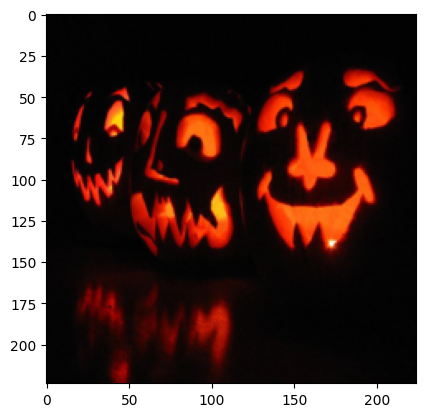

In [28]:
# imsave this to the correct directory (has same name as image but contains all max activ. imagenet imgs)
plt.imshow(  val_data_visualize[29566][0].permute(1, 2, 0)  )
plt.imsave("/workspace/pumpkintest.png",  val_data_visualize[29566][0].permute(1, 2, 0).numpy()  )

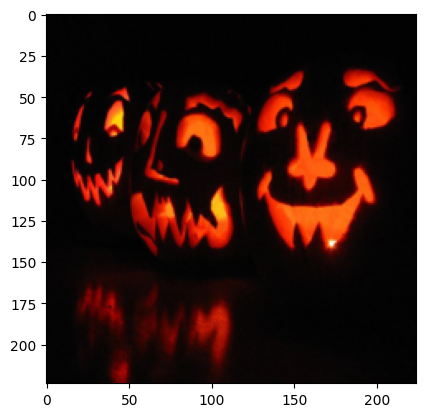

In [29]:
plt.imshow(plt.imread("/workspace/pumpkintest.png"))

In [9]:
cfg.max_image_output_folder

'/workspace/sae_checkpoints/max_images/8e32860c-clip-b-sae-gated-all-tokens-x64-layer-9-mlp-out-v1/layer_9'

### Hierarchical Clustering on MAIs

In [ ]:
# load maximally activating images

In [ ]:
# iterate through directories

In [21]:
from PIL import Image
import os
import IPython

for dir_name in os.listdir(cfg.max_image_output_folder):
    print(os.listdir(cfg.max_image_output_folder + "/" + dir_name))
    print(len(os.listdir(cfg.max_image_output_folder + "/" + dir_name)))
    images = []
    img_dir = cfg.max_image_output_folder + "/" + dir_name
    for imagefile in os.listdir(img_dir)[:1000]:
        IPython.display.Image(img_dir + "/" +imagefile)
        image = preproc(Image.open(img_dir + "/" + imagefile))
        images.append(image)
    with torch.no_grad(), torch.cuda.amp.autocast():
        image_features = og_model.cuda().encode_image(torch.stack(images).cuda())
    break

['neglogfreq_6.397940158843994feauture_id:27991label:pillowbid:28243.png', 'neglogfreq_6.397940158843994feauture_id:27991label:washbasinbid:24625.png', 'neglogfreq_6.397940158843994feauture_id:27991label:ostrichbid:49089.png', 'neglogfreq_6.397940158843994feauture_id:27991label:pillowbid:46169.png', 'neglogfreq_6.397940158843994feauture_id:27991label:yurtbid:9583.png', 'neglogfreq_6.397940158843994feauture_id:27991label:coral_fungusbid:953.png', 'neglogfreq_6.397940158843994feauture_id:27991label:cheetahbid:3772.png', 'neglogfreq_6.397940158843994feauture_id:27991label:king_penguinbid:46965.png', 'neglogfreq_6.397940158843994feauture_id:27991label:microphonebid:10803.png', 'neglogfreq_6.397940158843994feauture_id:27991label:water_ouzelbid:6906.png', 'neglogfreq_6.397940158843994feauture_id:27991label:mosquito_netbid:35221.png', 'neglogfreq_6.397940158843994feauture_id:27991label:whistlebid:46146.png', 'neglogfreq_6.397940158843994feauture_id:27991label:valleybid:32344.png', 'neglogfreq

KeyboardInterrupt: 

In [7]:
dir_name = os.listdir(cfg.max_image_output_folder)[0]
img_dir = cfg.max_image_output_folder + "/" + dir_name
for imagefile in os.listdir(img_dir):
    IPython.display.Image(img_dir + "/" +imagefile)

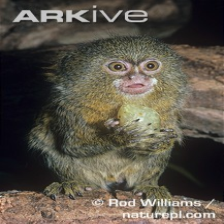

In [8]:
IPython.display.Image(img_dir + "/" + imagefile)

In [9]:
image_features.shape

NameError: name 'image_features' is not defined

In [15]:
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

Z = linkage(image_features, 'single')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z)
plt.show()


NameError: name 'image_features' is not defined